In [ ]:
#Testing NetCDF

In [187]:
from netCDF4 import Dataset
import netCDF4 as nc
import geopandas as gpd
import geoplot as gplt
import pandas as pd
from shapely.geometry import Point
import fiona
import folium
import os
import gzip
import glob
import shutil
import seaborn as sns
from datetime import datetime
import matplotlib.pyplot as plt
current_dir=os.getcwd()
current_dir

'/home/angelica/Documents/py_linux/pylocss/src'

Procedure to get the orbits right
1. Load the data (Lake polygons and orbit directory)
    1.1 For lake orbits decompress files (DONE)
    1.2 Get all the atributes for the pass_number and put them in a dataframe (DONE)
    ##my question, deal with time
2. Get the orbit ID from lake polygon (Pending to automate)
3. Load the orbit id all available tracks (DONE)
   3.1 Intercept with the lake and take only those time
4. Calculate SWE with variables   
5. For fields, convert orbit to shapefile
5. Clip orbits
6. calculate water height
7. Plot height accros the lake
8. Plor height in time 
9. Plot height Vs Gauge height

In [188]:
def decompress(zip_nCDir, unzip_Dir=None, extension=None):
    """ Decompress the files and put then in a unzip folder. 
        Input parameters 
            zip_nCDir: Path to directory where data is located 
            unzip_Dir: (Optional) Parth to new directory with the nc unzip files
            extension: NOT IMPLETEMENTED YET for unzip any folder
        Output 
            unzip_Dir where files were unzip
    """
    #https://stackoverflow.com/questions/12902540/read-from-a-gzip-file-in-python
    files = [f for f in os.listdir(zip_nCDir) if os.path.isfile(os.path.join(zip_nCDir, f))]
    if unzip_Dir is None:
        dir_to_move=zip_nCDir+'unzip/'
    else:
        dir_to_move=zip_nCDir+unzip_Dir+'/'
    dirExist=os.path.exists(dir_to_move)
    #print(dir_to_move)
    if not dirExist:
        os.makedirs(dir_to_move)
        
    for f in files:
        with gzip.open(zip_nCDir+f, 'rb') as f_in:
            with open((zip_nCDir+f)[:-3], 'wb') as f_out:
                shutil.copyfileobj(f_in, f_out)
    
    files = [f for f in os.listdir(zip_nCDir) if (os.path.isfile(os.path.join(zip_nCDir, f))&
                                                  (f.endswith('.nc')))]
    for f in files:    
        #print(f)
        
        shutil.move((zip_nCDir+f), (dir_to_move+f))
    return dir_to_move

# Get orbits in a specific pass
def get_orbit_pass(ncDF_main_dir, orbit, move=None, where_dir=None):
    list_files = []
    if orbit is not None:
        orbit_form='_'+str(orbit)+'_'
        for root, dirs, files in os.walk(ncDF_main_dir):
            files_orbit = [os.path.join(root,f) for f in files if (os.path.isfile(os.path.join(root, f))&
                                               (orbit_form in f)) ]
            if len(files_orbit)!=0:
#            print(files_orbit)
                list_files.append(files_orbit)
    else: #This is not woking proppertly
        for root, dirs, files in os.walk(ncDF_main_dir):
            files_orbit = [os.path.join(root,f) for f in files if os.path.isfile(os.path.join(root, f))]
            if len(files_orbit)!=0:
                print(files_orbit)
                list_files.append(files_orbit)
    if move is not None:
        dirExist=os.path.exists(where_dir)
        #print(dir_to_move)
        if not dirExist:
            os.makedirs(where_dir)
        if move:
            for f in list_files:    
                shutil.move(f[0], where_dir)
        else:
            for f in list_files:    
                shutil.copy(f[0], where_dir)
        list_files = [f for f in os.listdir(where_dir) if os.path.isfile(os.path.join(where_dir, f))]
    #pending defoult what if none        
    return list_files

#funtion to get the retracker data in a dataframe

def nCDF2GeoDF(nCDFObject, field_names, coord_fn=None):
    """
        field_names, has all the names posible including coordinate names, by defautl 
        coordinate name are lat, lon and time
        If those are not the name coord_fn is an optional dictionary that can contain the names
        Pending validate because those names has to be equal en in fieldnames
    """
    if coord_fn is not None:
        lat_fn=coord_fn['lat']
        lon_fn=coord_fn['lon']
        time_fn=coord_fn['time']
    else:
        lat_fn='lat'
        lon_fn='lon'
        time_fn='time'
        
    dic_var=dict()
    for var_fn in field_names:
        dic_var[var_fn]=nCDFObject[var_fn][:]
    
    df=pd.DataFrame.from_dict(dic_var)
    df['geometry']=df.apply(lambda x: Point(((float(x[lon_fn])-360), float(x[lat_fn]))), axis=1)
    #Create the shape list dictionary
    df_geo=gpd.GeoDataFrame(df,geometry='geometry')
    print('Datafram',df_geo.head())
    return df_geo


def add_UTC_column(df_geo, time_fn, UTC_fn):
    """ Take the time col, add 2000-01-01 00:00:00 in seconds and convert seconds to date, preserve seconds
        (Using the convention of 1970 start date
        Input 
            df_geo: DataFrame or GeoDataFrame with the time columns to convert
            time_fn: time column in df_geo
            UTC_fn: name of the time column in UTC to add to df_geo
        Return
            df_geo modified 
            
    """
    sec_2000=datetime.strptime('2000-01-01 00:00:00', '%Y-%m-%d %H:%M:%S').timestamp()
    df_geo[UTC_fn]=pd.to_datetime(df_geo[time_fn]+sec_2000, unit='s')
    return  df_geo

def get_param_variable(df, ncDF, variable, parameter_list=None):
    '''Get the parameters that describe a variables in a NetCDF file
        variable: Variable to get the data from
        parameter_list: [Optional] List with the parameters to extrat. Default, extract all of them
        
    '''
    dict_parameters=ncDF.variables[variable].__dict__
    if parameter_list is None:
        
        for param in dict_parameters.keys():
            if param in dict_parameters:
                list_row=[dict_parameters[param],param,variable]
                list_val=['parameter_val','parameter_name','variable_name']
                df.loc[len(df),list_val]=list_row
    else:
        for param in parameter_list:
            if param in dict_parameters:
                list_row=[dict_parameters[param],param,variable]
                list_val=['parameter_val','parameter_name','variable_name']
                df.loc[len(df),list_val]=list_row

    return df

In [164]:
###TODO: Pendiing validate when the files are already unzip

#nCDir='/home/angelica/Dropbox/Research/LOCSS/data_products/compress/215_Sample/' #It has to end in /
nCDir='/home/angelica/Dropbox/Research/LOCSS/data_products/ftp.aviso.oceanobs.com/'
orbit=215
move=False
destiny_dir=nCDir+'orbit_215/'
dir_to_move='unzip_215'
get_orbit_pass(nCDir, orbit, move, destiny_dir)
dir_to_move=decompress(destiny_dir, dir_to_move)
dir_to_move
#(ncDF_main_dir, orbit=None, move=None, where_dir=None):

'/home/angelica/Dropbox/Research/LOCSS/data_products/ftp.aviso.oceanobs.com/orbit_215/unzip_215/'

In [189]:
dir_to_move

'/home/angelica/Dropbox/Research/LOCSS/data_products/ftp.aviso.oceanobs.com/orbit_215/unzip_215/'

In [38]:
orbit='215'
orbit_form='_'+str(orbit)+'_'
orbit_form

'_215_'

In [190]:
lake_path='/home/angelica/Dropbox/Research/LOCSS/Temp/'
lake_file_name='example_lakes_Agentina.shp'
df_lakes_in_orbit=gpd.read_file(lake_path+lake_file_name)
df_ji_orbit=gpd.read_file('/home/angelica/Dropbox/Research/LOCSS/Denis_tracks/2022-02-02_tracks/2022-02-02_tracks/jason')
df_lakes_in_orbit
#df_ji_orbit

,Hylak_id,Lake_name,Country,Continent,Poly_src,Lake_type,Grand_id,Lake_area,Shore_len,Shore_dev,...,Vol_src,Depth_avg,Dis_avg,Res_time,Elevation,Slope_100,Wshd_area,Pour_long,Pour_lat,geometry
0,10582,None,Argentina,South America,SWBD,1,0,50.67,61.43,2.43,...,3,88.0,29.421,1753.1,640,16.76,766.6,-71.626161,-40.153623,"POLYGON ((-71.44626 -40.14419, -71.44473 -40.1..."


In [192]:
#Measure time this is taking
#Taken from 
    #https://stackoverflow.com/questions/7370801/how-to-measure-elapsed-time-in-python
import timeit

start = timeit.timeit()


#get the required orbit 
files = [f for f in os.listdir(dir_to_move) if os.path.isfile(os.path.join(dir_to_move, f))]


field_names=['lat','lon','time','topography',
            'geoid_EGM96',
            'geoid_EGM2008',
            'swh_ku', 'swh_oce3_ku',
            'ice_range_ku', #ice1 solution
            'alt', #Orbit altitude. Clarify on this Altitude (“alt”,”orb_state_flag_rest”, “alt_20hz”) from the handbook. TODO What the other variables mean
            'range_ice3_ku', #PISTACH solution
            'model_wet_tropo_corr', #Wet Troposphere Correction: is not optimal over non ocean areas due to a possibly inaccurate knowledge of the atmosphere thickness above each altimeter data point
            'model_wet_tropo_corr_direct_sol', #see for updates on its use
            'model_dry_tropo_corr', #Dry toposphere correction standard
            'model_dry_tropo_corr_direct_sol',  #Dry toposphere correction modeled 
            'iono_corr_gim_ku', #Ionosphere Correction TODO: There's also this one, what to choose Altimeter ionospheric correction (“iono_corr_alt_ku”)
            'sea_state_bias_ku', #Sea State Bias Correction for range_ku
            'sea_state_bias_oce3_ku', #Sea State Bias Correction for range_oce3_ku
            'solid_earth_tide', #Solid earth tide correction
            'pole_tide' #pole tide parameter
            ]
meta_var=['mission_name', 'altimeter_sensor_name', 'pass_number','equator_time']
final_df_geo=gpd.GeoDataFrame()
#fill the auxiliar dataframe which containts the scale and offset parameters 
df_aux=pd.DataFrame()
#Get the first netCDF to gather the scale factor and offsets 

for variable in field_names[6:]:
    df_aux=get_param_variable(df_aux, nCDF_data, variable)#, ['add_offset', 'scale_factor','units'])

for f in files:
#     #print(dir_to_move+f)
    nCDF_data = nc.Dataset((dir_to_move+f))
    df_geo=nCDF2GeoDF(nCDF_data, field_names)

    for mv in meta_var:
          df_geo[mv]=nCDF_data.__dict__[mv]
    df_geo=add_UTC_column(df_geo, 'time','UTC_time')
    df_geo['UTC_time']=df_geo['UTC_time'].dt.strftime('%Y-%m-%d %H:%M:%S')
    df_geo.set_crs(epsg=4326, inplace=True)
    df_geo=df_geo.sjoin(df_lakes_in_orbit, how='inner', predicate='intersects') #Work for multiple lakes but only tested with one. Intercept to the lake #TODO ALGO PASO AQUI QUE NO FUNCIONA
    final_df_geo=final_df_geo.append(df_geo)

final_df_geo_corrected=final_df_geo.copy()

for variable in field_names[7:]:
    df_aux_var=df_aux.loc[df_aux['variable_name']==variable]
    offset=df_aux_var.loc[df_aux_var['parameter_name']=='add_offset','parameter_val'].values
    scale=df_aux_var.loc[df_aux_var['parameter_name']=='scale_factor','parameter_val'].values
    if len(offset) == 0:
        offset=0
    else:
        offset=offset[0]
    if len(scale) ==0:
        scale=1
    else:
        scale=scale[0]
    final_df_geo_corrected[variable]=final_df_geo_corrected[variable]*scale+offset

end = timeit.timeit()
print(end - start)

  


/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224090  284.389704  4.908949e+08         NaN      12.4673   
1 -45.221863  284.391706  4.908949e+08         NaN      12.4734   
2 -45.219637  284.393707  4.908949e+08         NaN      12.4795   
3 -45.217410  284.395709  4.908949e+08         NaN      12.4856   
4 -45.215184  284.397710  4.908949e+08         NaN      12.4917   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1957   3.016        3.472  1.349375e+06  1.349386e+06  ...   
1        13.2047   2.547        2.962  1.349374e+06  1.349385e+06  ...   
2        13.2137   3.455        3.220  1.349373e+06  1.349384e+06  ...   
3        13.2225   3.069        2.860  1.349373e+06  1.349384e+06  ...   
4        13.2313   3.715        3.434  1.349372e+06  1.349383e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1567                              NaN   
1               -0.1567

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225855  284.390536  3.615315e+08         NaN      12.4699   
1 -45.223628  284.392538  3.615315e+08         NaN      12.4760   
2 -45.221402  284.394540  3.615315e+08         NaN      12.4821   
3 -45.219175  284.396542  3.615315e+08         NaN      12.4882   
4 -45.216949  284.398544  3.615315e+08         NaN      12.4943   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1977   4.551        4.432  1.349452e+06  1.349463e+06  ...   
1        13.2067   2.807        3.827  1.349452e+06  1.349463e+06  ...   
2        13.2156   3.903        3.921  1.349451e+06  1.349462e+06  ...   
3        13.2245   4.350        4.096  1.349450e+06  1.349461e+06  ...   
4        13.2333   4.989        4.208  1.349450e+06  1.349461e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0740                              NaN   
1               -0.0740

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.227846  284.395498  4.951785e+08         NaN      12.4850   
1 -45.225620  284.397500  4.951785e+08         NaN      12.4911   
2 -45.223394  284.399502  4.951785e+08         NaN      12.4972   
3 -45.221168  284.401503  4.951785e+08         NaN      12.5033   
4 -45.218942  284.403505  4.951785e+08         NaN      12.5095   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2151   5.932        4.936  1.349815e+06  1.349826e+06  ...   
1        13.2240   5.512        5.173  1.349814e+06  1.349826e+06  ...   
2        13.2329   5.450        5.419  1.349813e+06  1.349825e+06  ...   
3        13.2417   5.226        5.213  1.349813e+06  1.349824e+06  ...   
4        13.2505   4.578        5.499  1.349812e+06  1.349824e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0509                              NaN   
1               -0.0509

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222503  284.386238  4.891815e+08         NaN      12.4567   
1 -45.220277  284.388241  4.891815e+08         NaN      12.4628   
2 -45.218050  284.390243  4.891815e+08         NaN      12.4689   
3 -45.215824  284.392245  4.891815e+08         NaN      12.4750   
4 -45.213597  284.394246  4.891815e+08         NaN      12.4811   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1839   1.625        2.323  1.349142e+06  1.349153e+06  ...   
1        13.1929   2.419        2.492  1.349142e+06  1.349153e+06  ...   
2        13.2019   1.819        2.456  1.349141e+06  1.349152e+06  ...   
3        13.2108   2.438        2.390  1.349140e+06  1.349151e+06  ...   
4        13.2196   2.168        2.451  1.349139e+06  1.349150e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0568                              NaN   
1               -0.0568

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222710  284.388212  3.272630e+08         NaN      12.4627   
1 -45.220484  284.390215  3.272630e+08         NaN      12.4688   
2 -45.218257  284.392217  3.272630e+08         NaN      12.4750   
3 -45.216031  284.394219  3.272630e+08         NaN      12.4811   
4 -45.213804  284.396220  3.272630e+08         NaN      12.4872   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1911  -0.048        1.592  1.348950e+06  1.348962e+06  ...   
1        13.2001   0.838        1.489  1.348950e+06  1.348961e+06  ...   
2        13.2091  -0.048        1.416  1.348949e+06  1.348960e+06  ...   
3        13.2179   1.102        2.078  1.348948e+06  1.348960e+06  ...   
4        13.2267   1.695        2.043  1.348947e+06  1.348959e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1035                              NaN   
1               -0.1035

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223255  284.385149  4.549130e+08         NaN      12.4533   
1 -45.221028  284.387151  4.549130e+08         NaN      12.4594   
2 -45.218801  284.389153  4.549130e+08         NaN      12.4655   
3 -45.216575  284.391154  4.549130e+08         NaN      12.4716   
4 -45.214348  284.393156  4.549130e+08         NaN      12.4777   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1793   5.442        6.140  1.349280e+06  1.349292e+06  ...   
1        13.1883   5.001        6.003  1.349279e+06  1.349291e+06  ...   
2        13.1973   4.920        5.722  1.349278e+06  1.349290e+06  ...   
3        13.2062   5.824        5.812  1.349277e+06  1.349290e+06  ...   
4        13.2151   4.079        5.305  1.349277e+06  1.349289e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1123                              NaN   
1               -0.1123

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.227548  284.395953  3.906597e+08         NaN      12.4864   
1 -45.225322  284.397955  3.906597e+08         NaN      12.4925   
2 -45.223095  284.399957  3.906597e+08         NaN      12.4986   
3 -45.220869  284.401959  3.906597e+08         NaN      12.5048   
4 -45.218642  284.403961  3.906597e+08         NaN      12.5109   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2170   4.179        4.302  1.349194e+06  1.349206e+06  ...   
1        13.2259   5.075        4.013  1.349193e+06  1.349205e+06  ...   
2        13.2348   4.108        4.547  1.349193e+06  1.349204e+06  ...   
3        13.2436   5.323        4.376  1.349192e+06  1.349204e+06  ...   
4        13.2523   6.097        4.460  1.349191e+06  1.349203e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0973                              NaN   
1               -0.0973

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225450  284.389627  4.412056e+08         NaN      12.4671   
1 -45.223224  284.391629  4.412056e+08         NaN      12.4732   
2 -45.220998  284.393631  4.412056e+08         NaN      12.4793   
3 -45.218772  284.395633  4.412056e+08         NaN      12.4854   
4 -45.216545  284.397635  4.412056e+08         NaN      12.4915   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1945   1.359        2.142  1.349622e+06  1.349633e+06  ...   
1        13.2035   1.282        2.007  1.349621e+06  1.349632e+06  ...   
2        13.2125   1.967        1.961  1.349621e+06  1.349631e+06  ...   
3        13.2214   2.454        2.030  1.349620e+06  1.349631e+06  ...   
4        13.2302   2.593        2.106  1.349619e+06  1.349630e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0826                              NaN   
1               -0.0826

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226857  284.393571  3.032751e+08         NaN      12.4791   
1 -45.224631  284.395573  3.032751e+08         NaN      12.4853   
2 -45.222404  284.397575  3.032751e+08         NaN      12.4914   
3 -45.220178  284.399576  3.032751e+08         NaN      12.4975   
4 -45.217951  284.401578  3.032751e+08         NaN      12.5036   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2084   2.751        3.106  1.349538e+06  1.349549e+06  ...   
1        13.2174   2.637        2.729  1.349537e+06  1.349549e+06  ...   
2        13.2263   3.219        3.083  1.349537e+06  1.349548e+06  ...   
3        13.2351   3.126        2.909  1.349536e+06  1.349547e+06  ...   
4        13.2439   2.728        3.082  1.349535e+06  1.349546e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0585                              NaN   
1               -0.0586

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224355  284.393067  3.957999e+08         NaN      12.4776   
1 -45.222128  284.395070  3.957999e+08         NaN      12.4837   
2 -45.219902  284.397072  3.957999e+08         NaN      12.4898   
3 -45.217675  284.399073  3.957999e+08         NaN      12.4960   
4 -45.215449  284.401075  3.957999e+08         NaN      12.5021   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2082   3.044        3.159  1.349260e+06  1.349271e+06  ...   
1        13.2171   2.011        2.410  1.349260e+06  1.349271e+06  ...   
2        13.2260   2.833        2.640  1.349259e+06  1.349270e+06  ...   
3        13.2348   2.845        2.751  1.349258e+06  1.349269e+06  ...   
4        13.2436   2.635        2.920  1.349257e+06  1.349268e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0993                              NaN   
1               -0.0992

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223676  284.386539  4.900382e+08         NaN      12.4576   
1 -45.221450  284.388542  4.900382e+08         NaN      12.4637   
2 -45.219223  284.390543  4.900382e+08         NaN      12.4698   
3 -45.216997  284.392545  4.900382e+08         NaN      12.4759   
4 -45.214770  284.394547  4.900382e+08         NaN      12.4820   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1842   5.884        4.380  1.349241e+06  1.349253e+06  ...   
1        13.1932   4.229        4.305  1.349241e+06  1.349252e+06  ...   
2        13.2022   4.389        5.127  1.349240e+06  1.349251e+06  ...   
3        13.2111   5.125        4.238  1.349239e+06  1.349251e+06  ...   
4        13.2199   3.851        4.293  1.349239e+06  1.349250e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0688                              NaN   
1               -0.0688

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225220  284.389253  3.503942e+08         NaN      12.4659   
1 -45.222994  284.391255  3.503942e+08         NaN      12.4720   
2 -45.220767  284.393257  3.503942e+08         NaN      12.4781   
3 -45.218541  284.395259  3.503942e+08         NaN      12.4842   
4 -45.216315  284.397261  3.503942e+08         NaN      12.4903   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1933   2.007        2.485  1.349495e+06  1.349505e+06  ...   
1        13.2023   2.022        2.443  1.349494e+06  1.349504e+06  ...   
2        13.2113   2.471        2.599  1.349493e+06  1.349504e+06  ...   
3        13.2201   2.619        3.025  1.349492e+06  1.349503e+06  ...   
4        13.2290   2.389        2.540  1.349492e+06  1.349502e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0948                              NaN   
1               -0.0948

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222413  284.385397  4.540563e+08         NaN      12.4541   
1 -45.220187  284.387399  4.540563e+08         NaN      12.4602   
2 -45.217960  284.389400  4.540563e+08         NaN      12.4663   
3 -45.215734  284.391402  4.540563e+08         NaN      12.4724   
4 -45.213507  284.393403  4.540563e+08         NaN      12.4785   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1808   1.277        1.862  1.349319e+06  1.349330e+06  ...   
1        13.1898   2.209        1.931  1.349318e+06  1.349329e+06  ...   
2        13.1988   2.063        1.909  1.349318e+06  1.349328e+06  ...   
3        13.2077   2.217        2.115  1.349317e+06  1.349328e+06  ...   
4        13.2166   1.557        1.885  1.349316e+06  1.349327e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0480                              NaN   
1               -0.0480

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224299  284.391724  3.246929e+08         NaN      12.4735   
1 -45.222072  284.393727  3.246929e+08         NaN      12.4796   
2 -45.219846  284.395729  3.246929e+08         NaN      12.4857   
3 -45.217619  284.397731  3.246929e+08         NaN      12.4918   
4 -45.215393  284.399733  3.246929e+08         NaN      12.4979   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2032   3.443        2.656  1.349011e+06  1.349022e+06  ...   
1        13.2122   3.605        2.787  1.349010e+06  1.349021e+06  ...   
2        13.2211   3.614        2.523  1.349010e+06  1.349021e+06  ...   
3        13.2299   2.820        3.065  1.349009e+06  1.349020e+06  ...   
4        13.2387   2.498        2.988  1.349008e+06  1.349019e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0927                              NaN   
1               -0.0927

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223908  284.390456  3.161258e+08         NaN      12.4696   
1 -45.221681  284.392458  3.161258e+08         NaN      12.4757   
2 -45.219454  284.394460  3.161258e+08         NaN      12.4819   
3 -45.217228  284.396462  3.161258e+08         NaN      12.4880   
4 -45.215001  284.398463  3.161258e+08         NaN      12.4941   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1987   3.093        2.705  1.349254e+06  1.349266e+06  ...   
1        13.2077   3.200        2.726  1.349254e+06  1.349265e+06  ...   
2        13.2166   3.056        2.788  1.349253e+06  1.349264e+06  ...   
3        13.2254   3.831        2.677  1.349252e+06  1.349264e+06  ...   
4        13.2342   2.542        2.555  1.349251e+06  1.349263e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0907                              NaN   
1               -0.0907

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224871  284.389665  3.666717e+08         NaN      12.4672   
1 -45.222644  284.391667  3.666717e+08         NaN      12.4733   
2 -45.220418  284.393669  3.666717e+08         NaN      12.4794   
3 -45.218192  284.395671  3.666717e+08         NaN      12.4855   
4 -45.215965  284.397673  3.666717e+08         NaN      12.4917   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1951   2.468        2.171  1.349321e+06  1.349332e+06  ...   
1        13.2041   2.223        2.400  1.349320e+06  1.349331e+06  ...   
2        13.2130   2.860        2.626  1.349320e+06  1.349330e+06  ...   
3        13.2219   2.740        2.170  1.349319e+06  1.349330e+06  ...   
4        13.2307   1.632        2.536  1.349318e+06  1.349329e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0583                              NaN   
1               -0.0583

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -41.377233  286.151477  5.461532e+08         NaN      16.7898   
1 -41.374940  286.153217  5.461532e+08         NaN      16.8003   
2 -41.372648  286.154957  5.461532e+08         NaN      16.8108   
3 -41.370355  286.156697  5.461532e+08         NaN      16.8212   
4 -41.368063  286.158437  5.461532e+08         NaN      16.8317   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        17.7198     NaN          NaN  1.347948e+06  1.347965e+06  ...   
1        17.7339     NaN          NaN  1.347949e+06  1.347965e+06  ...   
2        17.7486     NaN          NaN  1.347947e+06  1.347964e+06  ...   
3        17.7633     NaN          NaN  1.347947e+06  1.347963e+06  ...   
4        17.7780     NaN          NaN  1.347947e+06  1.347962e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1165                              NaN   
1               -0.1171

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -41.374218  286.152569  5.470099e+08         NaN      16.7980   
1 -41.371926  286.154309  5.470099e+08         NaN      16.8085   
2 -41.369633  286.156048  5.470099e+08         NaN      16.8190   
3 -41.367341  286.157788  5.470099e+08         NaN      16.8294   
4 -41.365048  286.159527  5.470099e+08         NaN      16.8399   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        17.7302     NaN          NaN  1.347867e+06  1.347884e+06  ...   
1        17.7449     NaN          NaN  1.347867e+06  1.347883e+06  ...   
2        17.7595     NaN          NaN  1.347866e+06  1.347882e+06  ...   
3        17.7742     NaN          NaN  1.347866e+06  1.347881e+06  ...   
4        17.7890     NaN          NaN  1.347865e+06  1.347881e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1532                              NaN   
1               -0.1532

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223096  284.385304  3.067019e+08         NaN      12.4538   
1 -45.220870  284.387306  3.067019e+08         NaN      12.4599   
2 -45.218644  284.389308  3.067019e+08         NaN      12.4660   
3 -45.216417  284.391310  3.067019e+08         NaN      12.4722   
4 -45.214191  284.393311  3.067019e+08         NaN      12.4783   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1800   3.500        3.556  1.349438e+06  1.349450e+06  ...   
1        13.1890   4.217        3.673  1.349437e+06  1.349449e+06  ...   
2        13.1980   3.425        3.622  1.349437e+06  1.349448e+06  ...   
3        13.2069   3.876        3.613  1.349436e+06  1.349447e+06  ...   
4        13.2158   3.324        3.516  1.349435e+06  1.349447e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1086                              NaN   
1               -0.1087

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225690  284.394277  2.835707e+08         NaN      12.4813   
1 -45.223464  284.396279  2.835707e+08         NaN      12.4874   
2 -45.221237  284.398280  2.835707e+08         NaN      12.4935   
3 -45.219011  284.400282  2.835707e+08         NaN      12.4997   
4 -45.216784  284.402283  2.835707e+08         NaN      12.5058   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2119   2.543        2.590  1.349528e+06  1.349540e+06  ...   
1        13.2208   2.336        2.683  1.349527e+06  1.349539e+06  ...   
2        13.2297   2.446        2.399  1.349527e+06  1.349538e+06  ...   
3        13.2385   2.002        2.802  1.349526e+06  1.349538e+06  ...   
4        13.2472   2.595        2.824  1.349525e+06  1.349537e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1361                              NaN   
1               -0.1361

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225758  284.391070  3.786657e+08         NaN      12.4715   
1 -45.223532  284.393072  3.786657e+08         NaN      12.4776   
2 -45.221305  284.395074  3.786657e+08         NaN      12.4837   
3 -45.219079  284.397076  3.786657e+08         NaN      12.4898   
4 -45.216852  284.399077  3.786657e+08         NaN      12.4959   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1997   2.122        2.932  1.349393e+06  1.349403e+06  ...   
1        13.2087   2.615        2.950  1.349392e+06  1.349403e+06  ...   
2        13.2177   2.381        2.940  1.349391e+06  1.349402e+06  ...   
3        13.2265   2.557        2.927  1.349390e+06  1.349401e+06  ...   
4        13.2353   2.060        2.830  1.349390e+06  1.349400e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1436                              NaN   
1               -0.1436

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223956  284.389981  3.478241e+08         NaN      12.4682   
1 -45.221730  284.391983  3.478241e+08         NaN      12.4743   
2 -45.219503  284.393985  3.478241e+08         NaN      12.4804   
3 -45.217277  284.395986  3.478241e+08         NaN      12.4865   
4 -45.215050  284.397987  3.478241e+08         NaN      12.4926   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1969   2.241        2.012  1.349341e+06  1.349352e+06  ...   
1        13.2059   3.012        2.183  1.349340e+06  1.349351e+06  ...   
2        13.2148   2.139        2.147  1.349340e+06  1.349351e+06  ...   
3        13.2236   2.049        1.891  1.349339e+06  1.349350e+06  ...   
4        13.2324   1.919        2.231  1.349338e+06  1.349349e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0768                              NaN   
1               -0.0767

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223413  284.386272  5.028889e+08         NaN      12.4568   
1 -45.221187  284.388274  5.028889e+08         NaN      12.4629   
2 -45.218961  284.390276  5.028889e+08         NaN      12.4690   
3 -45.216735  284.392277  5.028889e+08         NaN      12.4751   
4 -45.214509  284.394278  5.028889e+08         NaN      12.4812   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1834   3.912        3.751  1.349760e+06  1.349771e+06  ...   
1        13.1924   3.637        3.428  1.349759e+06  1.349770e+06  ...   
2        13.2014   3.982        3.776  1.349758e+06  1.349770e+06  ...   
3        13.2103   3.802        3.500  1.349758e+06  1.349769e+06  ...   
4        13.2191   4.112        3.801  1.349757e+06  1.349768e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0896                              NaN   
1               -0.0896

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224014  284.389703  3.289764e+08         NaN      12.4673   
1 -45.221787  284.391705  3.289764e+08         NaN      12.4734   
2 -45.219561  284.393707  3.289764e+08         NaN      12.4796   
3 -45.217334  284.395709  3.289764e+08         NaN      12.4857   
4 -45.215108  284.397711  3.289764e+08         NaN      12.4918   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1958   4.840        4.255  1.349171e+06  1.349183e+06  ...   
1        13.2048   4.368        3.982  1.349171e+06  1.349182e+06  ...   
2        13.2137   5.084        4.368  1.349170e+06  1.349181e+06  ...   
3        13.2226   4.061        4.418  1.349169e+06  1.349180e+06  ...   
4        13.2314   3.977        4.379  1.349169e+06  1.349180e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1610                              NaN   
1               -0.1610

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225462  284.395479  4.292117e+08         NaN      12.4849   
1 -45.223235  284.397481  4.292117e+08         NaN      12.4911   
2 -45.221009  284.399483  4.292117e+08         NaN      12.4972   
3 -45.218783  284.401485  4.292117e+08         NaN      12.5033   
4 -45.216556  284.403487  4.292117e+08         NaN      12.5094   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2165   3.554        3.406  1.349377e+06  1.349389e+06  ...   
1        13.2254   4.338        3.941  1.349376e+06  1.349388e+06  ...   
2        13.2343   3.856        3.760  1.349375e+06  1.349388e+06  ...   
3        13.2431   3.259        3.604  1.349375e+06  1.349387e+06  ...   
4        13.2518   4.636        3.970  1.349374e+06  1.349386e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0527                              NaN   
1               -0.0527

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.221975  284.387225  2.861409e+08         NaN      12.4597   
1 -45.219748  284.389227  2.861409e+08         NaN      12.4658   
2 -45.217522  284.391229  2.861409e+08         NaN      12.4719   
3 -45.215295  284.393230  2.861409e+08         NaN      12.4780   
4 -45.213068  284.395231  2.861409e+08         NaN      12.4841   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1879   4.150        3.981  1.349226e+06  1.349237e+06  ...   
1        13.1969   3.481        3.823  1.349226e+06  1.349237e+06  ...   
2        13.2059   3.668        3.818  1.349225e+06  1.349236e+06  ...   
3        13.2148   3.333        3.658  1.349224e+06  1.349235e+06  ...   
4        13.2236   4.468        4.095  1.349223e+06  1.349234e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0680                              NaN   
1               -0.0680

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226070  284.391345  2.707200e+08         NaN      12.4723   
1 -45.223844  284.393347  2.707200e+08         NaN      12.4784   
2 -45.221617  284.395349  2.707200e+08         NaN      12.4845   
3 -45.219391  284.397351  2.707200e+08         NaN      12.4907   
4 -45.217165  284.399352  2.707200e+08         NaN      12.4968   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2006   6.068        4.764  1.349668e+06  1.349679e+06  ...   
1        13.2096   6.271        4.631  1.349667e+06  1.349678e+06  ...   
2        13.2185   6.423        5.242  1.349666e+06  1.349677e+06  ...   
3        13.2274   5.052        4.767  1.349665e+06  1.349677e+06  ...   
4        13.2362   4.694        4.945  1.349665e+06  1.349676e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0617                              NaN   
1               -0.0617

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.221885  284.382276  3.212660e+08         NaN      12.4444   
1 -45.219658  284.384278  3.212660e+08         NaN      12.4505   
2 -45.217432  284.386280  3.212660e+08         NaN      12.4566   
3 -45.215206  284.388282  3.212660e+08         NaN      12.4627   
4 -45.212979  284.390283  3.212660e+08         NaN      12.4688   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1695   2.559        2.279  1.349400e+06  1.349411e+06  ...   
1        13.1786   2.421        2.628  1.349399e+06  1.349411e+06  ...   
2        13.1876   2.584        2.489  1.349398e+06  1.349410e+06  ...   
3        13.1966   2.385        2.434  1.349398e+06  1.349409e+06  ...   
4        13.2055   2.382        2.691  1.349397e+06  1.349408e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1408                              NaN   
1               -0.1408

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225868  284.391665  4.403489e+08         NaN      12.4733   
1 -45.223642  284.393667  4.403489e+08         NaN      12.4794   
2 -45.221416  284.395669  4.403489e+08         NaN      12.4856   
3 -45.219189  284.397671  4.403489e+08         NaN      12.4917   
4 -45.216963  284.399672  4.403489e+08         NaN      12.4978   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2019   3.299        3.085  1.349554e+06  1.349566e+06  ...   
1        13.2109   4.355        3.254  1.349554e+06  1.349565e+06  ...   
2        13.2198   2.508        3.119  1.349553e+06  1.349564e+06  ...   
3        13.2287   2.801        3.024  1.349552e+06  1.349564e+06  ...   
4        13.2375   2.800        3.180  1.349551e+06  1.349563e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1793                              NaN   
1               -0.1793

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223163  284.390789  5.174530e+08         NaN      12.4706   
1 -45.220937  284.392791  5.174530e+08         NaN      12.4767   
2 -45.218710  284.394793  5.174530e+08         NaN      12.4829   
3 -45.216483  284.396795  5.174530e+08         NaN      12.4890   
4 -45.214257  284.398796  5.174530e+08         NaN      12.4951   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2004   1.750        1.852  1.349156e+06  1.349167e+06  ...   
1        13.2094   1.942        1.772  1.349156e+06  1.349166e+06  ...   
2        13.2183   1.997        1.649  1.349155e+06  1.349166e+06  ...   
3        13.2271   1.878        1.801  1.349154e+06  1.349165e+06  ...   
4        13.2359   1.321        1.615  1.349153e+06  1.349164e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1126                              NaN   
1               -0.1127

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222827  284.389534  2.972781e+08         NaN      12.4668   
1 -45.220601  284.391537  2.972781e+08         NaN      12.4729   
2 -45.218374  284.393539  2.972781e+08         NaN      12.4790   
3 -45.216148  284.395540  2.972781e+08         NaN      12.4851   
4 -45.213921  284.397542  2.972781e+08         NaN      12.4912   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1960   2.655        2.657  1.349107e+06  1.349118e+06  ...   
1        13.2050   2.989        2.621  1.349106e+06  1.349117e+06  ...   
2        13.2139   2.538        2.463  1.349105e+06  1.349116e+06  ...   
3        13.2227   2.553        2.282  1.349105e+06  1.349115e+06  ...   
4        13.2315   2.572        2.606  1.349104e+06  1.349115e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1549                              NaN   
1               -0.1548

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226737  284.394364  3.743821e+08         NaN      12.4816   
1 -45.224511  284.396366  3.743821e+08         NaN      12.4877   
2 -45.222285  284.398367  3.743821e+08         NaN      12.4938   
3 -45.220058  284.400369  3.743821e+08         NaN      12.4999   
4 -45.217832  284.402370  3.743821e+08         NaN      12.5060   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2115   3.496        2.994  1.349734e+06  1.349746e+06  ...   
1        13.2205   2.851        2.899  1.349734e+06  1.349745e+06  ...   
2        13.2293   3.750        2.867  1.349733e+06  1.349744e+06  ...   
3        13.2382   3.332        2.621  1.349732e+06  1.349744e+06  ...   
4        13.2469   2.659        2.717  1.349732e+06  1.349743e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1516                              NaN   
1               -0.1516

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -41.380730  286.151744  5.324458e+08         NaN      16.7874   
1 -41.378438  286.153484  5.324458e+08         NaN      16.7978   
2 -41.376146  286.155224  5.324458e+08         NaN      16.8083   
3 -41.373854  286.156964  5.324458e+08         NaN      16.8187   
4 -41.371561  286.158703  5.324458e+08         NaN      16.8292   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        17.7186   4.146          NaN  1.348412e+06  1.348429e+06  ...   
1        17.7327   1.809          NaN  1.348411e+06  1.348428e+06  ...   
2        17.7468   2.455          NaN  1.348410e+06  1.348427e+06  ...   
3        17.7612     NaN          NaN  1.348408e+06  1.348427e+06  ...   
4        17.7759     NaN          NaN  1.348408e+06  1.348426e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1293                              NaN   
1               -0.1291

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223743  284.391764  4.386355e+08         NaN      12.4736   
1 -45.221517  284.393765  4.386355e+08         NaN      12.4797   
2 -45.219290  284.395767  4.386355e+08         NaN      12.4859   
3 -45.217064  284.397769  4.386355e+08         NaN      12.4920   
4 -45.214837  284.399770  4.386355e+08         NaN      12.4981   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2037   3.908        4.410  1.349486e+06  1.349497e+06  ...   
1        13.2127   4.742        4.325  1.349485e+06  1.349496e+06  ...   
2        13.2215   3.651        4.278  1.349484e+06  1.349496e+06  ...   
3        13.2304   3.686        4.173  1.349484e+06  1.349495e+06  ...   
4        13.2391   4.670        4.252  1.349483e+06  1.349494e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0579                              NaN   
1               -0.0579

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224913  284.388828  4.686204e+08         NaN      12.4646   
1 -45.222686  284.390830  4.686204e+08         NaN      12.4707   
2 -45.220460  284.392832  4.686204e+08         NaN      12.4768   
3 -45.218234  284.394834  4.686204e+08         NaN      12.4830   
4 -45.216007  284.396835  4.686204e+08         NaN      12.4891   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1919   6.803        5.808  1.349433e+06  1.349444e+06  ...   
1        13.2009   6.387        5.612  1.349432e+06  1.349444e+06  ...   
2        13.2099   6.107        5.741  1.349431e+06  1.349443e+06  ...   
3        13.2188   6.166        5.717  1.349431e+06  1.349442e+06  ...   
4        13.2276   5.609        5.859  1.349430e+06  1.349441e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0698                              NaN   
1               -0.0698

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226261  284.395262  3.846627e+08         NaN      12.4843   
1 -45.224034  284.397264  3.846627e+08         NaN      12.4904   
2 -45.221808  284.399266  3.846627e+08         NaN      12.4966   
3 -45.219581  284.401268  3.846627e+08         NaN      12.5027   
4 -45.217355  284.403270  3.846627e+08         NaN      12.5088   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2152   2.563        3.419  1.349192e+06  1.349204e+06  ...   
1        13.2241   2.574        3.795  1.349192e+06  1.349203e+06  ...   
2        13.2330   1.509        3.469  1.349191e+06  1.349202e+06  ...   
3        13.2418   2.543        3.072  1.349190e+06  1.349202e+06  ...   
4        13.2505   1.444        2.842  1.349189e+06  1.349201e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1348                              NaN   
1               -0.1348

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226782  284.392918  3.700986e+08         NaN      12.4772   
1 -45.224556  284.394921  3.700986e+08         NaN      12.4833   
2 -45.222329  284.396922  3.700986e+08         NaN      12.4894   
3 -45.220103  284.398924  3.700986e+08         NaN      12.4955   
4 -45.217877  284.400926  3.700986e+08         NaN      12.5016   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2060   2.279        2.500  1.349728e+06  1.349740e+06  ...   
1        13.2150   1.726        2.205  1.349727e+06  1.349739e+06  ...   
2        13.2239   1.898        2.068  1.349727e+06  1.349738e+06  ...   
3        13.2328   2.707        2.406  1.349726e+06  1.349738e+06  ...   
4        13.2416   1.662        2.250  1.349725e+06  1.349737e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1206                              NaN   
1               -0.1206

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223174  284.388336  3.555345e+08         NaN      12.4631   
1 -45.220947  284.390339  3.555345e+08         NaN      12.4692   
2 -45.218721  284.392341  3.555345e+08         NaN      12.4753   
3 -45.216494  284.394343  3.555345e+08         NaN      12.4814   
4 -45.214267  284.396345  3.555345e+08         NaN      12.4875   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1913   2.728        3.347  1.349022e+06  1.349032e+06  ...   
1        13.2003   4.266        3.189  1.349021e+06  1.349032e+06  ...   
2        13.2092   2.858        3.198  1.349020e+06  1.349031e+06  ...   
3        13.2181   3.040        2.948  1.349020e+06  1.349030e+06  ...   
4        13.2269   3.211        3.335  1.349019e+06  1.349029e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1050                              NaN   
1               -0.1051

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224145  284.387850  3.169825e+08         NaN      12.4616   
1 -45.221919  284.389852  3.169825e+08         NaN      12.4677   
2 -45.219692  284.391854  3.169825e+08         NaN      12.4739   
3 -45.217465  284.393856  3.169825e+08         NaN      12.4800   
4 -45.215239  284.395857  3.169825e+08         NaN      12.4861   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1888   2.802        2.953  1.349226e+06  1.349237e+06  ...   
1        13.1978   2.174        3.080  1.349225e+06  1.349236e+06  ...   
2        13.2067   2.794        2.670  1.349224e+06  1.349236e+06  ...   
3        13.2156   2.293        2.727  1.349224e+06  1.349235e+06  ...   
4        13.2245   3.165        2.708  1.349223e+06  1.349234e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0821                              NaN   
1               -0.0821

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222482  284.386857  2.792872e+08         NaN      12.4585   
1 -45.220256  284.388858  2.792872e+08         NaN      12.4647   
2 -45.218029  284.390860  2.792872e+08         NaN      12.4708   
3 -45.215803  284.392861  2.792872e+08         NaN      12.4769   
4 -45.213577  284.394863  2.792872e+08         NaN      12.4830   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1862   3.438        2.798  1.349822e+06  1.349833e+06  ...   
1        13.1952   1.979        2.767  1.349821e+06  1.349833e+06  ...   
2        13.2042   2.773        3.002  1.349820e+06  1.349832e+06  ...   
3        13.2131   2.537        2.989  1.349820e+06  1.349831e+06  ...   
4        13.2219   2.650        3.013  1.349819e+06  1.349830e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0859                              NaN   
1               -0.0859

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222526  284.388505  4.531996e+08         NaN      12.4636   
1 -45.220300  284.390507  4.531996e+08         NaN      12.4697   
2 -45.218073  284.392508  4.531996e+08         NaN      12.4758   
3 -45.215847  284.394510  4.531996e+08         NaN      12.4819   
4 -45.213620  284.396511  4.531996e+08         NaN      12.4880   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1923   3.604        3.937  1.349321e+06  1.349332e+06  ...   
1        13.2013   3.446        3.841  1.349321e+06  1.349332e+06  ...   
2        13.2103   4.246        3.922  1.349320e+06  1.349331e+06  ...   
3        13.2191   3.657        3.982  1.349319e+06  1.349330e+06  ...   
4        13.2279   3.585        3.914  1.349318e+06  1.349329e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0549                              NaN   
1               -0.0549

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.227038  284.397600  4.043670e+08         NaN      12.4915   
1 -45.224812  284.399602  4.043670e+08         NaN      12.4976   
2 -45.222586  284.401604  4.043670e+08         NaN      12.5037   
3 -45.220360  284.403605  4.043670e+08         NaN      12.5098   
4 -45.218134  284.405607  4.043670e+08         NaN      12.5159   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2235   4.006        3.407  1.349806e+06  1.349818e+06  ...   
1        13.2324   3.849        3.348  1.349806e+06  1.349817e+06  ...   
2        13.2413   2.458        3.309  1.349805e+06  1.349816e+06  ...   
3        13.2500   2.872        3.323  1.349804e+06  1.349815e+06  ...   
4        13.2587   3.444        3.390  1.349804e+06  1.349815e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0654                              NaN   
1               -0.0654

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -41.363763  286.154153  5.358727e+08         NaN      16.8164   
1 -41.361471  286.155892  5.358727e+08         NaN      16.8270   
2 -41.359179  286.157631  5.358727e+08         NaN      16.8376   
3 -41.356886  286.159370  5.358727e+08         NaN      16.8482   
4 -41.354594  286.161109  5.358727e+08         NaN      16.8588   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        17.7529     NaN          NaN  1.348340e+06  1.348355e+06  ...   
1        17.7676     NaN          NaN  1.348339e+06  1.348355e+06  ...   
2        17.7823     NaN          NaN  1.348338e+06  1.348354e+06  ...   
3        17.7971     NaN          NaN  1.348337e+06  1.348353e+06  ...   
4        17.8119     NaN          NaN  1.348336e+06  1.348352e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0948                              NaN   
1               -0.0947

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225253  284.394961  5.277335e+08         NaN      12.4834   
1 -45.223026  284.396962  5.277335e+08         NaN      12.4895   
2 -45.220800  284.398964  5.277335e+08         NaN      12.4956   
3 -45.218574  284.400966  5.277335e+08         NaN      12.5018   
4 -45.216347  284.402967  5.277335e+08         NaN      12.5079   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2147   5.146        4.858  1.349574e+06  1.349585e+06  ...   
1        13.2236   5.167        4.149  1.349574e+06  1.349585e+06  ...   
2        13.2325   3.860        4.568  1.349573e+06  1.349584e+06  ...   
3        13.2413   4.204        4.606  1.349572e+06  1.349583e+06  ...   
4        13.2500   3.090        4.627  1.349571e+06  1.349582e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0722                              NaN   
1               -0.0722

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222350  284.384546  2.895677e+08         NaN      12.4514   
1 -45.220124  284.386548  2.895677e+08         NaN      12.4575   
2 -45.217897  284.388550  2.895677e+08         NaN      12.4636   
3 -45.215671  284.390551  2.895677e+08         NaN      12.4697   
4 -45.213444  284.392553  2.895677e+08         NaN      12.4758   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1777   2.637        3.555  1.349405e+06  1.349416e+06  ...   
1        13.1867   3.515        3.431  1.349404e+06  1.349415e+06  ...   
2        13.1957   4.018        3.410  1.349403e+06  1.349415e+06  ...   
3        13.2046   3.314        3.422  1.349402e+06  1.349414e+06  ...   
4        13.2135   2.886        3.760  1.349402e+06  1.349413e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0774                              NaN   
1               -0.0774

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223938  284.386185  2.887110e+08         NaN      12.4565   
1 -45.221711  284.388187  2.887110e+08         NaN      12.4626   
2 -45.219485  284.390189  2.887110e+08         NaN      12.4687   
3 -45.217258  284.392190  2.887110e+08         NaN      12.4748   
4 -45.215031  284.394192  2.887110e+08         NaN      12.4809   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1827   3.272        2.002  1.349338e+06  1.349349e+06  ...   
1        13.1917   1.452        2.033  1.349337e+06  1.349348e+06  ...   
2        13.2007   2.462        1.932  1.349336e+06  1.349348e+06  ...   
3        13.2096   2.106        1.948  1.349336e+06  1.349347e+06  ...   
4        13.2185   2.213        2.143  1.349335e+06  1.349346e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0898                              NaN   
1               -0.0898

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224957  284.388122  3.126989e+08         NaN      12.4625   
1 -45.222730  284.390124  3.126989e+08         NaN      12.4686   
2 -45.220504  284.392126  3.126989e+08         NaN      12.4747   
3 -45.218278  284.394128  3.126989e+08         NaN      12.4808   
4 -45.216052  284.396129  3.126989e+08         NaN      12.4869   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1892   3.829        3.486  1.349726e+06  1.349737e+06  ...   
1        13.1983   3.944        3.734  1.349725e+06  1.349736e+06  ...   
2        13.2072   4.167        3.398  1.349724e+06  1.349736e+06  ...   
3        13.2161   3.824        3.511  1.349724e+06  1.349735e+06  ...   
4        13.2250   2.913        3.494  1.349723e+06  1.349734e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0894                              NaN   
1               -0.0894

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224241  284.391189  3.718120e+08         NaN      12.4718   
1 -45.222016  284.393191  3.718120e+08         NaN      12.4779   
2 -45.219790  284.395193  3.718120e+08         NaN      12.4841   
3 -45.217564  284.397194  3.718120e+08         NaN      12.4902   
4 -45.215338  284.399196  3.718120e+08         NaN      12.4963   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2012   3.412        3.064  1.349911e+06  1.349922e+06  ...   
1        13.2102   2.478        3.016  1.349910e+06  1.349921e+06  ...   
2        13.2191   2.782        3.050  1.349909e+06  1.349920e+06  ...   
3        13.2279   3.810        3.337  1.349909e+06  1.349919e+06  ...   
4        13.2367   2.721        3.072  1.349908e+06  1.349919e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0686                              NaN   
1               -0.0685

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225511  284.393247  4.035103e+08         NaN      12.4782   
1 -45.223285  284.395249  4.035103e+08         NaN      12.4843   
2 -45.221059  284.397251  4.035103e+08         NaN      12.4904   
3 -45.218833  284.399253  4.035103e+08         NaN      12.4965   
4 -45.216607  284.401254  4.035103e+08         NaN      12.5026   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2081   1.596        1.427  1.349857e+06  1.349868e+06  ...   
1        13.2171   1.112        1.340  1.349856e+06  1.349867e+06  ...   
2        13.2259   2.067        1.883  1.349855e+06  1.349866e+06  ...   
3        13.2348   1.953        1.597  1.349855e+06  1.349866e+06  ...   
4        13.2435   1.108        1.512  1.349854e+06  1.349865e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0686                              NaN   
1               -0.0686

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224352  284.392083  3.923731e+08         NaN      12.4746   
1 -45.222126  284.394085  3.923731e+08         NaN      12.4807   
2 -45.219899  284.396087  3.923731e+08         NaN      12.4869   
3 -45.217673  284.398089  3.923731e+08         NaN      12.4930   
4 -45.215446  284.400090  3.923731e+08         NaN      12.4991   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2045   3.821        3.274  1.349375e+06  1.349387e+06  ...   
1        13.2135   3.782        3.032  1.349375e+06  1.349386e+06  ...   
2        13.2223   3.023        2.988  1.349374e+06  1.349385e+06  ...   
3        13.2312   4.638        3.002  1.349373e+06  1.349384e+06  ...   
4        13.2399   2.732        3.054  1.349372e+06  1.349384e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0986                              NaN   
1               -0.0986

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.227025  284.393864  3.769523e+08         NaN      12.4801   
1 -45.224798  284.395866  3.769523e+08         NaN      12.4862   
2 -45.222572  284.397868  3.769523e+08         NaN      12.4923   
3 -45.220346  284.399870  3.769523e+08         NaN      12.4984   
4 -45.218119  284.401872  3.769523e+08         NaN      12.5045   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2094   3.527        3.721  1.349393e+06  1.349404e+06  ...   
1        13.2184   2.929        3.568  1.349393e+06  1.349403e+06  ...   
2        13.2273   3.341        3.469  1.349392e+06  1.349403e+06  ...   
3        13.2361   3.591        3.577  1.349391e+06  1.349402e+06  ...   
4        13.2449   3.337        3.431  1.349390e+06  1.349401e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1197                              NaN   
1               -0.1197

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226445  284.394026  3.589613e+08         NaN      12.4805   
1 -45.224218  284.396028  3.589613e+08         NaN      12.4866   
2 -45.221992  284.398030  3.589613e+08         NaN      12.4927   
3 -45.219765  284.400032  3.589613e+08         NaN      12.4989   
4 -45.217538  284.402034  3.589613e+08         NaN      12.5050   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2104   2.092        3.049  1.349117e+06  1.349128e+06  ...   
1        13.2194   2.870        3.301  1.349116e+06  1.349128e+06  ...   
2        13.2283   3.436        3.447  1.349115e+06  1.349127e+06  ...   
3        13.2371   3.054        3.051  1.349114e+06  1.349126e+06  ...   
4        13.2459   2.793        3.115  1.349113e+06  1.349125e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1620                              NaN   
1               -0.1620

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223809  284.392307  3.306899e+08         NaN      12.4752   
1 -45.221582  284.394309  3.306899e+08         NaN      12.4813   
2 -45.219356  284.396311  3.306899e+08         NaN      12.4875   
3 -45.217129  284.398312  3.306899e+08         NaN      12.4936   
4 -45.214903  284.400314  3.306899e+08         NaN      12.4997   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2057   7.101        6.058  1.349412e+06  1.349423e+06  ...   
1        13.2146   5.893        6.021  1.349411e+06  1.349423e+06  ...   
2        13.2235   5.441        5.750  1.349410e+06  1.349422e+06  ...   
3        13.2323   6.221        6.039  1.349410e+06  1.349421e+06  ...   
4        13.2411   6.074        6.180  1.349409e+06  1.349420e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0644                              NaN   
1               -0.0644

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222327  284.386301  2.810006e+08         NaN      12.4568   
1 -45.220101  284.388303  2.810006e+08         NaN      12.4630   
2 -45.217875  284.390305  2.810006e+08         NaN      12.4691   
3 -45.215649  284.392306  2.810006e+08         NaN      12.4752   
4 -45.213423  284.394308  2.810006e+08         NaN      12.4813   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1842   3.909        2.079  1.349875e+06  1.349885e+06  ...   
1        13.1933   2.403        2.110  1.349874e+06  1.349885e+06  ...   
2        13.2022   2.272        1.972  1.349873e+06  1.349884e+06  ...   
3        13.2111   1.803        1.708  1.349873e+06  1.349883e+06  ...   
4        13.2199   2.693        1.894  1.349872e+06  1.349882e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1132                              NaN   
1               -0.1132

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226582  284.395570  4.060805e+08         NaN      12.4853   
1 -45.224356  284.397572  4.060805e+08         NaN      12.4914   
2 -45.222129  284.399574  4.060805e+08         NaN      12.4975   
3 -45.219903  284.401576  4.060805e+08         NaN      12.5036   
4 -45.217676  284.403577  4.060805e+08         NaN      12.5097   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2161   2.567        2.615  1.349591e+06  1.349602e+06  ...   
1        13.2251   2.433        2.626  1.349590e+06  1.349601e+06  ...   
2        13.2339   2.224        2.341  1.349589e+06  1.349600e+06  ...   
3        13.2428   2.338        2.851  1.349588e+06  1.349600e+06  ...   
4        13.2515   2.622        2.493  1.349588e+06  1.349599e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0628                              NaN   
1               -0.0629

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224130  284.391395  4.823278e+08         NaN      12.4725   
1 -45.221903  284.393396  4.823278e+08         NaN      12.4786   
2 -45.219676  284.395398  4.823278e+08         NaN      12.4847   
3 -45.217450  284.397400  4.823278e+08         NaN      12.4908   
4 -45.215223  284.399401  4.823278e+08         NaN      12.4969   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2021   2.867        2.605  1.349215e+06  1.349226e+06  ...   
1        13.2110   2.871        2.650  1.349214e+06  1.349225e+06  ...   
2        13.2199   2.560        2.943  1.349213e+06  1.349225e+06  ...   
3        13.2288   2.600        2.612  1.349212e+06  1.349224e+06  ...   
4        13.2375   2.705        2.695  1.349211e+06  1.349223e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0817                              NaN   
1               -0.0817

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224969  284.389062  3.889462e+08         NaN      12.4653   
1 -45.222742  284.391064  3.889462e+08         NaN      12.4714   
2 -45.220516  284.393067  3.889462e+08         NaN      12.4776   
3 -45.218289  284.395069  3.889462e+08         NaN      12.4837   
4 -45.216062  284.397070  3.889462e+08         NaN      12.4898   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1927   2.907        2.441  1.348975e+06  1.348986e+06  ...   
1        13.2018   2.840        3.009  1.348974e+06  1.348986e+06  ...   
2        13.2107   1.946        2.731  1.348974e+06  1.348985e+06  ...   
3        13.2196   3.616        3.473  1.348973e+06  1.348984e+06  ...   
4        13.2284   2.283        2.495  1.348972e+06  1.348983e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1225                              NaN   
1               -0.1225

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223525  284.386490  3.186959e+08         NaN      12.4574   
1 -45.221298  284.388492  3.186959e+08         NaN      12.4635   
2 -45.219072  284.390493  3.186959e+08         NaN      12.4696   
3 -45.216845  284.392495  3.186959e+08         NaN      12.4757   
4 -45.214619  284.394496  3.186959e+08         NaN      12.4818   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1841   2.042        2.534  1.349297e+06  1.349308e+06  ...   
1        13.1931   2.343        2.628  1.349297e+06  1.349308e+06  ...   
2        13.2021   2.455        2.644  1.349296e+06  1.349307e+06  ...   
3        13.2110   2.471        2.788  1.349295e+06  1.349306e+06  ...   
4        13.2199   2.565        2.557  1.349294e+06  1.349305e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1010                              NaN   
1               -0.1010

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223048  284.387187  4.557697e+08         NaN      12.4595   
1 -45.220821  284.389189  4.557697e+08         NaN      12.4656   
2 -45.218595  284.391191  4.557697e+08         NaN      12.4718   
3 -45.216368  284.393192  4.557697e+08         NaN      12.4779   
4 -45.214141  284.395194  4.557697e+08         NaN      12.4840   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1870   4.408        4.714  1.349210e+06  1.349223e+06  ...   
1        13.1961   5.135        4.781  1.349210e+06  1.349222e+06  ...   
2        13.2050   4.158        4.700  1.349209e+06  1.349221e+06  ...   
3        13.2139   5.099        4.714  1.349209e+06  1.349221e+06  ...   
4        13.2227   4.361        4.654  1.349208e+06  1.349220e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0765                              NaN   
1               -0.0765

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224128  284.388479  3.392570e+08         NaN      12.4635   
1 -45.221902  284.390481  3.392570e+08         NaN      12.4696   
2 -45.219675  284.392482  3.392570e+08         NaN      12.4758   
3 -45.217449  284.394484  3.392570e+08         NaN      12.4819   
4 -45.215223  284.396485  3.392570e+08         NaN      12.4880   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1911   4.137        3.250  1.349669e+06  1.349680e+06  ...   
1        13.2001   2.674        3.255  1.349668e+06  1.349679e+06  ...   
2        13.2091   2.895        3.292  1.349668e+06  1.349679e+06  ...   
3        13.2180   3.249        3.299  1.349667e+06  1.349678e+06  ...   
4        13.2268   3.733        3.345  1.349666e+06  1.349677e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0                -0.102                              NaN   
1                -0.102

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225386  284.390038  3.546778e+08         NaN      12.4683   
1 -45.223160  284.392040  3.546778e+08         NaN      12.4744   
2 -45.220933  284.394042  3.546778e+08         NaN      12.4805   
3 -45.218706  284.396044  3.546778e+08         NaN      12.4867   
4 -45.216480  284.398046  3.546778e+08         NaN      12.4928   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1961   3.856        3.344  1.349141e+06  1.349153e+06  ...   
1        13.2051   3.475        3.826  1.349140e+06  1.349152e+06  ...   
2        13.2141   3.194        3.451  1.349140e+06  1.349151e+06  ...   
3        13.2229   3.311        3.424  1.349139e+06  1.349151e+06  ...   
4        13.2318   3.921        4.128  1.349138e+06  1.349150e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1592                              NaN   
1               -0.1592

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223750  284.389543  5.011755e+08         NaN      12.4668   
1 -45.221524  284.391544  5.011755e+08         NaN      12.4729   
2 -45.219298  284.393546  5.011755e+08         NaN      12.4791   
3 -45.217071  284.395548  5.011755e+08         NaN      12.4852   
4 -45.214845  284.397549  5.011755e+08         NaN      12.4913   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1954   5.589        4.735  1.349608e+06  1.349619e+06  ...   
1        13.2044   4.364        5.178  1.349607e+06  1.349618e+06  ...   
2        13.2133   4.872        4.921  1.349607e+06  1.349618e+06  ...   
3        13.2222   4.340        4.667  1.349606e+06  1.349617e+06  ...   
4        13.2309   4.336        4.197  1.349605e+06  1.349616e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0646                              NaN   
1               -0.0646

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222625  284.389166  4.274983e+08         NaN      12.4656   
1 -45.220398  284.391168  4.274983e+08         NaN      12.4717   
2 -45.218172  284.393170  4.274983e+08         NaN      12.4779   
3 -45.215945  284.395172  4.274983e+08         NaN      12.4840   
4 -45.213719  284.397174  4.274983e+08         NaN      12.4901   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1947   2.106        2.177  1.349217e+06  1.349228e+06  ...   
1        13.2037   1.190        1.603  1.349217e+06  1.349227e+06  ...   
2        13.2126   2.192        2.041  1.349216e+06  1.349227e+06  ...   
3        13.2215   2.492        1.949  1.349215e+06  1.349226e+06  ...   
4        13.2303   2.846        2.033  1.349214e+06  1.349225e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0599                              NaN   
1               -0.0599

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225399  284.390414  4.232147e+08         NaN      12.4695   
1 -45.223173  284.392416  4.232147e+08         NaN      12.4756   
2 -45.220946  284.394418  4.232147e+08         NaN      12.4817   
3 -45.218720  284.396420  4.232147e+08         NaN      12.4878   
4 -45.216493  284.398421  4.232147e+08         NaN      12.4939   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1975   3.115        3.769  1.349399e+06  1.349411e+06  ...   
1        13.2065   2.482        3.464  1.349398e+06  1.349410e+06  ...   
2        13.2155   2.799        3.715  1.349397e+06  1.349409e+06  ...   
3        13.2243   2.509        3.567  1.349396e+06  1.349408e+06  ...   
4        13.2331   2.525        3.567  1.349396e+06  1.349408e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1360                              NaN   
1               -0.1361

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224107  284.390266  4.609100e+08         NaN      12.4690   
1 -45.221881  284.392268  4.609100e+08         NaN      12.4751   
2 -45.219654  284.394269  4.609100e+08         NaN      12.4813   
3 -45.217428  284.396271  4.609100e+08         NaN      12.4874   
4 -45.215201  284.398272  4.609100e+08         NaN      12.4935   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1978   5.794        5.421  1.349456e+06  1.349468e+06  ...   
1        13.2068   4.813        5.407  1.349455e+06  1.349467e+06  ...   
2        13.2157   4.950        5.004  1.349454e+06  1.349467e+06  ...   
3        13.2246   4.404        4.658  1.349454e+06  1.349466e+06  ...   
4        13.2334   5.644        5.003  1.349453e+06  1.349465e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0                -0.051                              NaN   
1                -0.051

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223325  284.386420  3.092721e+08         NaN      12.4572   
1 -45.221098  284.388422  3.092721e+08         NaN      12.4633   
2 -45.218872  284.390423  3.092721e+08         NaN      12.4695   
3 -45.216646  284.392425  3.092721e+08         NaN      12.4756   
4 -45.214420  284.394426  3.092721e+08         NaN      12.4817   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1840   3.902        3.802  1.349735e+06  1.349747e+06  ...   
1        13.1930   5.037        4.049  1.349735e+06  1.349746e+06  ...   
2        13.2020   4.266        3.624  1.349734e+06  1.349745e+06  ...   
3        13.2109   4.944        4.192  1.349733e+06  1.349744e+06  ...   
4        13.2197   3.531        3.286  1.349733e+06  1.349744e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0516                              NaN   
1               -0.0516

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225532  284.393077  4.069372e+08         NaN      12.4776   
1 -45.223306  284.395079  4.069372e+08         NaN      12.4837   
2 -45.221079  284.397080  4.069372e+08         NaN      12.4898   
3 -45.218853  284.399082  4.069372e+08         NaN      12.4960   
4 -45.216626  284.401083  4.069372e+08         NaN      12.5021   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2074   3.510        3.513  1.349486e+06  1.349497e+06  ...   
1        13.2164   4.964        3.581  1.349485e+06  1.349496e+06  ...   
2        13.2253   3.649        3.493  1.349484e+06  1.349496e+06  ...   
3        13.2341   3.957        3.892  1.349484e+06  1.349495e+06  ...   
4        13.2429   3.613        4.157  1.349483e+06  1.349494e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0653                              NaN   
1               -0.0653

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224688  284.390830  4.651936e+08         NaN      12.4708   
1 -45.222462  284.392831  4.651936e+08         NaN      12.4769   
2 -45.220236  284.394833  4.651936e+08         NaN      12.4830   
3 -45.218009  284.396834  4.651936e+08         NaN      12.4891   
4 -45.215783  284.398835  4.651936e+08         NaN      12.4952   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1996   1.930        2.160  1.349740e+06  1.349751e+06  ...   
1        13.2085   1.918        1.362  1.349739e+06  1.349750e+06  ...   
2        13.2175   1.466        1.440  1.349738e+06  1.349750e+06  ...   
3        13.2263   1.852        1.798  1.349737e+06  1.349749e+06  ...   
4        13.2351   1.618        1.733  1.349737e+06  1.349748e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0433                              NaN   
1               -0.0433

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223416  284.386795  5.191664e+08         NaN      12.4584   
1 -45.221190  284.388797  5.191664e+08         NaN      12.4645   
2 -45.218963  284.390799  5.191664e+08         NaN      12.4706   
3 -45.216737  284.392801  5.191664e+08         NaN      12.4767   
4 -45.214510  284.394803  5.191664e+08         NaN      12.4828   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1853   4.116        3.416  1.349077e+06  1.349088e+06  ...   
1        13.1944   4.442        4.402  1.349076e+06  1.349087e+06  ...   
2        13.2033   3.167        4.323  1.349075e+06  1.349087e+06  ...   
3        13.2122   4.226        4.014  1.349074e+06  1.349086e+06  ...   
4        13.2211   2.627        3.590  1.349074e+06  1.349085e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0511                              NaN   
1               -0.0510

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.227233  284.393285  4.789010e+08         NaN      12.4783   
1 -45.225006  284.395287  4.789010e+08         NaN      12.4844   
2 -45.222780  284.397290  4.789010e+08         NaN      12.4905   
3 -45.220553  284.399292  4.789010e+08         NaN      12.4966   
4 -45.218326  284.401294  4.789010e+08         NaN      12.5028   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2071   3.268        3.502  1.348961e+06  1.348972e+06  ...   
1        13.2161   3.912        3.419  1.348960e+06  1.348972e+06  ...   
2        13.2250   3.327        3.670  1.348960e+06  1.348971e+06  ...   
3        13.2339   4.075        3.435  1.348959e+06  1.348970e+06  ...   
4        13.2426   4.271        3.576  1.348958e+06  1.348969e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0762                              NaN   
1               -0.0761

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226774  284.394137  3.915164e+08         NaN      12.4809   
1 -45.224547  284.396139  3.915164e+08         NaN      12.4870   
2 -45.222321  284.398141  3.915164e+08         NaN      12.4931   
3 -45.220094  284.400143  3.915164e+08         NaN      12.4992   
4 -45.217868  284.402145  3.915164e+08         NaN      12.5053   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2106   3.413        2.642  1.349312e+06  1.349324e+06  ...   
1        13.2196   2.245        2.676  1.349312e+06  1.349323e+06  ...   
2        13.2285   2.142        2.340  1.349311e+06  1.349322e+06  ...   
3        13.2373   2.528        2.814  1.349310e+06  1.349322e+06  ...   
4        13.2461   4.183        2.641  1.349309e+06  1.349321e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1226                              NaN   
1               -0.1227

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225729  284.394904  4.968919e+08         NaN      12.4832   
1 -45.223502  284.396905  4.968919e+08         NaN      12.4893   
2 -45.221276  284.398907  4.968919e+08         NaN      12.4954   
3 -45.219049  284.400909  4.968919e+08         NaN      12.5016   
4 -45.216823  284.402910  4.968919e+08         NaN      12.5077   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2142   2.102        2.016  1.349671e+06  1.349682e+06  ...   
1        13.2231   1.562        2.182  1.349670e+06  1.349681e+06  ...   
2        13.2320   1.848        2.315  1.349669e+06  1.349680e+06  ...   
3        13.2408   1.785        1.933  1.349668e+06  1.349679e+06  ...   
4        13.2495   2.524        2.205  1.349668e+06  1.349679e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0689                              NaN   
1               -0.0690

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225472  284.389636  5.225933e+08         NaN      12.4671   
1 -45.223246  284.391638  5.225933e+08         NaN      12.4732   
2 -45.221020  284.393640  5.225933e+08         NaN      12.4793   
3 -45.218793  284.395642  5.225933e+08         NaN      12.4855   
4 -45.216567  284.397643  5.225933e+08         NaN      12.4916   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1945   3.759        3.881  1.349516e+06  1.349527e+06  ...   
1        13.2036   3.982        3.616  1.349515e+06  1.349526e+06  ...   
2        13.2125   2.360        3.181  1.349514e+06  1.349525e+06  ...   
3        13.2214   2.719        3.527  1.349513e+06  1.349524e+06  ...   
4        13.2302   3.124        3.800  1.349513e+06  1.349524e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0594                              NaN   
1               -0.0594

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223789  284.391092  2.981348e+08         NaN      12.4716   
1 -45.221563  284.393094  2.981348e+08         NaN      12.4777   
2 -45.219336  284.395096  2.981348e+08         NaN      12.4838   
3 -45.217109  284.397098  2.981348e+08         NaN      12.4899   
4 -45.214883  284.399099  2.981348e+08         NaN      12.4960   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2012   3.721        3.602  1.349224e+06  1.349235e+06  ...   
1        13.2101   3.753        3.398  1.349223e+06  1.349235e+06  ...   
2        13.2190   3.477        3.473  1.349223e+06  1.349234e+06  ...   
3        13.2279   3.566        4.083  1.349222e+06  1.349233e+06  ...   
4        13.2366   4.451        4.430  1.349221e+06  1.349232e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0732                              NaN   
1               -0.0732

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224587  284.393053  5.123127e+08         NaN      12.4776   
1 -45.222361  284.395055  5.123127e+08         NaN      12.4837   
2 -45.220134  284.397056  5.123127e+08         NaN      12.4898   
3 -45.217908  284.399058  5.123127e+08         NaN      12.4959   
4 -45.215681  284.401059  5.123127e+08         NaN      12.5020   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2080   3.647        2.905  1.349239e+06  1.349250e+06  ...   
1        13.2169   2.558        3.363  1.349239e+06  1.349250e+06  ...   
2        13.2258   2.399        2.638  1.349238e+06  1.349249e+06  ...   
3        13.2346   4.026        2.384  1.349237e+06  1.349248e+06  ...   
4        13.2434   2.683        2.568  1.349236e+06  1.349247e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0722                              NaN   
1               -0.0721

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226205  284.392867  5.140261e+08         NaN      12.4770   
1 -45.223979  284.394869  5.140261e+08         NaN      12.4831   
2 -45.221753  284.396871  5.140261e+08         NaN      12.4892   
3 -45.219526  284.398873  5.140261e+08         NaN      12.4953   
4 -45.217300  284.400874  5.140261e+08         NaN      12.5014   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2062   4.224        3.771  1.349371e+06  1.349382e+06  ...   
1        13.2152   3.711        3.792  1.349370e+06  1.349381e+06  ...   
2        13.2241   3.440        3.835  1.349369e+06  1.349380e+06  ...   
3        13.2329   3.642        3.703  1.349368e+06  1.349380e+06  ...   
4        13.2417   3.299        3.787  1.349367e+06  1.349379e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1298                              NaN   
1               -0.1299

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222601  284.386463  4.746174e+08         NaN      12.4573   
1 -45.220375  284.388464  4.746174e+08         NaN      12.4634   
2 -45.218148  284.390466  4.746174e+08         NaN      12.4695   
3 -45.215922  284.392468  4.746174e+08         NaN      12.4756   
4 -45.213696  284.394469  4.746174e+08         NaN      12.4817   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1847   2.325        2.083  1.349544e+06  1.349555e+06  ...   
1        13.1937   2.350        2.045  1.349544e+06  1.349554e+06  ...   
2        13.2026   1.430        1.879  1.349543e+06  1.349554e+06  ...   
3        13.2115   1.776        1.870  1.349542e+06  1.349553e+06  ...   
4        13.2204   1.975        1.929  1.349541e+06  1.349552e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1624                              NaN   
1               -0.1623

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -41.369480  286.152361  5.375861e+08         NaN      16.8020   
1 -41.367187  286.154101  5.375861e+08         NaN      16.8125   
2 -41.364895  286.155840  5.375861e+08         NaN      16.8230   
3 -41.362602  286.157579  5.375861e+08         NaN      16.8335   
4 -41.360309  286.159318  5.375861e+08         NaN      16.8441   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        17.7340   2.575          NaN  1.348046e+06  1.348063e+06  ...   
1        17.7487     NaN          NaN  1.348045e+06  1.348062e+06  ...   
2        17.7634     NaN          NaN  1.348045e+06  1.348061e+06  ...   
3        17.7781     NaN          NaN  1.348044e+06  1.348060e+06  ...   
4        17.7929     NaN          NaN  1.348044e+06  1.348060e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1185                              NaN   
1               -0.1186

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223804  284.387620  5.183097e+08         NaN      12.4609   
1 -45.221577  284.389623  5.183097e+08         NaN      12.4670   
2 -45.219351  284.391625  5.183097e+08         NaN      12.4731   
3 -45.217124  284.393627  5.183097e+08         NaN      12.4792   
4 -45.214897  284.395629  5.183097e+08         NaN      12.4853   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1881   1.604        1.756  1.349091e+06  1.349101e+06  ...   
1        13.1972   2.142        2.142  1.349090e+06  1.349100e+06  ...   
2        13.2061   3.076        1.635  1.349089e+06  1.349100e+06  ...   
3        13.2150   1.889        1.818  1.349088e+06  1.349099e+06  ...   
4        13.2238   1.868        1.812  1.349087e+06  1.349098e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0                -0.087                              NaN   
1                -0.087

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222636  284.387925  4.480593e+08         NaN      12.4618   
1 -45.220410  284.389928  4.480593e+08         NaN      12.4679   
2 -45.218183  284.391930  4.480593e+08         NaN      12.4741   
3 -45.215957  284.393932  4.480593e+08         NaN      12.4802   
4 -45.213730  284.395934  4.480593e+08         NaN      12.4863   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1901   3.298        2.719  1.348944e+06  1.348954e+06  ...   
1        13.1991   3.076        2.679  1.348943e+06  1.348953e+06  ...   
2        13.2080   3.202        2.704  1.348942e+06  1.348953e+06  ...   
3        13.2169   2.499        2.618  1.348941e+06  1.348952e+06  ...   
4        13.2257   2.368        2.783  1.348940e+06  1.348951e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1169                              NaN   
1               -0.1170

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225459  284.391403  4.771875e+08         NaN      12.4725   
1 -45.223232  284.393405  4.771875e+08         NaN      12.4786   
2 -45.221005  284.395407  4.771875e+08         NaN      12.4847   
3 -45.218779  284.397409  4.771875e+08         NaN      12.4909   
4 -45.216552  284.399411  4.771875e+08         NaN      12.4970   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2012   2.002        2.000  1.349115e+06  1.349127e+06  ...   
1        13.2102   2.022        2.035  1.349114e+06  1.349126e+06  ...   
2        13.2191   2.096        1.564  1.349114e+06  1.349125e+06  ...   
3        13.2280   1.894        2.000  1.349113e+06  1.349124e+06  ...   
4        13.2368   2.009        1.625  1.349112e+06  1.349124e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1634                              NaN   
1               -0.1634

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.228102  284.398019  2.732902e+08         NaN      12.4927   
1 -45.225875  284.400021  2.732902e+08         NaN      12.4988   
2 -45.223649  284.402022  2.732902e+08         NaN      12.5050   
3 -45.221423  284.404024  2.732902e+08         NaN      12.5111   
4 -45.219196  284.406026  2.732902e+08         NaN      12.5172   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2244   3.764        3.562  1.349599e+06  1.349611e+06  ...   
1        13.2333   4.389        3.868  1.349599e+06  1.349610e+06  ...   
2        13.2422   3.505        3.794  1.349598e+06  1.349610e+06  ...   
3        13.2510   4.662        3.748  1.349597e+06  1.349609e+06  ...   
4        13.2597   4.887        4.095  1.349597e+06  1.349608e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1112                              NaN   
1               -0.1112

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226222  284.394643  5.071724e+08         NaN      12.4824   
1 -45.223996  284.396646  5.071724e+08         NaN      12.4885   
2 -45.221770  284.398648  5.071724e+08         NaN      12.4947   
3 -45.219543  284.400649  5.071724e+08         NaN      12.5008   
4 -45.217317  284.402651  5.071724e+08         NaN      12.5069   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2129   3.503        3.524  1.349332e+06  1.349343e+06  ...   
1        13.2218   2.998        3.299  1.349331e+06  1.349342e+06  ...   
2        13.2307   3.202        3.719  1.349330e+06  1.349341e+06  ...   
3        13.2395   2.906        3.511  1.349330e+06  1.349341e+06  ...   
4        13.2483   2.294        3.443  1.349329e+06  1.349340e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1381                              NaN   
1               -0.1381

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224095  284.388820  3.401137e+08         NaN      12.4646   
1 -45.221869  284.390822  3.401137e+08         NaN      12.4707   
2 -45.219643  284.392824  3.401137e+08         NaN      12.4769   
3 -45.217416  284.394826  3.401137e+08         NaN      12.4830   
4 -45.215190  284.396827  3.401137e+08         NaN      12.4891   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1924   3.340        3.835  1.349791e+06  1.349801e+06  ...   
1        13.2014   3.246        3.954  1.349790e+06  1.349801e+06  ...   
2        13.2104   3.994        4.063  1.349789e+06  1.349800e+06  ...   
3        13.2193   2.519        3.716  1.349788e+06  1.349799e+06  ...   
4        13.2281   2.735        3.872  1.349788e+06  1.349798e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1187                              NaN   
1               -0.1187

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222324  284.385833  2.767170e+08         NaN      12.4554   
1 -45.220098  284.387835  2.767170e+08         NaN      12.4615   
2 -45.217872  284.389837  2.767170e+08         NaN      12.4676   
3 -45.215645  284.391838  2.767170e+08         NaN      12.4737   
4 -45.213419  284.393840  2.767170e+08         NaN      12.4798   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1825   1.285        1.657  1.349536e+06  1.349546e+06  ...   
1        13.1915  -0.058        1.588  1.349535e+06  1.349545e+06  ...   
2        13.2005   0.558        1.175  1.349534e+06  1.349545e+06  ...   
3        13.2094   1.082        1.980  1.349533e+06  1.349544e+06  ...   
4        13.2182   1.924        2.018  1.349533e+06  1.349543e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0820                              NaN   
1               -0.0819

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224046  284.392976  4.463459e+08         NaN      12.4773   
1 -45.221820  284.394979  4.463459e+08         NaN      12.4834   
2 -45.219593  284.396981  4.463459e+08         NaN      12.4896   
3 -45.217367  284.398983  4.463459e+08         NaN      12.4957   
4 -45.215140  284.400984  4.463459e+08         NaN      12.5018   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2080   2.198        2.065  1.349154e+06  1.349165e+06  ...   
1        13.2170   1.930        2.372  1.349154e+06  1.349164e+06  ...   
2        13.2259   2.627        2.073  1.349153e+06  1.349164e+06  ...   
3        13.2347   1.678        1.930  1.349152e+06  1.349163e+06  ...   
4        13.2434   2.546        2.129  1.349151e+06  1.349162e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0799                              NaN   
1               -0.0800

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225478  284.391751  2.698633e+08         NaN      12.4735   
1 -45.223252  284.393753  2.698633e+08         NaN      12.4796   
2 -45.221026  284.395754  2.698633e+08         NaN      12.4857   
3 -45.218800  284.397756  2.698633e+08         NaN      12.4919   
4 -45.216573  284.399758  2.698633e+08         NaN      12.4980   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2025   2.125        1.892  1.349602e+06  1.349612e+06  ...   
1        13.2115   1.049        1.512  1.349601e+06  1.349612e+06  ...   
2        13.2204   1.256        1.977  1.349600e+06  1.349611e+06  ...   
3        13.2292   1.840        1.721  1.349599e+06  1.349610e+06  ...   
4        13.2380   2.261        1.793  1.349599e+06  1.349609e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0249                              NaN   
1               -0.0249

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224564  284.392610  4.977486e+08         NaN      12.4762   
1 -45.222338  284.394612  4.977486e+08         NaN      12.4823   
2 -45.220112  284.396613  4.977486e+08         NaN      12.4884   
3 -45.217885  284.398615  4.977486e+08         NaN      12.4946   
4 -45.215659  284.400616  4.977486e+08         NaN      12.5007   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2063   1.796        1.930  1.349591e+06  1.349602e+06  ...   
1        13.2153   1.450        1.796  1.349590e+06  1.349601e+06  ...   
2        13.2242   2.383        2.166  1.349590e+06  1.349601e+06  ...   
3        13.2330   1.201        1.814  1.349589e+06  1.349600e+06  ...   
4        13.2417   2.023        1.918  1.349588e+06  1.349599e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0526                              NaN   
1               -0.0526

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225025  284.388403  5.105993e+08         NaN      12.4633   
1 -45.222798  284.390405  5.105993e+08         NaN      12.4694   
2 -45.220572  284.392407  5.105993e+08         NaN      12.4755   
3 -45.218345  284.394409  5.105993e+08         NaN      12.4816   
4 -45.216118  284.396410  5.105993e+08         NaN      12.4877   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1902   2.957        2.968  1.349091e+06  1.349102e+06  ...   
1        13.1993   3.672        3.100  1.349090e+06  1.349101e+06  ...   
2        13.2082   2.735        2.989  1.349089e+06  1.349101e+06  ...   
3        13.2171   4.675        3.355  1.349088e+06  1.349100e+06  ...   
4        13.2259   2.776        3.400  1.349088e+06  1.349099e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1033                              NaN   
1               -0.1035

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226765  284.393891  4.711906e+08         NaN      12.4802   
1 -45.224539  284.395893  4.711906e+08         NaN      12.4863   
2 -45.222312  284.397894  4.711906e+08         NaN      12.4924   
3 -45.220086  284.399896  4.711906e+08         NaN      12.4985   
4 -45.217860  284.401898  4.711906e+08         NaN      12.5046   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2097   4.850        3.629  1.349554e+06  1.349565e+06  ...   
1        13.2187   3.686        3.891  1.349553e+06  1.349564e+06  ...   
2        13.2276   4.102        3.938  1.349552e+06  1.349564e+06  ...   
3        13.2364   3.110        3.368  1.349551e+06  1.349563e+06  ...   
4        13.2452   3.450        3.374  1.349551e+06  1.349562e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1714                              NaN   
1               -0.1714

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224977  284.390385  3.581046e+08         NaN      12.4694   
1 -45.222750  284.392388  3.581046e+08         NaN      12.4755   
2 -45.220523  284.394390  3.581046e+08         NaN      12.4816   
3 -45.218297  284.396392  3.581046e+08         NaN      12.4878   
4 -45.216070  284.398394  3.581046e+08         NaN      12.4939   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1977   4.858        5.094  1.349011e+06  1.349023e+06  ...   
1        13.2067   5.147        4.976  1.349011e+06  1.349023e+06  ...   
2        13.2156   4.775        5.488  1.349010e+06  1.349022e+06  ...   
3        13.2245   4.389        5.235  1.349009e+06  1.349021e+06  ...   
4        13.2333   5.364        5.198  1.349009e+06  1.349020e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0393                              NaN   
1               -0.0393

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225775  284.394782  4.223580e+08         NaN      12.4829   
1 -45.223549  284.396784  4.223580e+08         NaN      12.4890   
2 -45.221322  284.398786  4.223580e+08         NaN      12.4951   
3 -45.219096  284.400787  4.223580e+08         NaN      12.5012   
4 -45.216869  284.402789  4.223580e+08         NaN      12.5073   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2137   2.625        3.400  1.349369e+06  1.349380e+06  ...   
1        13.2226   3.420        3.067  1.349368e+06  1.349380e+06  ...   
2        13.2315   3.419        3.137  1.349367e+06  1.349379e+06  ...   
3        13.2403   3.741        3.331  1.349367e+06  1.349378e+06  ...   
4        13.2490   4.209        3.399  1.349366e+06  1.349377e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0952                              NaN   
1               -0.0952

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223922  284.392531  4.523429e+08         NaN      12.4760   
1 -45.221696  284.394533  4.523429e+08         NaN      12.4821   
2 -45.219469  284.396535  4.523429e+08         NaN      12.4882   
3 -45.217243  284.398536  4.523429e+08         NaN      12.4943   
4 -45.215016  284.400538  4.523429e+08         NaN      12.5004   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2065   2.447        2.866  1.349268e+06  1.349279e+06  ...   
1        13.2154   2.319        3.026  1.349268e+06  1.349279e+06  ...   
2        13.2243   2.931        2.768  1.349266e+06  1.349278e+06  ...   
3        13.2331   2.527        2.837  1.349266e+06  1.349277e+06  ...   
4        13.2418   3.738        2.869  1.349265e+06  1.349276e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0735                              NaN   
1               -0.0735

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223453  284.391461  3.495375e+08         NaN      12.4727   
1 -45.221227  284.393463  3.495375e+08         NaN      12.4788   
2 -45.219000  284.395464  3.495375e+08         NaN      12.4849   
3 -45.216774  284.397466  3.495375e+08         NaN      12.4910   
4 -45.214547  284.399467  3.495375e+08         NaN      12.4971   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2028   1.074        2.234  1.349434e+06  1.349445e+06  ...   
1        13.2117   1.597        2.245  1.349433e+06  1.349445e+06  ...   
2        13.2206   2.311        2.160  1.349432e+06  1.349444e+06  ...   
3        13.2294   1.288        2.115  1.349432e+06  1.349443e+06  ...   
4        13.2382   1.486        2.119  1.349431e+06  1.349442e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1195                              NaN   
1               -0.1195

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225777  284.393356  3.898030e+08         NaN      12.4785   
1 -45.223550  284.395359  3.898030e+08         NaN      12.4846   
2 -45.221323  284.397361  3.898030e+08         NaN      12.4907   
3 -45.219097  284.399362  3.898030e+08         NaN      12.4968   
4 -45.216870  284.401364  3.898030e+08         NaN      12.5029   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2083   2.267        2.716  1.349086e+06  1.349097e+06  ...   
1        13.2173   1.855        2.543  1.349085e+06  1.349096e+06  ...   
2        13.2262   2.759        2.762  1.349084e+06  1.349095e+06  ...   
3        13.2350   2.881        2.507  1.349083e+06  1.349095e+06  ...   
4        13.2438   3.105        3.079  1.349082e+06  1.349094e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1085                              NaN   
1               -0.1086

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222777  284.386625  4.643369e+08         NaN      12.4579   
1 -45.220551  284.388627  4.643369e+08         NaN      12.4640   
2 -45.218324  284.390628  4.643369e+08         NaN      12.4701   
3 -45.216098  284.392629  4.643369e+08         NaN      12.4762   
4 -45.213872  284.394630  4.643369e+08         NaN      12.4823   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1851   4.521        4.293  1.349787e+06  1.349798e+06  ...   
1        13.1942   3.832        4.760  1.349787e+06  1.349798e+06  ...   
2        13.2031   4.261        4.296  1.349786e+06  1.349797e+06  ...   
3        13.2120   4.491        4.739  1.349785e+06  1.349796e+06  ...   
4        13.2208   5.499        4.537  1.349784e+06  1.349796e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1508                              NaN   
1               -0.1508

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226061  284.395315  4.660503e+08         NaN      12.4845   
1 -45.223834  284.397316  4.660503e+08         NaN      12.4906   
2 -45.221608  284.399318  4.660503e+08         NaN      12.4967   
3 -45.219381  284.401319  4.660503e+08         NaN      12.5029   
4 -45.217155  284.403320  4.660503e+08         NaN      12.5090   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2155   3.285        3.277  1.349648e+06  1.349660e+06  ...   
1        13.2244   3.338        3.319  1.349647e+06  1.349659e+06  ...   
2        13.2333   2.574        3.187  1.349647e+06  1.349659e+06  ...   
3        13.2421   2.984        3.228  1.349646e+06  1.349658e+06  ...   
4        13.2508   3.035        3.073  1.349645e+06  1.349657e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0545                              NaN   
1               -0.0545

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224780  284.390267  4.472026e+08         NaN      12.4691   
1 -45.222553  284.392270  4.472026e+08         NaN      12.4752   
2 -45.220327  284.394272  4.472026e+08         NaN      12.4813   
3 -45.218100  284.396274  4.472026e+08         NaN      12.4874   
4 -45.215874  284.398276  4.472026e+08         NaN      12.4935   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1974   2.487        1.791  1.349034e+06  1.349044e+06  ...   
1        13.2064   3.025        1.850  1.349033e+06  1.349044e+06  ...   
2        13.2153   1.470        1.785  1.349032e+06  1.349043e+06  ...   
3        13.2242   1.854        1.707  1.349032e+06  1.349042e+06  ...   
4        13.2330   1.869        1.646  1.349031e+06  1.349041e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1131                              NaN   
1               -0.1130

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224686  284.393037  3.966566e+08         NaN      12.4775   
1 -45.222460  284.395040  3.966566e+08         NaN      12.4836   
2 -45.220233  284.397042  3.966566e+08         NaN      12.4897   
3 -45.218007  284.399044  3.966566e+08         NaN      12.4959   
4 -45.215780  284.401046  3.966566e+08         NaN      12.5020   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2079   3.685        3.356  1.349218e+06  1.349230e+06  ...   
1        13.2168   3.102        3.273  1.349218e+06  1.349229e+06  ...   
2        13.2257   4.622        3.502  1.349217e+06  1.349228e+06  ...   
3        13.2345   2.972        3.365  1.349216e+06  1.349228e+06  ...   
4        13.2433   2.692        3.305  1.349215e+06  1.349227e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0825                              NaN   
1               -0.0825

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223611  284.387383  4.266415e+08         NaN      12.4602   
1 -45.221384  284.389386  4.266415e+08         NaN      12.4663   
2 -45.219158  284.391388  4.266415e+08         NaN      12.4724   
3 -45.216932  284.393390  4.266415e+08         NaN      12.4786   
4 -45.214705  284.395391  4.266415e+08         NaN      12.4847   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1874   2.782        2.628  1.349235e+06  1.349245e+06  ...   
1        13.1964   2.615        2.711  1.349234e+06  1.349244e+06  ...   
2        13.2054   3.015        2.930  1.349233e+06  1.349244e+06  ...   
3        13.2143   2.999        2.702  1.349232e+06  1.349243e+06  ...   
4        13.2231   2.376        2.639  1.349231e+06  1.349242e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0854                              NaN   
1               -0.0855

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224514  284.390319  2.955647e+08         NaN      12.4692   
1 -45.222288  284.392322  2.955647e+08         NaN      12.4753   
2 -45.220061  284.394324  2.955647e+08         NaN      12.4814   
3 -45.217835  284.396327  2.955647e+08         NaN      12.4876   
4 -45.215608  284.398329  2.955647e+08         NaN      12.4937   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1978   2.566        2.810  1.348986e+06  1.348997e+06  ...   
1        13.2068   2.589        2.909  1.348985e+06  1.348996e+06  ...   
2        13.2157   2.024        2.911  1.348984e+06  1.348996e+06  ...   
3        13.2246   2.841        2.918  1.348983e+06  1.348995e+06  ...   
4        13.2333   2.936        2.703  1.348983e+06  1.348994e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0582                              NaN   
1               -0.0582

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223400  284.390287  2.750036e+08         NaN      12.4691   
1 -45.221174  284.392289  2.750036e+08         NaN      12.4752   
2 -45.218948  284.394290  2.750036e+08         NaN      12.4813   
3 -45.216721  284.396292  2.750036e+08         NaN      12.4875   
4 -45.214495  284.398294  2.750036e+08         NaN      12.4936   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1984   4.748        4.615  1.349480e+06  1.349491e+06  ...   
1        13.2074   6.123        5.569  1.349480e+06  1.349491e+06  ...   
2        13.2163   4.875        4.405  1.349479e+06  1.349490e+06  ...   
3        13.2251   4.950        4.809  1.349478e+06  1.349489e+06  ...   
4        13.2339   5.019        5.322  1.349477e+06  1.349488e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0537                              NaN   
1               -0.0537

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224196  284.392168  3.632449e+08         NaN      12.4748   
1 -45.221969  284.394170  3.632449e+08         NaN      12.4809   
2 -45.219743  284.396171  3.632449e+08         NaN      12.4871   
3 -45.217516  284.398173  3.632449e+08         NaN      12.4932   
4 -45.215290  284.400174  3.632449e+08         NaN      12.4993   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2049   1.381        1.647  1.349487e+06  1.349498e+06  ...   
1        13.2139   1.016        1.715  1.349486e+06  1.349497e+06  ...   
2        13.2228   0.413        1.683  1.349486e+06  1.349497e+06  ...   
3        13.2316   1.558        1.584  1.349485e+06  1.349496e+06  ...   
4        13.2403   2.494        1.559  1.349484e+06  1.349495e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1127                              NaN   
1               -0.1128

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226428  284.396698  5.268768e+08         NaN      12.4887   
1 -45.224202  284.398700  5.268768e+08         NaN      12.4948   
2 -45.221975  284.400701  5.268768e+08         NaN      12.5009   
3 -45.219749  284.402703  5.268768e+08         NaN      12.5071   
4 -45.217523  284.404704  5.268768e+08         NaN      12.5132   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2205   1.827        1.853  1.349652e+06  1.349663e+06  ...   
1        13.2294   2.457        1.767  1.349651e+06  1.349663e+06  ...   
2        13.2383   1.599        1.791  1.349651e+06  1.349662e+06  ...   
3        13.2470   1.702        1.798  1.349650e+06  1.349661e+06  ...   
4        13.2557   2.413        2.055  1.349649e+06  1.349661e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0824                              NaN   
1               -0.0824

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.221345  284.385852  4.429191e+08         NaN      12.4554   
1 -45.219119  284.387854  4.429191e+08         NaN      12.4615   
2 -45.216892  284.389856  4.429191e+08         NaN      12.4676   
3 -45.214666  284.391857  4.429191e+08         NaN      12.4737   
4 -45.212440  284.393859  4.429191e+08         NaN      12.4798   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1833   2.257        2.323  1.349663e+06  1.349673e+06  ...   
1        13.1923   2.333        2.477  1.349662e+06  1.349672e+06  ...   
2        13.2012   1.509        2.263  1.349661e+06  1.349672e+06  ...   
3        13.2101   2.633        2.384  1.349660e+06  1.349671e+06  ...   
4        13.2189   1.745        2.351  1.349659e+06  1.349670e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1534                              NaN   
1               -0.1535

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223203  284.384774  4.129342e+08         NaN      12.4521   
1 -45.220976  284.386776  4.129342e+08         NaN      12.4582   
2 -45.218750  284.388778  4.129342e+08         NaN      12.4643   
3 -45.216524  284.390779  4.129342e+08         NaN      12.4704   
4 -45.214297  284.392781  4.129342e+08         NaN      12.4765   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1779   2.614        2.769  1.349572e+06  1.349583e+06  ...   
1        13.1870   2.414        3.027  1.349571e+06  1.349583e+06  ...   
2        13.1960   3.912        2.608  1.349570e+06  1.349582e+06  ...   
3        13.2049   3.019        2.488  1.349569e+06  1.349581e+06  ...   
4        13.2138   3.192        2.432  1.349569e+06  1.349580e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.2006                              NaN   
1               -0.2005

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224894  284.390410  4.283550e+08         NaN      12.4694   
1 -45.222667  284.392412  4.283550e+08         NaN      12.4756   
2 -45.220441  284.394414  4.283550e+08         NaN      12.4817   
3 -45.218214  284.396416  4.283550e+08         NaN      12.4878   
4 -45.215988  284.398418  4.283550e+08         NaN      12.4939   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1979   4.121        3.659  1.349272e+06  1.349284e+06  ...   
1        13.2068   4.024        3.940  1.349271e+06  1.349283e+06  ...   
2        13.2158   4.395        3.590  1.349271e+06  1.349283e+06  ...   
3        13.2246   4.669        3.801  1.349270e+06  1.349282e+06  ...   
4        13.2334   4.392        3.883  1.349269e+06  1.349281e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0774                              NaN   
1               -0.0774

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222112  284.387934  5.020322e+08         NaN      12.4618   
1 -45.219886  284.389936  5.020322e+08         NaN      12.4679   
2 -45.217659  284.391937  5.020322e+08         NaN      12.4740   
3 -45.215433  284.393939  5.020322e+08         NaN      12.4801   
4 -45.213207  284.395940  5.020322e+08         NaN      12.4862   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1905   2.071        1.850  1.349696e+06  1.349706e+06  ...   
1        13.1995   2.252        2.174  1.349695e+06  1.349705e+06  ...   
2        13.2084   2.472        2.284  1.349694e+06  1.349705e+06  ...   
3        13.2173   1.161        1.919  1.349694e+06  1.349704e+06  ...   
4        13.2261   2.593        1.976  1.349693e+06  1.349703e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1210                              NaN   
1               -0.1210

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224499  284.389213  4.197879e+08         NaN      12.4658   
1 -45.222273  284.391215  4.197879e+08         NaN      12.4719   
2 -45.220046  284.393217  4.197879e+08         NaN      12.4781   
3 -45.217819  284.395219  4.197879e+08         NaN      12.4842   
4 -45.215593  284.397221  4.197879e+08         NaN      12.4903   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1936   2.096        2.385  1.349059e+06  1.349070e+06  ...   
1        13.2026   2.290        2.231  1.349058e+06  1.349069e+06  ...   
2        13.2116   2.731        2.254  1.349057e+06  1.349069e+06  ...   
3        13.2205   1.818        2.410  1.349056e+06  1.349068e+06  ...   
4        13.2293   2.917        2.486  1.349056e+06  1.349067e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1263                              NaN   
1               -0.1263

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224580  284.389113  4.103640e+08         NaN      12.4655   
1 -45.222354  284.391115  4.103640e+08         NaN      12.4716   
2 -45.220128  284.393117  4.103640e+08         NaN      12.4777   
3 -45.217901  284.395119  4.103640e+08         NaN      12.4838   
4 -45.215675  284.397120  4.103640e+08         NaN      12.4899   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1932   1.977        2.255  1.349534e+06  1.349545e+06  ...   
1        13.2022   2.259        2.264  1.349533e+06  1.349544e+06  ...   
2        13.2112   2.267        2.217  1.349532e+06  1.349543e+06  ...   
3        13.2200   2.835        2.326  1.349532e+06  1.349542e+06  ...   
4        13.2288   2.149        2.269  1.349531e+06  1.349542e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0768                              NaN   
1               -0.0768

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225012  284.389767  4.600533e+08         NaN      12.4675   
1 -45.222786  284.391769  4.600533e+08         NaN      12.4736   
2 -45.220559  284.393771  4.600533e+08         NaN      12.4797   
3 -45.218333  284.395773  4.600533e+08         NaN      12.4859   
4 -45.216106  284.397774  4.600533e+08         NaN      12.4920   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1954   5.599        6.041  1.349319e+06  1.349332e+06  ...   
1        13.2044   4.786        5.085  1.349319e+06  1.349331e+06  ...   
2        13.2133   5.551        5.361  1.349318e+06  1.349330e+06  ...   
3        13.2222   5.606        5.421  1.349317e+06  1.349329e+06  ...   
4        13.2310   5.844        5.927  1.349316e+06  1.349329e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1391                              NaN   
1               -0.1391

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226982  284.397605  2.724335e+08         NaN      12.4915   
1 -45.224755  284.399607  2.724335e+08         NaN      12.4976   
2 -45.222529  284.401609  2.724335e+08         NaN      12.5037   
3 -45.220302  284.403610  2.724335e+08         NaN      12.5098   
4 -45.218076  284.405612  2.724335e+08         NaN      12.5160   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2236   2.508        3.055  1.349645e+06  1.349656e+06  ...   
1        13.2325   3.242        2.879  1.349644e+06  1.349655e+06  ...   
2        13.2413   3.060        2.992  1.349643e+06  1.349655e+06  ...   
3        13.2501   1.984        2.958  1.349643e+06  1.349654e+06  ...   
4        13.2588   2.210        2.787  1.349642e+06  1.349653e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0436                              NaN   
1               -0.0435

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -41.364732  286.153215  5.350160e+08         NaN      16.8110   
1 -41.362440  286.154954  5.350160e+08         NaN      16.8215   
2 -41.360147  286.156693  5.350160e+08         NaN      16.8321   
3 -41.357855  286.158432  5.350160e+08         NaN      16.8427   
4 -41.355563  286.160171  5.350160e+08         NaN      16.8533   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        17.7453     NaN          NaN  1.348447e+06  1.348462e+06  ...   
1        17.7600     NaN          NaN  1.348446e+06  1.348461e+06  ...   
2        17.7747     NaN          NaN  1.348445e+06  1.348461e+06  ...   
3        17.7894     NaN          NaN  1.348444e+06  1.348460e+06  ...   
4        17.8042     NaN          NaN  1.348444e+06  1.348459e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0932                              NaN   
1               -0.0930

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222066  284.386897  3.084154e+08         NaN      12.4587   
1 -45.219840  284.388899  3.084154e+08         NaN      12.4648   
2 -45.217613  284.390901  3.084154e+08         NaN      12.4709   
3 -45.215387  284.392902  3.084154e+08         NaN      12.4770   
4 -45.213161  284.394903  3.084154e+08         NaN      12.4832   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1867   3.318        3.269  1.349626e+06  1.349637e+06  ...   
1        13.1957   3.538        3.146  1.349625e+06  1.349636e+06  ...   
2        13.2046   2.536        3.260  1.349624e+06  1.349635e+06  ...   
3        13.2135   3.199        3.116  1.349623e+06  1.349634e+06  ...   
4        13.2223   2.604        3.136  1.349623e+06  1.349634e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0984                              NaN   
1               -0.0985

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225156  284.388643  4.831845e+08         NaN      12.4641   
1 -45.222930  284.390645  4.831845e+08         NaN      12.4702   
2 -45.220703  284.392647  4.831845e+08         NaN      12.4763   
3 -45.218477  284.394649  4.831845e+08         NaN      12.4824   
4 -45.216250  284.396650  4.831845e+08         NaN      12.4885   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1910   3.798        4.081  1.349293e+06  1.349304e+06  ...   
1        13.2001   3.760        3.637  1.349292e+06  1.349303e+06  ...   
2        13.2090   2.902        3.542  1.349291e+06  1.349303e+06  ...   
3        13.2179   3.760        3.410  1.349290e+06  1.349302e+06  ...   
4        13.2267   3.515        3.389  1.349290e+06  1.349301e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1937                              NaN   
1               -0.1937

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224466  284.387521  3.358301e+08         NaN      12.4606   
1 -45.222240  284.389524  3.358301e+08         NaN      12.4667   
2 -45.220013  284.391526  3.358301e+08         NaN      12.4729   
3 -45.217787  284.393528  3.358301e+08         NaN      12.4790   
4 -45.215560  284.395530  3.358301e+08         NaN      12.4851   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1873   3.681        4.291  1.349342e+06  1.349353e+06  ...   
1        13.1963   5.030        4.400  1.349342e+06  1.349352e+06  ...   
2        13.2053   4.864        4.248  1.349341e+06  1.349352e+06  ...   
3        13.2142   4.494        4.269  1.349340e+06  1.349351e+06  ...   
4        13.2231   4.632        4.448  1.349339e+06  1.349350e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0799                              NaN   
1               -0.0799

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226952  284.393237  5.063157e+08         NaN      12.4782   
1 -45.224725  284.395239  5.063157e+08         NaN      12.4843   
2 -45.222499  284.397241  5.063157e+08         NaN      12.4904   
3 -45.220273  284.399243  5.063157e+08         NaN      12.4965   
4 -45.218046  284.401245  5.063157e+08         NaN      12.5026   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2071   2.810        2.667  1.349463e+06  1.349474e+06  ...   
1        13.2161   2.807        2.772  1.349462e+06  1.349473e+06  ...   
2        13.2250   3.162        2.673  1.349461e+06  1.349472e+06  ...   
3        13.2339   3.161        2.713  1.349461e+06  1.349471e+06  ...   
4        13.2426   3.461        2.664  1.349460e+06  1.349471e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1375                              NaN   
1               -0.1376

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226775  284.394272  3.752389e+08         NaN      12.4813   
1 -45.224548  284.396274  3.752389e+08         NaN      12.4874   
2 -45.222322  284.398275  3.752389e+08         NaN      12.4935   
3 -45.220096  284.400277  3.752389e+08         NaN      12.4997   
4 -45.217869  284.402278  3.752389e+08         NaN      12.5058   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2111   3.493        2.666  1.349604e+06  1.349616e+06  ...   
1        13.2201   2.998        3.209  1.349604e+06  1.349615e+06  ...   
2        13.2290   2.927        2.816  1.349603e+06  1.349615e+06  ...   
3        13.2378   2.440        3.222  1.349602e+06  1.349614e+06  ...   
4        13.2466   3.368        2.795  1.349601e+06  1.349613e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1522                              NaN   
1               -0.1522

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226006  284.393485  5.157396e+08         NaN      12.4789   
1 -45.223779  284.395487  5.157396e+08         NaN      12.4850   
2 -45.221553  284.397489  5.157396e+08         NaN      12.4911   
3 -45.219326  284.399491  5.157396e+08         NaN      12.4972   
4 -45.217100  284.401492  5.157396e+08         NaN      12.5033   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2087   1.389        2.093  1.349319e+06  1.349331e+06  ...   
1        13.2176   1.780        1.920  1.349319e+06  1.349330e+06  ...   
2        13.2265   1.329        1.725  1.349318e+06  1.349329e+06  ...   
3        13.2354   2.706        1.955  1.349317e+06  1.349328e+06  ...   
4        13.2441   0.998        1.961  1.349316e+06  1.349328e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1601                              NaN   
1               -0.1600

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225265  284.391076  4.703338e+08         NaN      12.4715   
1 -45.223039  284.393078  4.703338e+08         NaN      12.4776   
2 -45.220812  284.395080  4.703338e+08         NaN      12.4838   
3 -45.218586  284.397082  4.703338e+08         NaN      12.4899   
4 -45.216359  284.399083  4.703338e+08         NaN      12.4960   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2001   3.564        3.260  1.349481e+06  1.349492e+06  ...   
1        13.2091   2.984        3.301  1.349480e+06  1.349492e+06  ...   
2        13.2180   2.984        3.292  1.349480e+06  1.349491e+06  ...   
3        13.2269   2.755        3.338  1.349479e+06  1.349490e+06  ...   
4        13.2357   3.331        3.351  1.349478e+06  1.349489e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0868                              NaN   
1               -0.0868

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.221835  284.386099  2.801439e+08         NaN      12.4562   
1 -45.219609  284.388101  2.801439e+08         NaN      12.4623   
2 -45.217383  284.390103  2.801439e+08         NaN      12.4684   
3 -45.215157  284.392104  2.801439e+08         NaN      12.4745   
4 -45.212931  284.394106  2.801439e+08         NaN      12.4806   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1838   1.770        2.666  1.349885e+06  1.349896e+06  ...   
1        13.1929   2.781        2.829  1.349884e+06  1.349895e+06  ...   
2        13.2018   2.210        2.393  1.349884e+06  1.349895e+06  ...   
3        13.2107   2.617        2.397  1.349883e+06  1.349894e+06  ...   
4        13.2195   2.470        2.476  1.349882e+06  1.349893e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1455                              NaN   
1               -0.1455

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223892  284.390100  5.088859e+08         NaN      12.4685   
1 -45.221665  284.392102  5.088859e+08         NaN      12.4746   
2 -45.219438  284.394104  5.088859e+08         NaN      12.4808   
3 -45.217212  284.396105  5.088859e+08         NaN      12.4869   
4 -45.214985  284.398107  5.088859e+08         NaN      12.4930   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1974   3.319        3.202  1.349093e+06  1.349104e+06  ...   
1        13.2064   3.325        3.189  1.349092e+06  1.349104e+06  ...   
2        13.2153   3.123        3.170  1.349091e+06  1.349103e+06  ...   
3        13.2241   3.828        3.235  1.349090e+06  1.349102e+06  ...   
4        13.2329   3.692        3.420  1.349090e+06  1.349101e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1732                              NaN   
1               -0.1732

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223950  284.389202  4.240714e+08         NaN      12.4658   
1 -45.221724  284.391204  4.240714e+08         NaN      12.4719   
2 -45.219497  284.393206  4.240714e+08         NaN      12.4780   
3 -45.217271  284.395207  4.240714e+08         NaN      12.4841   
4 -45.215044  284.397209  4.240714e+08         NaN      12.4902   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1940   4.811        4.979  1.349390e+06  1.349401e+06  ...   
1        13.2030   4.304        5.074  1.349389e+06  1.349401e+06  ...   
2        13.2119   5.406        5.557  1.349388e+06  1.349400e+06  ...   
3        13.2208   5.735        5.074  1.349387e+06  1.349399e+06  ...   
4        13.2296   6.023        5.166  1.349387e+06  1.349398e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1552                              NaN   
1               -0.1552

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -41.381591  286.150453  5.298757e+08         NaN      16.7805   
1 -41.379299  286.152193  5.298757e+08         NaN      16.7910   
2 -41.377007  286.153933  5.298757e+08         NaN      16.8014   
3 -41.374714  286.155673  5.298757e+08         NaN      16.8119   
4 -41.372422  286.157413  5.298757e+08         NaN      16.8224   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        17.7089     NaN          NaN  1.348234e+06  1.348249e+06  ...   
1        17.7230     NaN          NaN  1.348234e+06  1.348248e+06  ...   
2        17.7371     NaN          NaN  1.348233e+06  1.348248e+06  ...   
3        17.7512     NaN          NaN  1.348232e+06  1.348247e+06  ...   
4        17.7659     NaN          NaN  1.348231e+06  1.348246e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1233                              NaN   
1               -0.1232

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223932  284.389014  4.172177e+08         NaN      12.4652   
1 -45.221706  284.391016  4.172177e+08         NaN      12.4713   
2 -45.219479  284.393019  4.172177e+08         NaN      12.4774   
3 -45.217252  284.395021  4.172177e+08         NaN      12.4835   
4 -45.215026  284.397023  4.172177e+08         NaN      12.4896   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1933   2.952        3.720  1.348964e+06  1.348975e+06  ...   
1        13.2023   4.421        3.851  1.348963e+06  1.348974e+06  ...   
2        13.2112   3.878        3.843  1.348962e+06  1.348974e+06  ...   
3        13.2201   5.082        4.166  1.348962e+06  1.348973e+06  ...   
4        13.2289   3.983        3.840  1.348961e+06  1.348972e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1459                              NaN   
1               -0.1459

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226362  284.396793  3.598180e+08         NaN      12.4890   
1 -45.224135  284.398796  3.598180e+08         NaN      12.4951   
2 -45.221909  284.400798  3.598180e+08         NaN      12.5012   
3 -45.219682  284.402799  3.598180e+08         NaN      12.5073   
4 -45.217456  284.404801  3.598180e+08         NaN      12.5134   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2209   5.890        4.959  1.349250e+06  1.349262e+06  ...   
1        13.2298   4.804        5.215  1.349249e+06  1.349261e+06  ...   
2        13.2387   4.947        5.044  1.349248e+06  1.349260e+06  ...   
3        13.2474   5.442        5.040  1.349248e+06  1.349259e+06  ...   
4        13.2561   4.521        4.871  1.349247e+06  1.349259e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0693                              NaN   
1               -0.0693

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -41.373499  286.152097  5.478666e+08         NaN      16.7967   
1 -41.371206  286.153837  5.478666e+08         NaN      16.8072   
2 -41.368913  286.155577  5.478666e+08         NaN      16.8176   
3 -41.366621  286.157317  5.478666e+08         NaN      16.8281   
4 -41.364328  286.159056  5.478666e+08         NaN      16.8386   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        17.7278     NaN          NaN  1.347789e+06  1.347805e+06  ...   
1        17.7424     NaN          NaN  1.347788e+06  1.347804e+06  ...   
2        17.7571     NaN          NaN  1.347788e+06  1.347803e+06  ...   
3        17.7718     NaN          NaN  1.347787e+06  1.347802e+06  ...   
4        17.7865     NaN          NaN  1.347786e+06  1.347802e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1424                              NaN   
1               -0.1422

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226601  284.392141  4.934651e+08         NaN      12.4748   
1 -45.224374  284.394143  4.934651e+08         NaN      12.4809   
2 -45.222148  284.396144  4.934651e+08         NaN      12.4870   
3 -45.219922  284.398146  4.934651e+08         NaN      12.4932   
4 -45.217696  284.400147  4.934651e+08         NaN      12.4993   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2032   1.042        1.724  1.349762e+06  1.349773e+06  ...   
1        13.2122   2.330        1.725  1.349761e+06  1.349773e+06  ...   
2        13.2211   1.501        1.784  1.349760e+06  1.349772e+06  ...   
3        13.2300   2.148        1.842  1.349760e+06  1.349771e+06  ...   
4        13.2388   0.928        1.834  1.349759e+06  1.349770e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1052                              NaN   
1               -0.1052

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226418  284.394340  4.857546e+08         NaN      12.4815   
1 -45.224192  284.396342  4.857546e+08         NaN      12.4876   
2 -45.221965  284.398344  4.857546e+08         NaN      12.4937   
3 -45.219739  284.400346  4.857546e+08         NaN      12.4999   
4 -45.217512  284.402348  4.857546e+08         NaN      12.5060   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2116   2.758        3.791  1.349263e+06  1.349274e+06  ...   
1        13.2206   3.874        3.829  1.349262e+06  1.349273e+06  ...   
2        13.2295   3.385        3.697  1.349261e+06  1.349272e+06  ...   
3        13.2383   3.801        3.849  1.349260e+06  1.349271e+06  ...   
4        13.2470   4.467        3.799  1.349260e+06  1.349271e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0625                              NaN   
1               -0.0625

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -41.378922  286.151485  5.418696e+08         NaN      16.7881   
1 -41.376629  286.153225  5.418696e+08         NaN      16.7986   
2 -41.374337  286.154964  5.418696e+08         NaN      16.8090   
3 -41.372044  286.156704  5.418696e+08         NaN      16.8194   
4 -41.369751  286.158444  5.418696e+08         NaN      16.8299   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        17.7184   1.977          NaN  1.347808e+06  1.347823e+06  ...   
1        17.7325     NaN          NaN  1.347807e+06  1.347822e+06  ...   
2        17.7467   2.999          NaN  1.347806e+06  1.347822e+06  ...   
3        17.7614     NaN          NaN  1.347805e+06  1.347821e+06  ...   
4        17.7761     NaN          NaN  1.347804e+06  1.347820e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0854                              NaN   
1               -0.0852

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223657  284.386968  4.137909e+08         NaN      12.4589   
1 -45.221430  284.388970  4.137909e+08         NaN      12.4650   
2 -45.219204  284.390972  4.137909e+08         NaN      12.4711   
3 -45.216977  284.392974  4.137909e+08         NaN      12.4772   
4 -45.214751  284.394975  4.137909e+08         NaN      12.4833   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1858   1.646        2.383  1.349466e+06  1.349478e+06  ...   
1        13.1948   1.970        2.241  1.349465e+06  1.349477e+06  ...   
2        13.2038   1.853        2.274  1.349465e+06  1.349476e+06  ...   
3        13.2127   2.341        2.304  1.349464e+06  1.349476e+06  ...   
4        13.2215   2.408        2.444  1.349463e+06  1.349475e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1877                              NaN   
1               -0.1878

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.220264  284.383153  2.904244e+08         NaN      12.4471   
1 -45.218037  284.385155  2.904244e+08         NaN      12.4532   
2 -45.215811  284.387156  2.904244e+08         NaN      12.4593   
3 -45.213584  284.389158  2.904244e+08         NaN      12.4654   
4 -45.211358  284.391159  2.904244e+08         NaN      12.4715   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1740   1.994        1.762  1.349433e+06  1.349444e+06  ...   
1        13.1830   2.651        1.890  1.349433e+06  1.349444e+06  ...   
2        13.1920   2.060        1.978  1.349432e+06  1.349443e+06  ...   
3        13.2009   2.262        1.736  1.349431e+06  1.349442e+06  ...   
4        13.2098   1.696        1.668  1.349430e+06  1.349441e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1743                              NaN   
1               -0.1743

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225664  284.392669  4.926083e+08         NaN      12.4764   
1 -45.223437  284.394671  4.926083e+08         NaN      12.4825   
2 -45.221211  284.396673  4.926083e+08         NaN      12.4886   
3 -45.218985  284.398674  4.926083e+08         NaN      12.4948   
4 -45.216758  284.400676  4.926083e+08         NaN      12.5009   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2058   4.175        3.065  1.349652e+06  1.349663e+06  ...   
1        13.2148   3.625        2.704  1.349651e+06  1.349663e+06  ...   
2        13.2237   2.937        3.014  1.349651e+06  1.349662e+06  ...   
3        13.2325   2.927        3.046  1.349650e+06  1.349661e+06  ...   
4        13.2413   3.018        2.547  1.349649e+06  1.349660e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0917                              NaN   
1               -0.0917

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225705  284.392132  4.866114e+08         NaN      12.4748   
1 -45.223478  284.394134  4.866114e+08         NaN      12.4809   
2 -45.221252  284.396136  4.866114e+08         NaN      12.4870   
3 -45.219025  284.398138  4.866114e+08         NaN      12.4931   
4 -45.216799  284.400140  4.866114e+08         NaN      12.4992   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2038   3.618        3.483  1.349190e+06  1.349202e+06  ...   
1        13.2128   3.784        3.997  1.349189e+06  1.349201e+06  ...   
2        13.2217   2.729        3.406  1.349189e+06  1.349200e+06  ...   
3        13.2305   3.558        3.591  1.349188e+06  1.349200e+06  ...   
4        13.2393   4.111        3.448  1.349187e+06  1.349199e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0946                              NaN   
1               -0.0946

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.220650  284.384905  3.221227e+08         NaN      12.4525   
1 -45.218424  284.386907  3.221227e+08         NaN      12.4586   
2 -45.216197  284.388908  3.221227e+08         NaN      12.4647   
3 -45.213971  284.390910  3.221227e+08         NaN      12.4708   
4 -45.211744  284.392911  3.221227e+08         NaN      12.4769   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1802   1.397        1.777  1.349336e+06  1.349347e+06  ...   
1        13.1893   2.524        2.049  1.349335e+06  1.349347e+06  ...   
2        13.1982   0.808        1.233  1.349334e+06  1.349346e+06  ...   
3        13.2071   1.697        1.888  1.349334e+06  1.349345e+06  ...   
4        13.2159   2.430        1.839  1.349333e+06  1.349344e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1911                              NaN   
1               -0.1912

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224020  284.388314  4.754741e+08         NaN      12.4631   
1 -45.221793  284.390316  4.754741e+08         NaN      12.4692   
2 -45.219567  284.392317  4.754741e+08         NaN      12.4753   
3 -45.217340  284.394319  4.754741e+08         NaN      12.4814   
4 -45.215114  284.396320  4.754741e+08         NaN      12.4875   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1906   1.604        2.585  1.349411e+06  1.349422e+06  ...   
1        13.1996   2.410        2.228  1.349410e+06  1.349422e+06  ...   
2        13.2086   3.314        2.491  1.349410e+06  1.349421e+06  ...   
3        13.2174   2.721        2.469  1.349409e+06  1.349420e+06  ...   
4        13.2263   1.872        2.226  1.349408e+06  1.349419e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0854                              NaN   
1               -0.0855

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224473  284.392784  3.049885e+08         NaN      12.4767   
1 -45.222247  284.394786  3.049885e+08         NaN      12.4829   
2 -45.220021  284.396788  3.049885e+08         NaN      12.4890   
3 -45.217794  284.398790  3.049885e+08         NaN      12.4951   
4 -45.215568  284.400791  3.049885e+08         NaN      12.5012   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2070   3.888        4.573  1.349426e+06  1.349438e+06  ...   
1        13.2160   6.017        4.610  1.349426e+06  1.349437e+06  ...   
2        13.2249   5.041        4.564  1.349425e+06  1.349436e+06  ...   
3        13.2337   6.327        4.632  1.349424e+06  1.349436e+06  ...   
4        13.2424   3.943        4.352  1.349424e+06  1.349435e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0436                              NaN   
1               -0.0436

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224153  284.386478  4.883248e+08         NaN      12.4574   
1 -45.221927  284.388480  4.883248e+08         NaN      12.4635   
2 -45.219700  284.390483  4.883248e+08         NaN      12.4696   
3 -45.217474  284.392485  4.883248e+08         NaN      12.4758   
4 -45.215247  284.394486  4.883248e+08         NaN      12.4819   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1836   2.124        2.715  1.349102e+06  1.349113e+06  ...   
1        13.1927   2.396        2.843  1.349101e+06  1.349112e+06  ...   
2        13.2016   2.209        2.776  1.349100e+06  1.349112e+06  ...   
3        13.2106   2.922        2.623  1.349100e+06  1.349111e+06  ...   
4        13.2194   2.704        2.683  1.349099e+06  1.349110e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0504                              NaN   
1               -0.0503

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.221751  284.386482  4.737607e+08         NaN      12.4574   
1 -45.219525  284.388484  4.737607e+08         NaN      12.4635   
2 -45.217299  284.390486  4.737607e+08         NaN      12.4696   
3 -45.215072  284.392487  4.737607e+08         NaN      12.4757   
4 -45.212846  284.394489  4.737607e+08         NaN      12.4818   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1853   2.814        3.741  1.349641e+06  1.349653e+06  ...   
1        13.1943   2.711        3.533  1.349641e+06  1.349652e+06  ...   
2        13.2033   3.451        3.543  1.349640e+06  1.349651e+06  ...   
3        13.2122   2.865        3.477  1.349639e+06  1.349650e+06  ...   
4        13.2210   4.093        3.502  1.349638e+06  1.349650e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0728                              NaN   
1               -0.0728

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226564  284.397313  4.360654e+08         NaN      12.4906   
1 -45.224338  284.399315  4.360654e+08         NaN      12.4967   
2 -45.222111  284.401317  4.360654e+08         NaN      12.5028   
3 -45.219885  284.403318  4.360654e+08         NaN      12.5089   
4 -45.217659  284.405320  4.360654e+08         NaN      12.5150   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2227   2.263        2.314  1.349683e+06  1.349693e+06  ...   
1        13.2316   2.233        2.292  1.349682e+06  1.349693e+06  ...   
2        13.2405   2.089        2.434  1.349681e+06  1.349692e+06  ...   
3        13.2492   4.036        2.307  1.349680e+06  1.349691e+06  ...   
4        13.2579   2.018        2.298  1.349679e+06  1.349691e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1178                              NaN   
1               -0.1178

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223791  284.390563  3.512509e+08         NaN      12.4699   
1 -45.221565  284.392565  3.512509e+08         NaN      12.4761   
2 -45.219339  284.394568  3.512509e+08         NaN      12.4822   
3 -45.217113  284.396569  3.512509e+08         NaN      12.4883   
4 -45.214886  284.398571  3.512509e+08         NaN      12.4944   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1992   3.126        2.234  1.349518e+06  1.349528e+06  ...   
1        13.2081   1.975        2.391  1.349517e+06  1.349527e+06  ...   
2        13.2171   1.939        2.279  1.349516e+06  1.349527e+06  ...   
3        13.2259   1.913        2.448  1.349516e+06  1.349526e+06  ...   
4        13.2347   2.261        2.032  1.349515e+06  1.349525e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0934                              NaN   
1               -0.0934

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224407  284.392534  3.641016e+08         NaN      12.4760   
1 -45.222180  284.394536  3.641016e+08         NaN      12.4821   
2 -45.219954  284.396537  3.641016e+08         NaN      12.4882   
3 -45.217727  284.398539  3.641016e+08         NaN      12.4943   
4 -45.215501  284.400540  3.641016e+08         NaN      12.5004   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2061   3.333        3.002  1.349438e+06  1.349450e+06  ...   
1        13.2151   2.610        3.047  1.349437e+06  1.349449e+06  ...   
2        13.2240   3.258        3.215  1.349436e+06  1.349448e+06  ...   
3        13.2328   3.380        3.163  1.349436e+06  1.349447e+06  ...   
4        13.2416   2.012        3.215  1.349435e+06  1.349447e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0                 -0.05                              NaN   
1                 -0.05

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -41.368642  286.152440  5.367294e+08         NaN      16.8033   
1 -41.366349  286.154179  5.367294e+08         NaN      16.8138   
2 -41.364057  286.155918  5.367294e+08         NaN      16.8243   
3 -41.361764  286.157657  5.367294e+08         NaN      16.8348   
4 -41.359472  286.159396  5.367294e+08         NaN      16.8454   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        17.7355     NaN          NaN  1.348202e+06  1.348219e+06  ...   
1        17.7502     NaN          NaN  1.348201e+06  1.348218e+06  ...   
2        17.7649     NaN          NaN  1.348200e+06  1.348217e+06  ...   
3        17.7796     NaN          NaN  1.348201e+06  1.348217e+06  ...   
4        17.7944     NaN          NaN  1.348200e+06  1.348216e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1164                              NaN   
1               -0.1162

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226964  284.393897  4.215013e+08         NaN      12.4802   
1 -45.224737  284.395899  4.215013e+08         NaN      12.4863   
2 -45.222511  284.397901  4.215013e+08         NaN      12.4924   
3 -45.220284  284.399903  4.215013e+08         NaN      12.4985   
4 -45.218058  284.401904  4.215013e+08         NaN      12.5046   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2096   4.387        3.811  1.349267e+06  1.349279e+06  ...   
1        13.2186   4.888        3.992  1.349267e+06  1.349278e+06  ...   
2        13.2275   4.053        3.746  1.349266e+06  1.349277e+06  ...   
3        13.2363   3.493        3.773  1.349265e+06  1.349276e+06  ...   
4        13.2451   3.950        3.745  1.349264e+06  1.349276e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0                -0.091                              NaN   
1                -0.091

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.221966  284.387573  3.101288e+08         NaN      12.4607   
1 -45.219740  284.389575  3.101288e+08         NaN      12.4669   
2 -45.217513  284.391576  3.101288e+08         NaN      12.4730   
3 -45.215287  284.393578  3.101288e+08         NaN      12.4791   
4 -45.213061  284.395579  3.101288e+08         NaN      12.4852   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1892   1.789        1.847  1.349829e+06  1.349841e+06  ...   
1        13.1982   2.440        2.336  1.349829e+06  1.349840e+06  ...   
2        13.2072   2.170        1.976  1.349828e+06  1.349839e+06  ...   
3        13.2160   1.820        2.050  1.349827e+06  1.349838e+06  ...   
4        13.2248   1.517        2.097  1.349826e+06  1.349838e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0668                              NaN   
1               -0.0668

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223057  284.386112  2.775737e+08         NaN      12.4562   
1 -45.220831  284.388114  2.775737e+08         NaN      12.4623   
2 -45.218605  284.390116  2.775737e+08         NaN      12.4685   
3 -45.216378  284.392117  2.775737e+08         NaN      12.4746   
4 -45.214152  284.394118  2.775737e+08         NaN      12.4807   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1830   2.857        3.428  1.349629e+06  1.349640e+06  ...   
1        13.1921   2.609        3.222  1.349628e+06  1.349639e+06  ...   
2        13.2010   2.955        3.361  1.349628e+06  1.349639e+06  ...   
3        13.2099   2.550        3.110  1.349627e+06  1.349638e+06  ...   
4        13.2188   2.868        3.186  1.349626e+06  1.349637e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1179                              NaN   
1               -0.1179

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225631  284.389658  3.486808e+08         NaN      12.4672   
1 -45.223405  284.391660  3.486808e+08         NaN      12.4733   
2 -45.221178  284.393662  3.486808e+08         NaN      12.4794   
3 -45.218952  284.395663  3.486808e+08         NaN      12.4855   
4 -45.216725  284.397665  3.486808e+08         NaN      12.4916   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1945   3.440        3.592  1.349383e+06  1.349395e+06  ...   
1        13.2035   3.388        3.475  1.349382e+06  1.349394e+06  ...   
2        13.2125   3.447        3.570  1.349381e+06  1.349393e+06  ...   
3        13.2214   3.222        3.511  1.349381e+06  1.349393e+06  ...   
4        13.2302   4.856        3.713  1.349380e+06  1.349392e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0937                              NaN   
1               -0.0937

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224584  284.390970  4.000835e+08         NaN      12.4712   
1 -45.222358  284.392972  4.000835e+08         NaN      12.4773   
2 -45.220131  284.394974  4.000835e+08         NaN      12.4834   
3 -45.217905  284.396975  4.000835e+08         NaN      12.4895   
4 -45.215679  284.398977  4.000835e+08         NaN      12.4956   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2002   3.995        2.951  1.349582e+06  1.349592e+06  ...   
1        13.2091   1.810        2.859  1.349581e+06  1.349592e+06  ...   
2        13.2181   2.658        2.920  1.349580e+06  1.349591e+06  ...   
3        13.2269   2.365        2.779  1.349579e+06  1.349590e+06  ...   
4        13.2357   2.491        2.989  1.349578e+06  1.349589e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0444                              NaN   
1               -0.0443

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226111  284.395863  5.148828e+08         NaN      12.4862   
1 -45.223885  284.397865  5.148828e+08         NaN      12.4923   
2 -45.221659  284.399867  5.148828e+08         NaN      12.4984   
3 -45.219432  284.401869  5.148828e+08         NaN      12.5045   
4 -45.217205  284.403871  5.148828e+08         NaN      12.5106   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2175   2.116        2.382  1.349356e+06  1.349367e+06  ...   
1        13.2265   2.124        2.316  1.349355e+06  1.349367e+06  ...   
2        13.2353   2.036        1.911  1.349355e+06  1.349366e+06  ...   
3        13.2441   2.615        1.929  1.349354e+06  1.349365e+06  ...   
4        13.2528   3.000        1.786  1.349353e+06  1.349364e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0611                              NaN   
1               -0.0611

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226739  284.393666  2.715768e+08         NaN      12.4794   
1 -45.224513  284.395668  2.715768e+08         NaN      12.4855   
2 -45.222287  284.397670  2.715768e+08         NaN      12.4916   
3 -45.220060  284.399671  2.715768e+08         NaN      12.4977   
4 -45.217834  284.401672  2.715768e+08         NaN      12.5039   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2089   1.906        2.198  1.349683e+06  1.349694e+06  ...   
1        13.2178   1.861        2.741  1.349682e+06  1.349693e+06  ...   
2        13.2267   3.096        2.569  1.349682e+06  1.349693e+06  ...   
3        13.2356   1.702        2.428  1.349681e+06  1.349692e+06  ...   
4        13.2443   2.953        2.277  1.349680e+06  1.349691e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0785                              NaN   
1               -0.0785

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222057  284.387185  3.872328e+08         NaN      12.4596   
1 -45.219831  284.389188  3.872328e+08         NaN      12.4657   
2 -45.217604  284.391190  3.872328e+08         NaN      12.4718   
3 -45.215377  284.393192  3.872328e+08         NaN      12.4779   
4 -45.213151  284.395194  3.872328e+08         NaN      12.4841   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1877   2.454        2.443  1.348878e+06  1.348889e+06  ...   
1        13.1967   2.047        2.573  1.348877e+06  1.348888e+06  ...   
2        13.2057   3.417        2.483  1.348876e+06  1.348887e+06  ...   
3        13.2146   1.770        2.512  1.348876e+06  1.348887e+06  ...   
4        13.2234   3.050        2.626  1.348875e+06  1.348886e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0752                              NaN   
1               -0.0752

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225726  284.392977  5.131694e+08         NaN      12.4773   
1 -45.223499  284.394979  5.131694e+08         NaN      12.4834   
2 -45.221273  284.396981  5.131694e+08         NaN      12.4895   
3 -45.219046  284.398983  5.131694e+08         NaN      12.4956   
4 -45.216820  284.400984  5.131694e+08         NaN      12.5017   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2069   2.358        2.397  1.349313e+06  1.349323e+06  ...   
1        13.2159   3.452        2.623  1.349312e+06  1.349323e+06  ...   
2        13.2248   2.700        2.723  1.349311e+06  1.349322e+06  ...   
3        13.2336   3.679        2.804  1.349310e+06  1.349321e+06  ...   
4        13.2424   2.669        2.694  1.349309e+06  1.349320e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0972                              NaN   
1               -0.0972

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225574  284.389513  3.452540e+08         NaN      12.4667   
1 -45.223348  284.391515  3.452540e+08         NaN      12.4728   
2 -45.221121  284.393516  3.452540e+08         NaN      12.4789   
3 -45.218895  284.395518  3.452540e+08         NaN      12.4851   
4 -45.216669  284.397520  3.452540e+08         NaN      12.4912   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1940   4.815        6.617  1.349506e+06  1.349518e+06  ...   
1        13.2030   6.614        6.352  1.349506e+06  1.349517e+06  ...   
2        13.2120   5.527        6.124  1.349505e+06  1.349516e+06  ...   
3        13.2209   5.777        6.233  1.349504e+06  1.349516e+06  ...   
4        13.2297   6.435        6.288  1.349503e+06  1.349515e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0918                              NaN   
1               -0.0918

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222789  284.389660  3.803791e+08         NaN      12.4671   
1 -45.220562  284.391662  3.803791e+08         NaN      12.4732   
2 -45.218336  284.393664  3.803791e+08         NaN      12.4793   
3 -45.216110  284.395665  3.803791e+08         NaN      12.4854   
4 -45.213883  284.397666  3.803791e+08         NaN      12.4915   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1965   3.319        2.503  1.349485e+06  1.349496e+06  ...   
1        13.2055   1.605        2.661  1.349484e+06  1.349495e+06  ...   
2        13.2144   3.283        2.471  1.349483e+06  1.349494e+06  ...   
3        13.2232   2.615        2.603  1.349482e+06  1.349494e+06  ...   
4        13.2320   2.560        2.464  1.349482e+06  1.349493e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0809                              NaN   
1               -0.0809

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225201  284.389263  4.840412e+08         NaN      12.4660   
1 -45.222974  284.391265  4.840412e+08         NaN      12.4721   
2 -45.220748  284.393267  4.840412e+08         NaN      12.4782   
3 -45.218521  284.395269  4.840412e+08         NaN      12.4843   
4 -45.216295  284.397270  4.840412e+08         NaN      12.4904   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1933   2.587        2.990  1.349319e+06  1.349330e+06  ...   
1        13.2024   4.080        3.344  1.349318e+06  1.349329e+06  ...   
2        13.2113   2.679        3.179  1.349317e+06  1.349328e+06  ...   
3        13.2202   3.416        3.235  1.349316e+06  1.349327e+06  ...   
4        13.2290   2.939        3.078  1.349316e+06  1.349327e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1076                              NaN   
1               -0.1076

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224153  284.386352  4.489161e+08         NaN      12.4570   
1 -45.221926  284.388354  4.489161e+08         NaN      12.4631   
2 -45.219699  284.390356  4.489161e+08         NaN      12.4693   
3 -45.217473  284.392358  4.489161e+08         NaN      12.4754   
4 -45.215246  284.394360  4.489161e+08         NaN      12.4815   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1831   2.911        2.585  1.348937e+06  1.348949e+06  ...   
1        13.1922   2.658        2.513  1.348937e+06  1.348948e+06  ...   
2        13.2012   2.166        2.519  1.348936e+06  1.348947e+06  ...   
3        13.2101   3.442        2.602  1.348935e+06  1.348946e+06  ...   
4        13.2189   2.244        2.570  1.348934e+06  1.348946e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0788                              NaN   
1               -0.0788

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223813  284.385654  3.880895e+08         NaN      12.4549   
1 -45.221587  284.387656  3.880895e+08         NaN      12.4610   
2 -45.219360  284.389659  3.880895e+08         NaN      12.4671   
3 -45.217134  284.391661  3.880895e+08         NaN      12.4732   
4 -45.214907  284.393663  3.880895e+08         NaN      12.4793   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1808   4.036        4.093  1.348899e+06  1.348910e+06  ...   
1        13.1898   3.733        3.949  1.348898e+06  1.348909e+06  ...   
2        13.1988   3.949        4.050  1.348897e+06  1.348908e+06  ...   
3        13.2077   4.192        4.073  1.348896e+06  1.348907e+06  ...   
4        13.2166   3.566        3.854  1.348896e+06  1.348907e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0709                              NaN   
1               -0.0708

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223100  284.387803  5.200231e+08         NaN      12.4615   
1 -45.220874  284.389806  5.200231e+08         NaN      12.4676   
2 -45.218647  284.391808  5.200231e+08         NaN      12.4737   
3 -45.216421  284.393809  5.200231e+08         NaN      12.4798   
4 -45.214194  284.395811  5.200231e+08         NaN      12.4859   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1893   2.549        3.496  1.349140e+06  1.349151e+06  ...   
1        13.1983   3.415        3.490  1.349139e+06  1.349151e+06  ...   
2        13.2073   2.923        3.478  1.349138e+06  1.349150e+06  ...   
3        13.2162   2.546        3.368  1.349137e+06  1.349149e+06  ...   
4        13.2250   2.844        3.161  1.349137e+06  1.349149e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0595                              NaN   
1               -0.0596

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225147  284.390649  4.017969e+08         NaN      12.4702   
1 -45.222921  284.392651  4.017969e+08         NaN      12.4763   
2 -45.220695  284.394653  4.017969e+08         NaN      12.4825   
3 -45.218469  284.396655  4.017969e+08         NaN      12.4886   
4 -45.216242  284.398656  4.017969e+08         NaN      12.4947   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1986   2.858        3.608  1.349827e+06  1.349838e+06  ...   
1        13.2076   3.800        2.856  1.349826e+06  1.349838e+06  ...   
2        13.2165   4.624        3.169  1.349826e+06  1.349837e+06  ...   
3        13.2254   3.609        3.106  1.349825e+06  1.349836e+06  ...   
4        13.2342   2.901        3.162  1.349824e+06  1.349836e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0708                              NaN   
1               -0.0708

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224029  284.392781  4.814711e+08         NaN      12.4767   
1 -45.221802  284.394783  4.814711e+08         NaN      12.4828   
2 -45.219576  284.396785  4.814711e+08         NaN      12.4889   
3 -45.217349  284.398786  4.814711e+08         NaN      12.4950   
4 -45.215122  284.400787  4.814711e+08         NaN      12.5011   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2073   3.595        3.212  1.349128e+06  1.349140e+06  ...   
1        13.2163   2.964        2.895  1.349128e+06  1.349139e+06  ...   
2        13.2251   3.216        2.813  1.349127e+06  1.349138e+06  ...   
3        13.2340   3.022        3.285  1.349126e+06  1.349138e+06  ...   
4        13.2427   4.478        3.376  1.349125e+06  1.349137e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0537                              NaN   
1               -0.0537

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.221869  284.381607  2.912811e+08         NaN      12.4424   
1 -45.219643  284.383609  2.912811e+08         NaN      12.4485   
2 -45.217417  284.385611  2.912811e+08         NaN      12.4546   
3 -45.215190  284.387612  2.912811e+08         NaN      12.4607   
4 -45.212964  284.389614  2.912811e+08         NaN      12.4668   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1670   3.228        3.409  1.349408e+06  1.349419e+06  ...   
1        13.1761   4.229        3.629  1.349408e+06  1.349418e+06  ...   
2        13.1852   3.492        3.500  1.349407e+06  1.349418e+06  ...   
3        13.1941   3.908        3.555  1.349406e+06  1.349417e+06  ...   
4        13.2030   3.378        3.846  1.349405e+06  1.349416e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0803                              NaN   
1               -0.0803

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224619  284.390789  3.795224e+08         NaN      12.4706   
1 -45.222393  284.392791  3.795224e+08         NaN      12.4767   
2 -45.220166  284.394792  3.795224e+08         NaN      12.4828   
3 -45.217940  284.396794  3.795224e+08         NaN      12.4889   
4 -45.215713  284.398795  3.795224e+08         NaN      12.4950   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1995   3.710        3.869  1.349441e+06  1.349452e+06  ...   
1        13.2084   3.940        3.551  1.349440e+06  1.349451e+06  ...   
2        13.2174   3.072        3.687  1.349439e+06  1.349451e+06  ...   
3        13.2262   3.925        3.657  1.349439e+06  1.349450e+06  ...   
4        13.2350   4.658        3.476  1.349438e+06  1.349449e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0724                              NaN   
1               -0.0724

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226747  284.393508  3.760956e+08         NaN      12.4790   
1 -45.224520  284.395510  3.760956e+08         NaN      12.4851   
2 -45.222294  284.397512  3.760956e+08         NaN      12.4912   
3 -45.220067  284.399513  3.760956e+08         NaN      12.4973   
4 -45.217841  284.401515  3.760956e+08         NaN      12.5034   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2083   2.847        2.765  1.349483e+06  1.349495e+06  ...   
1        13.2172   2.848        2.655  1.349483e+06  1.349494e+06  ...   
2        13.2261   1.908        2.675  1.349482e+06  1.349493e+06  ...   
3        13.2350   1.716        2.984  1.349481e+06  1.349493e+06  ...   
4        13.2438   3.118        2.790  1.349481e+06  1.349492e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0561                              NaN   
1               -0.0561

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225806  284.391787  4.780442e+08         NaN      12.4737   
1 -45.223579  284.393790  4.780442e+08         NaN      12.4798   
2 -45.221353  284.395792  4.780442e+08         NaN      12.4859   
3 -45.219126  284.397794  4.780442e+08         NaN      12.4921   
4 -45.216899  284.399796  4.780442e+08         NaN      12.4982   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2024   3.190        3.493  1.348998e+06  1.349010e+06  ...   
1        13.2114   2.957        3.308  1.348997e+06  1.349009e+06  ...   
2        13.2203   3.264        3.400  1.348997e+06  1.349008e+06  ...   
3        13.2292   2.688        3.171  1.348996e+06  1.349008e+06  ...   
4        13.2380   3.497        3.508  1.348995e+06  1.349007e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1235                              NaN   
1               -0.1235

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225350  284.393945  3.683852e+08         NaN      12.4803   
1 -45.223123  284.395948  3.683852e+08         NaN      12.4864   
2 -45.220897  284.397950  3.683852e+08         NaN      12.4925   
3 -45.218671  284.399951  3.683852e+08         NaN      12.4987   
4 -45.216444  284.401953  3.683852e+08         NaN      12.5048   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2108   3.129        3.799  1.349480e+06  1.349492e+06  ...   
1        13.2198   2.931        3.914  1.349480e+06  1.349491e+06  ...   
2        13.2287   3.813        3.890  1.349479e+06  1.349490e+06  ...   
3        13.2375   3.849        3.481  1.349478e+06  1.349489e+06  ...   
4        13.2462   3.996        3.873  1.349477e+06  1.349489e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0710                              NaN   
1               -0.0710

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224223  284.391836  3.838060e+08         NaN      12.4738   
1 -45.221997  284.393838  3.838060e+08         NaN      12.4800   
2 -45.219770  284.395840  3.838060e+08         NaN      12.4861   
3 -45.217544  284.397842  3.838060e+08         NaN      12.4922   
4 -45.215317  284.399843  3.838060e+08         NaN      12.4983   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2037   3.896        3.624  1.349316e+06  1.349327e+06  ...   
1        13.2126   3.916        3.897  1.349315e+06  1.349326e+06  ...   
2        13.2215   4.175        3.592  1.349314e+06  1.349325e+06  ...   
3        13.2303   3.990        3.904  1.349313e+06  1.349325e+06  ...   
4        13.2391   3.796        3.617  1.349313e+06  1.349324e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0931                              NaN   
1               -0.0933

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226315  284.391267  3.709553e+08         NaN      12.4721   
1 -45.224089  284.393269  3.709553e+08         NaN      12.4782   
2 -45.221863  284.395271  3.709553e+08         NaN      12.4843   
3 -45.219637  284.397273  3.709553e+08         NaN      12.4905   
4 -45.217411  284.399275  3.709553e+08         NaN      12.4966   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2001   1.086        1.295  1.349840e+06  1.349851e+06  ...   
1        13.2091   1.139        1.149  1.349839e+06  1.349850e+06  ...   
2        13.2181   1.886        1.150  1.349838e+06  1.349849e+06  ...   
3        13.2269   1.321        1.079  1.349837e+06  1.349848e+06  ...   
4        13.2357   1.463        1.009  1.349837e+06  1.349848e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0                -0.085                              NaN   
1                -0.085

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223984  284.392360  3.443972e+08         NaN      12.4754   
1 -45.221758  284.394362  3.443972e+08         NaN      12.4815   
2 -45.219532  284.396364  3.443972e+08         NaN      12.4877   
3 -45.217305  284.398365  3.443972e+08         NaN      12.4938   
4 -45.215079  284.400366  3.443972e+08         NaN      12.4999   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2058   2.931        3.261  1.349634e+06  1.349645e+06  ...   
1        13.2147   4.077        3.371  1.349633e+06  1.349644e+06  ...   
2        13.2236   3.864        3.360  1.349632e+06  1.349643e+06  ...   
3        13.2324   3.194        3.236  1.349631e+06  1.349642e+06  ...   
4        13.2412   3.925        3.400  1.349630e+06  1.349642e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0976                              NaN   
1               -0.0976

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223565  284.386395  4.420624e+08         NaN      12.4572   
1 -45.221339  284.388397  4.420624e+08         NaN      12.4633   
2 -45.219113  284.390399  4.420624e+08         NaN      12.4694   
3 -45.216886  284.392401  4.420624e+08         NaN      12.4755   
4 -45.214660  284.394403  4.420624e+08         NaN      12.4816   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1837   1.998        2.030  1.349671e+06  1.349681e+06  ...   
1        13.1928   2.353        2.247  1.349670e+06  1.349680e+06  ...   
2        13.2017   2.012        2.166  1.349669e+06  1.349679e+06  ...   
3        13.2106   2.140        2.283  1.349668e+06  1.349678e+06  ...   
4        13.2195   3.129        2.149  1.349667e+06  1.349678e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1283                              NaN   
1               -0.1283

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224533  284.388465  4.574832e+08         NaN      12.4635   
1 -45.222306  284.390467  4.574832e+08         NaN      12.4696   
2 -45.220080  284.392469  4.574832e+08         NaN      12.4757   
3 -45.217853  284.394471  4.574832e+08         NaN      12.4819   
4 -45.215627  284.396473  4.574832e+08         NaN      12.4880   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1908   4.607        4.390  1.349100e+06  1.349111e+06  ...   
1        13.1998   4.619        4.897  1.349099e+06  1.349111e+06  ...   
2        13.2088   4.155        3.819  1.349098e+06  1.349110e+06  ...   
3        13.2177   4.599        4.182  1.349098e+06  1.349109e+06  ...   
4        13.2265   4.799        4.166  1.349097e+06  1.349108e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0789                              NaN   
1               -0.0788

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224040  284.392222  3.024184e+08         NaN      12.4750   
1 -45.221814  284.394223  3.024184e+08         NaN      12.4811   
2 -45.219587  284.396225  3.024184e+08         NaN      12.4873   
3 -45.217361  284.398226  3.024184e+08         NaN      12.4934   
4 -45.215134  284.400227  3.024184e+08         NaN      12.4995   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2052   1.868        2.028  1.349586e+06  1.349597e+06  ...   
1        13.2142   2.256        2.052  1.349585e+06  1.349597e+06  ...   
2        13.2231   1.772        2.078  1.349585e+06  1.349596e+06  ...   
3        13.2319   2.679        1.996  1.349584e+06  1.349595e+06  ...   
4        13.2406   2.761        2.094  1.349583e+06  1.349594e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1129                              NaN   
1               -0.1129

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224142  284.388021  4.249281e+08         NaN      12.4621   
1 -45.221915  284.390023  4.249281e+08         NaN      12.4682   
2 -45.219689  284.392024  4.249281e+08         NaN      12.4744   
3 -45.217462  284.394026  4.249281e+08         NaN      12.4805   
4 -45.215236  284.396028  4.249281e+08         NaN      12.4866   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1894   3.462        3.397  1.349340e+06  1.349351e+06  ...   
1        13.1984   4.563        3.565  1.349339e+06  1.349351e+06  ...   
2        13.2074   3.859        3.421  1.349338e+06  1.349350e+06  ...   
3        13.2163   3.822        3.795  1.349338e+06  1.349349e+06  ...   
4        13.2251   3.187        3.547  1.349337e+06  1.349348e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0992                              NaN   
1               -0.0992

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225653  284.394629  3.735254e+08         NaN      12.4824   
1 -45.223427  284.396631  3.735254e+08         NaN      12.4885   
2 -45.221201  284.398632  3.735254e+08         NaN      12.4946   
3 -45.218975  284.400634  3.735254e+08         NaN      12.5007   
4 -45.216749  284.402635  3.735254e+08         NaN      12.5068   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2132   4.577        3.484  1.349850e+06  1.349861e+06  ...   
1        13.2221   2.484        3.202  1.349849e+06  1.349860e+06  ...   
2        13.2310   2.738        3.285  1.349849e+06  1.349860e+06  ...   
3        13.2398   2.621        2.851  1.349848e+06  1.349859e+06  ...   
4        13.2485   3.405        3.372  1.349847e+06  1.349858e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1258                              NaN   
1               -0.1258

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.228083  284.396185  4.052238e+08         NaN      12.4871   
1 -45.225857  284.398187  4.052238e+08         NaN      12.4932   
2 -45.223631  284.400189  4.052238e+08         NaN      12.4993   
3 -45.221404  284.402190  4.052238e+08         NaN      12.5054   
4 -45.219178  284.404192  4.052238e+08         NaN      12.5116   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2175   3.572        3.478  1.349698e+06  1.349710e+06  ...   
1        13.2265   4.551        3.754  1.349698e+06  1.349709e+06  ...   
2        13.2353   3.269        3.862  1.349697e+06  1.349708e+06  ...   
3        13.2441   5.155        4.020  1.349696e+06  1.349707e+06  ...   
4        13.2529   3.641        3.722  1.349695e+06  1.349707e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0736                              NaN   
1               -0.0735

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223648  284.385850  3.812358e+08         NaN      12.4554   
1 -45.221422  284.387852  3.812358e+08         NaN      12.4615   
2 -45.219196  284.389854  3.812358e+08         NaN      12.4676   
3 -45.216969  284.391856  3.812358e+08         NaN      12.4737   
4 -45.214743  284.393857  3.812358e+08         NaN      12.4798   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1816   3.677        4.342  1.349530e+06  1.349542e+06  ...   
1        13.1907   4.191        4.323  1.349530e+06  1.349541e+06  ...   
2        13.1997   3.595        4.866  1.349529e+06  1.349540e+06  ...   
3        13.2086   3.779        3.378  1.349528e+06  1.349540e+06  ...   
4        13.2174   4.125        4.041  1.349527e+06  1.349539e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0944                              NaN   
1               -0.0944

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222636  284.387761  2.878543e+08         NaN      12.4613   
1 -45.220409  284.389763  2.878543e+08         NaN      12.4674   
2 -45.218183  284.391764  2.878543e+08         NaN      12.4735   
3 -45.215956  284.393766  2.878543e+08         NaN      12.4796   
4 -45.213729  284.395767  2.878543e+08         NaN      12.4857   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1895   4.909        4.230  1.349280e+06  1.349291e+06  ...   
1        13.1985   4.625        4.486  1.349279e+06  1.349290e+06  ...   
2        13.2074   5.099        4.233  1.349278e+06  1.349289e+06  ...   
3        13.2163   3.757        4.152  1.349278e+06  1.349289e+06  ...   
4        13.2251   4.858        4.380  1.349277e+06  1.349288e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1963                              NaN   
1               -0.1963

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -41.385566  286.150913  5.315891e+08         NaN      16.7784   
1 -41.383274  286.152653  5.315891e+08         NaN      16.7889   
2 -41.380982  286.154393  5.315891e+08         NaN      16.7993   
3 -41.378689  286.156133  5.315891e+08         NaN      16.8097   
4 -41.376397  286.157873  5.315891e+08         NaN      16.8202   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        17.7086     NaN          NaN  1.348339e+06  1.348355e+06  ...   
1        17.7226     NaN          NaN  1.348338e+06  1.348354e+06  ...   
2        17.7367     NaN          NaN  1.348337e+06  1.348353e+06  ...   
3        17.7508     NaN          NaN  1.348336e+06  1.348352e+06  ...   
4        17.7649     NaN          NaN  1.348336e+06  1.348352e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1631                              NaN   
1               -0.1627

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224552  284.388999  3.409704e+08         NaN      12.4651   
1 -45.222326  284.391001  3.409704e+08         NaN      12.4712   
2 -45.220100  284.393003  3.409704e+08         NaN      12.4774   
3 -45.217874  284.395004  3.409704e+08         NaN      12.4835   
4 -45.215648  284.397006  3.409704e+08         NaN      12.4896   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1928   4.785        5.477  1.349883e+06  1.349894e+06  ...   
1        13.2018   5.891        5.221  1.349882e+06  1.349893e+06  ...   
2        13.2107   5.922        5.225  1.349881e+06  1.349892e+06  ...   
3        13.2196   5.268        5.126  1.349881e+06  1.349891e+06  ...   
4        13.2284   4.728        5.137  1.349880e+06  1.349891e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0546                              NaN   
1               -0.0546

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225336  284.393267  3.152691e+08         NaN      12.4782   
1 -45.223109  284.395269  3.152691e+08         NaN      12.4843   
2 -45.220883  284.397271  3.152691e+08         NaN      12.4904   
3 -45.218656  284.399273  3.152691e+08         NaN      12.4966   
4 -45.216430  284.401274  3.152691e+08         NaN      12.5027   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2083   2.676        3.087  1.349341e+06  1.349352e+06  ...   
1        13.2172   2.600        3.584  1.349340e+06  1.349352e+06  ...   
2        13.2261   2.512        2.872  1.349339e+06  1.349351e+06  ...   
3        13.2350   3.481        3.072  1.349339e+06  1.349350e+06  ...   
4        13.2437   3.272        2.907  1.349338e+06  1.349349e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0929                              NaN   
1               -0.0930

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224605  284.391458  4.095073e+08         NaN      12.4727   
1 -45.222378  284.393459  4.095073e+08         NaN      12.4788   
2 -45.220152  284.395461  4.095073e+08         NaN      12.4849   
3 -45.217925  284.397463  4.095073e+08         NaN      12.4910   
4 -45.215699  284.399464  4.095073e+08         NaN      12.4971   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2020   3.237        2.659  1.349478e+06  1.349489e+06  ...   
1        13.2110   2.735        2.809  1.349477e+06  1.349488e+06  ...   
2        13.2199   2.882        2.662  1.349476e+06  1.349488e+06  ...   
3        13.2287   1.962        2.637  1.349476e+06  1.349487e+06  ...   
4        13.2375   1.947        2.550  1.349475e+06  1.349486e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0                -0.092                              NaN   
1                -0.092

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223093  284.389863  4.497728e+08         NaN      12.4678   
1 -45.220867  284.391865  4.497728e+08         NaN      12.4739   
2 -45.218640  284.393866  4.497728e+08         NaN      12.4800   
3 -45.216413  284.395868  4.497728e+08         NaN      12.4861   
4 -45.214186  284.397869  4.497728e+08         NaN      12.4922   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1970   2.393        1.829  1.348980e+06  1.348992e+06  ...   
1        13.2060   2.370        3.204  1.348979e+06  1.348991e+06  ...   
2        13.2149   2.194        2.386  1.348978e+06  1.348990e+06  ...   
3        13.2238   3.051        2.026  1.348978e+06  1.348989e+06  ...   
4        13.2325   1.974        2.065  1.348977e+06  1.348989e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0611                              NaN   
1               -0.0610

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226067  284.395920  3.144123e+08         NaN      12.4863   
1 -45.223841  284.397922  3.144123e+08         NaN      12.4924   
2 -45.221614  284.399924  3.144123e+08         NaN      12.4985   
3 -45.219388  284.401926  3.144123e+08         NaN      12.5047   
4 -45.217161  284.403927  3.144123e+08         NaN      12.5108   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2178   2.296        2.750  1.349471e+06  1.349482e+06  ...   
1        13.2267   2.810        3.030  1.349471e+06  1.349482e+06  ...   
2        13.2356   2.420        2.993  1.349470e+06  1.349481e+06  ...   
3        13.2444   2.070        2.833  1.349469e+06  1.349480e+06  ...   
4        13.2531   2.622        2.878  1.349468e+06  1.349479e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0719                              NaN   
1               -0.0719

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -41.367264  286.152512  5.384428e+08         NaN      16.8052   
1 -41.364971  286.154251  5.384428e+08         NaN      16.8157   
2 -41.362678  286.155991  5.384428e+08         NaN      16.8262   
3 -41.360386  286.157730  5.384428e+08         NaN      16.8367   
4 -41.358093  286.159469  5.384428e+08         NaN      16.8473   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        17.7375   1.041          NaN  1.347908e+06  1.347924e+06  ...   
1        17.7522   1.253          NaN  1.347907e+06  1.347923e+06  ...   
2        17.7669     NaN          NaN  1.347907e+06  1.347923e+06  ...   
3        17.7817   2.737          NaN  1.347906e+06  1.347922e+06  ...   
4        17.7964  -0.123          NaN  1.347903e+06  1.347921e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1147                              NaN   
1               -0.1144

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224408  284.392020  3.649583e+08         NaN      12.4744   
1 -45.222181  284.394022  3.649583e+08         NaN      12.4805   
2 -45.219955  284.396024  3.649583e+08         NaN      12.4866   
3 -45.217728  284.398025  3.649583e+08         NaN      12.4928   
4 -45.215502  284.400027  3.649583e+08         NaN      12.4989   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2042   5.036        4.024  1.349389e+06  1.349400e+06  ...   
1        13.2132   3.842        3.840  1.349388e+06  1.349399e+06  ...   
2        13.2221   4.411        3.810  1.349387e+06  1.349399e+06  ...   
3        13.2309   3.865        4.110  1.349386e+06  1.349398e+06  ...   
4        13.2397   3.694        4.007  1.349386e+06  1.349397e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0702                              NaN   
1               -0.0702

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224743  284.389245  5.217365e+08         NaN      12.4659   
1 -45.222517  284.391247  5.217365e+08         NaN      12.4720   
2 -45.220291  284.393249  5.217365e+08         NaN      12.4782   
3 -45.218064  284.395250  5.217365e+08         NaN      12.4843   
4 -45.215838  284.397252  5.217365e+08         NaN      12.4904   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1936   1.740        2.021  1.349382e+06  1.349393e+06  ...   
1        13.2026   1.283        1.806  1.349381e+06  1.349392e+06  ...   
2        13.2115   1.930        2.030  1.349380e+06  1.349391e+06  ...   
3        13.2204   1.882        2.004  1.349379e+06  1.349391e+06  ...   
4        13.2292   1.691        2.065  1.349379e+06  1.349390e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0628                              NaN   
1               -0.0629

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224304  284.387161  5.046023e+08         NaN      12.4595   
1 -45.222078  284.389163  5.046023e+08         NaN      12.4656   
2 -45.219852  284.391165  5.046023e+08         NaN      12.4717   
3 -45.217626  284.393166  5.046023e+08         NaN      12.4778   
4 -45.215399  284.395168  5.046023e+08         NaN      12.4839   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1861   2.881        2.466  1.349725e+06  1.349737e+06  ...   
1        13.1951   2.554        2.361  1.349725e+06  1.349736e+06  ...   
2        13.2041   2.453        2.121  1.349724e+06  1.349736e+06  ...   
3        13.2130   2.693        2.109  1.349723e+06  1.349735e+06  ...   
4        13.2218   1.979        2.091  1.349722e+06  1.349734e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1155                              NaN   
1               -0.1156

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222710  284.388443  3.264063e+08         NaN      12.4634   
1 -45.220483  284.390446  3.264063e+08         NaN      12.4695   
2 -45.218256  284.392448  3.264063e+08         NaN      12.4757   
3 -45.216030  284.394450  3.264063e+08         NaN      12.4818   
4 -45.213803  284.396452  3.264063e+08         NaN      12.4879   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1920   4.922        4.661  1.348896e+06  1.348908e+06  ...   
1        13.2010   5.597        5.028  1.348895e+06  1.348907e+06  ...   
2        13.2099   5.318        4.810  1.348894e+06  1.348906e+06  ...   
3        13.2188   4.972        4.669  1.348894e+06  1.348906e+06  ...   
4        13.2276   4.781        4.724  1.348893e+06  1.348905e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0566                              NaN   
1               -0.0566

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224349  284.392891  4.797577e+08         NaN      12.4770   
1 -45.222122  284.394893  4.797577e+08         NaN      12.4831   
2 -45.219895  284.396895  4.797577e+08         NaN      12.4893   
3 -45.217668  284.398897  4.797577e+08         NaN      12.4954   
4 -45.215442  284.400899  4.797577e+08         NaN      12.5015   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2075   2.763        3.503  1.348977e+06  1.348988e+06  ...   
1        13.2165   2.790        3.413  1.348976e+06  1.348987e+06  ...   
2        13.2254   3.529        3.183  1.348975e+06  1.348986e+06  ...   
3        13.2342   3.194        3.560  1.348975e+06  1.348986e+06  ...   
4        13.2429   4.120        3.482  1.348974e+06  1.348985e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.2359                              NaN   
1               -0.2360

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223199  284.388279  3.384003e+08         NaN      12.4629   
1 -45.220972  284.390281  3.384003e+08         NaN      12.4690   
2 -45.218746  284.392283  3.384003e+08         NaN      12.4752   
3 -45.216519  284.394284  3.384003e+08         NaN      12.4813   
4 -45.214293  284.396286  3.384003e+08         NaN      12.4874   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1910   4.461        3.995  1.349545e+06  1.349557e+06  ...   
1        13.2000   2.932        3.455  1.349544e+06  1.349556e+06  ...   
2        13.2090   4.111        3.937  1.349544e+06  1.349556e+06  ...   
3        13.2178   3.221        3.831  1.349543e+06  1.349555e+06  ...   
4        13.2266   3.214        4.034  1.349542e+06  1.349554e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0663                              NaN   
1               -0.0663

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223643  284.386820  5.003187e+08         NaN      12.4584   
1 -45.221417  284.388822  5.003187e+08         NaN      12.4645   
2 -45.219190  284.390824  5.003187e+08         NaN      12.4707   
3 -45.216964  284.392825  5.003187e+08         NaN      12.4768   
4 -45.214737  284.394827  5.003187e+08         NaN      12.4829   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1853   1.650        2.128  1.349537e+06  1.349549e+06  ...   
1        13.1943   2.704        1.949  1.349537e+06  1.349548e+06  ...   
2        13.2033   2.520        2.045  1.349536e+06  1.349547e+06  ...   
3        13.2122   1.838        2.175  1.349535e+06  1.349546e+06  ...   
4        13.2210   2.455        1.733  1.349534e+06  1.349546e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1262                              NaN   
1               -0.1262

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225799  284.391407  3.538211e+08         NaN      12.4725   
1 -45.223572  284.393409  3.538211e+08         NaN      12.4786   
2 -45.221346  284.395411  3.538211e+08         NaN      12.4848   
3 -45.219119  284.397413  3.538211e+08         NaN      12.4909   
4 -45.216893  284.399414  3.538211e+08         NaN      12.4970   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2010   4.232        3.625  1.349272e+06  1.349284e+06  ...   
1        13.2100   3.352        3.434  1.349272e+06  1.349284e+06  ...   
2        13.2189   2.961        3.428  1.349271e+06  1.349283e+06  ...   
3        13.2278   3.908        3.407  1.349270e+06  1.349282e+06  ...   
4        13.2366   2.915        3.326  1.349269e+06  1.349281e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1762                              NaN   
1               -0.1764

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226084  284.391470  3.675285e+08         NaN      12.4727   
1 -45.223858  284.393472  3.675285e+08         NaN      12.4788   
2 -45.221632  284.395474  3.675285e+08         NaN      12.4849   
3 -45.219406  284.397476  3.675285e+08         NaN      12.4910   
4 -45.217179  284.399478  3.675285e+08         NaN      12.4972   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2010   2.600        2.884  1.349371e+06  1.349382e+06  ...   
1        13.2100   2.291        2.791  1.349370e+06  1.349381e+06  ...   
2        13.2190   3.178        2.964  1.349370e+06  1.349380e+06  ...   
3        13.2278   2.764        2.869  1.349369e+06  1.349380e+06  ...   
4        13.2366   2.385        2.706  1.349368e+06  1.349379e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0                -0.046                              NaN   
1                -0.046

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224244  284.392049  3.975134e+08         NaN      12.4745   
1 -45.222018  284.394051  3.975134e+08         NaN      12.4806   
2 -45.219792  284.396053  3.975134e+08         NaN      12.4867   
3 -45.217565  284.398055  3.975134e+08         NaN      12.4929   
4 -45.215339  284.400057  3.975134e+08         NaN      12.4990   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2044   3.423        3.652  1.349244e+06  1.349256e+06  ...   
1        13.2134   3.175        3.222  1.349243e+06  1.349255e+06  ...   
2        13.2223   3.330        3.139  1.349242e+06  1.349254e+06  ...   
3        13.2311   2.992        3.458  1.349242e+06  1.349253e+06  ...   
4        13.2399   3.086        3.373  1.349241e+06  1.349253e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0474                              NaN   
1               -0.0476

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225994  284.391215  4.206446e+08         NaN      12.4720   
1 -45.223767  284.393217  4.206446e+08         NaN      12.4781   
2 -45.221541  284.395219  4.206446e+08         NaN      12.4842   
3 -45.219314  284.397221  4.206446e+08         NaN      12.4903   
4 -45.217087  284.399223  4.206446e+08         NaN      12.4964   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2001   3.707        3.461  1.349166e+06  1.349177e+06  ...   
1        13.2091   3.910        4.359  1.349165e+06  1.349176e+06  ...   
2        13.2181   4.831        4.116  1.349164e+06  1.349175e+06  ...   
3        13.2269   4.718        4.048  1.349163e+06  1.349175e+06  ...   
4        13.2357   3.775        3.771  1.349163e+06  1.349174e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0815                              NaN   
1               -0.0814

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223903  284.391086  5.054590e+08         NaN      12.4715   
1 -45.221676  284.393088  5.054590e+08         NaN      12.4777   
2 -45.219450  284.395089  5.054590e+08         NaN      12.4838   
3 -45.217224  284.397091  5.054590e+08         NaN      12.4899   
4 -45.214997  284.399092  5.054590e+08         NaN      12.4960   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2011   4.988        3.590  1.349609e+06  1.349620e+06  ...   
1        13.2100   3.515        3.620  1.349608e+06  1.349619e+06  ...   
2        13.2189   3.640        3.235  1.349607e+06  1.349619e+06  ...   
3        13.2278   3.939        3.375  1.349606e+06  1.349618e+06  ...   
4        13.2365   3.563        3.075  1.349606e+06  1.349617e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0819                              NaN   
1               -0.0819

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225339  284.394136  2.827140e+08         NaN      12.4809   
1 -45.223113  284.396138  2.827140e+08         NaN      12.4870   
2 -45.220886  284.398140  2.827140e+08         NaN      12.4931   
3 -45.218660  284.400141  2.827140e+08         NaN      12.4992   
4 -45.216434  284.402143  2.827140e+08         NaN      12.5053   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2116   2.566        2.707  1.349657e+06  1.349668e+06  ...   
1        13.2205   1.915        2.693  1.349656e+06  1.349668e+06  ...   
2        13.2294   1.858        2.510  1.349655e+06  1.349667e+06  ...   
3        13.2382   3.365        2.544  1.349655e+06  1.349666e+06  ...   
4        13.2469   1.637        2.490  1.349654e+06  1.349665e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1139                              NaN   
1               -0.1139

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224563  284.387340  4.729040e+08         NaN      12.4601   
1 -45.222337  284.389342  4.729040e+08         NaN      12.4662   
2 -45.220111  284.391344  4.729040e+08         NaN      12.4723   
3 -45.217885  284.393346  4.729040e+08         NaN      12.4784   
4 -45.215659  284.395348  4.729040e+08         NaN      12.4845   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1866   2.806        2.779  1.349673e+06  1.349684e+06  ...   
1        13.1956   3.318        2.849  1.349672e+06  1.349683e+06  ...   
2        13.2046   3.036        2.969  1.349671e+06  1.349683e+06  ...   
3        13.2135   3.056        2.848  1.349670e+06  1.349682e+06  ...   
4        13.2223   2.799        2.814  1.349670e+06  1.349681e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1305                              NaN   
1               -0.1306

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224318  284.392789  3.521076e+08         NaN      12.4767   
1 -45.222092  284.394791  3.521076e+08         NaN      12.4829   
2 -45.219866  284.396793  3.521076e+08         NaN      12.4890   
3 -45.217639  284.398795  3.521076e+08         NaN      12.4951   
4 -45.215413  284.400797  3.521076e+08         NaN      12.5012   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2072   2.451        2.607  1.349476e+06  1.349486e+06  ...   
1        13.2161   1.587        2.829  1.349475e+06  1.349486e+06  ...   
2        13.2250   3.038        2.719  1.349474e+06  1.349485e+06  ...   
3        13.2338   2.598        2.782  1.349473e+06  1.349484e+06  ...   
4        13.2426   3.110        2.530  1.349473e+06  1.349483e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1725                              NaN   
1               -0.1726

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222936  284.387058  4.994620e+08         NaN      12.4592   
1 -45.220709  284.389060  4.994620e+08         NaN      12.4653   
2 -45.218483  284.391061  4.994620e+08         NaN      12.4714   
3 -45.216257  284.393063  4.994620e+08         NaN      12.4776   
4 -45.214030  284.395064  4.994620e+08         NaN      12.4837   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1866   2.926        2.996  1.349504e+06  1.349515e+06  ...   
1        13.1957   3.099        2.883  1.349503e+06  1.349514e+06  ...   
2        13.2046   2.250        2.689  1.349502e+06  1.349514e+06  ...   
3        13.2135   3.251        3.156  1.349501e+06  1.349513e+06  ...   
4        13.2223   3.227        2.868  1.349501e+06  1.349512e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0458                              NaN   
1               -0.0457

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -41.363043  286.153765  5.392995e+08         NaN      16.8155   
1 -41.360751  286.155504  5.392995e+08         NaN      16.8260   
2 -41.358458  286.157243  5.392995e+08         NaN      16.8366   
3 -41.356165  286.158982  5.392995e+08         NaN      16.8472   
4 -41.353872  286.160721  5.392995e+08         NaN      16.8578   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        17.7510     NaN          NaN  1.347792e+06  1.347807e+06  ...   
1        17.7657     NaN          NaN  1.347790e+06  1.347806e+06  ...   
2        17.7804     NaN          NaN  1.347790e+06  1.347805e+06  ...   
3        17.7952     NaN          NaN  1.347788e+06  1.347805e+06  ...   
4        17.8100     NaN          NaN  1.347788e+06  1.347804e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0752                              NaN   
1               -0.0751

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223052  284.386604  3.375436e+08         NaN      12.4578   
1 -45.220826  284.388606  3.375436e+08         NaN      12.4639   
2 -45.218600  284.390608  3.375436e+08         NaN      12.4700   
3 -45.216373  284.392609  3.375436e+08         NaN      12.4761   
4 -45.214147  284.394611  3.375436e+08         NaN      12.4822   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1849   2.761        2.472  1.349436e+06  1.349448e+06  ...   
1        13.1939   1.819        2.193  1.349435e+06  1.349447e+06  ...   
2        13.2029   2.985        2.832  1.349434e+06  1.349446e+06  ...   
3        13.2118   2.417        2.352  1.349433e+06  1.349445e+06  ...   
4        13.2206   2.528        2.453  1.349433e+06  1.349445e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1175                              NaN   
1               -0.1175

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225401  284.393051  3.855194e+08         NaN      12.4776   
1 -45.223175  284.395053  3.855194e+08         NaN      12.4837   
2 -45.220948  284.397055  3.855194e+08         NaN      12.4898   
3 -45.218721  284.399057  3.855194e+08         NaN      12.4959   
4 -45.216495  284.401059  3.855194e+08         NaN      12.5020   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2074   2.865        2.927  1.349057e+06  1.349069e+06  ...   
1        13.2164   2.802        3.254  1.349056e+06  1.349068e+06  ...   
2        13.2253   4.067        3.719  1.349055e+06  1.349067e+06  ...   
3        13.2341   3.526        3.390  1.349055e+06  1.349066e+06  ...   
4        13.2429   3.045        3.493  1.349054e+06  1.349066e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0594                              NaN   
1               -0.0593

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223510  284.388163  4.617667e+08         NaN      12.4625   
1 -45.221284  284.390164  4.617667e+08         NaN      12.4686   
2 -45.219058  284.392166  4.617667e+08         NaN      12.4748   
3 -45.216831  284.394168  4.617667e+08         NaN      12.4809   
4 -45.214605  284.396169  4.617667e+08         NaN      12.4870   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1904   1.897        1.885  1.349591e+06  1.349603e+06  ...   
1        13.1994   1.009        2.009  1.349591e+06  1.349602e+06  ...   
2        13.2083   1.662        1.778  1.349590e+06  1.349601e+06  ...   
3        13.2172   1.432        1.778  1.349589e+06  1.349601e+06  ...   
4        13.2260   2.076        1.638  1.349588e+06  1.349600e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1316                              NaN   
1               -0.1316

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225329  284.392644  3.726687e+08         NaN      12.4763   
1 -45.223103  284.394646  3.726687e+08         NaN      12.4824   
2 -45.220877  284.396648  3.726687e+08         NaN      12.4886   
3 -45.218651  284.398649  3.726687e+08         NaN      12.4947   
4 -45.216425  284.400651  3.726687e+08         NaN      12.5008   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2060   2.943        3.331  1.349907e+06  1.349918e+06  ...   
1        13.2149   2.807        3.158  1.349906e+06  1.349917e+06  ...   
2        13.2238   2.820        3.403  1.349905e+06  1.349916e+06  ...   
3        13.2326   2.499        3.053  1.349905e+06  1.349915e+06  ...   
4        13.2414   2.790        3.414  1.349904e+06  1.349915e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0568                              NaN   
1               -0.0568

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.221262  284.386457  4.626234e+08         NaN      12.4573   
1 -45.219036  284.388459  4.626234e+08         NaN      12.4634   
2 -45.216810  284.390461  4.626234e+08         NaN      12.4695   
3 -45.214583  284.392462  4.626234e+08         NaN      12.4756   
4 -45.212357  284.394463  4.626234e+08         NaN      12.4817   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1856   3.640        2.851  1.349711e+06  1.349722e+06  ...   
1        13.1946   1.912        2.828  1.349710e+06  1.349721e+06  ...   
2        13.2035   1.481          NaN  1.349710e+06  1.349720e+06  ...   
3        13.2124   2.490        2.862  1.349709e+06  1.349720e+06  ...   
4        13.2212   2.524        3.037  1.349708e+06  1.349719e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1339                              NaN   
1               -0.1339

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226336  284.394191  5.251634e+08         NaN      12.4811   
1 -45.224110  284.396193  5.251634e+08         NaN      12.4872   
2 -45.221884  284.398195  5.251634e+08         NaN      12.4933   
3 -45.219658  284.400196  5.251634e+08         NaN      12.4994   
4 -45.217431  284.402197  5.251634e+08         NaN      12.5055   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2111   5.509        5.178  1.349741e+06  1.349753e+06  ...   
1        13.2201   4.585        4.817  1.349740e+06  1.349752e+06  ...   
2        13.2290   3.948        4.964  1.349739e+06  1.349751e+06  ...   
3        13.2378   4.648        4.742  1.349738e+06  1.349750e+06  ...   
4        13.2465   7.011        5.145  1.349738e+06  1.349750e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1234                              NaN   
1               -0.1234

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223651  284.389237  4.986053e+08         NaN      12.4659   
1 -45.221424  284.391239  4.986053e+08         NaN      12.4720   
2 -45.219198  284.393241  4.986053e+08         NaN      12.4781   
3 -45.216972  284.395242  4.986053e+08         NaN      12.4842   
4 -45.214745  284.397244  4.986053e+08         NaN      12.4903   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1943   2.484        2.832  1.349517e+06  1.349528e+06  ...   
1        13.2033   3.326        2.880  1.349516e+06  1.349527e+06  ...   
2        13.2122   2.831        3.441  1.349515e+06  1.349527e+06  ...   
3        13.2211   2.356        3.057  1.349515e+06  1.349526e+06  ...   
4        13.2299   3.104        2.933  1.349514e+06  1.349525e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1191                              NaN   
1               -0.1191

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224627  284.392091  5.165963e+08         NaN      12.4746   
1 -45.222401  284.394093  5.165963e+08         NaN      12.4807   
2 -45.220174  284.396095  5.165963e+08         NaN      12.4869   
3 -45.217948  284.398097  5.165963e+08         NaN      12.4930   
4 -45.215721  284.400099  5.165963e+08         NaN      12.4991   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2043   3.732        1.771  1.349236e+06  1.349247e+06  ...   
1        13.2133   3.999        2.138  1.349235e+06  1.349246e+06  ...   
2        13.2222   4.187        2.230  1.349235e+06  1.349246e+06  ...   
3        13.2310   3.458        2.027  1.349234e+06  1.349245e+06  ...   
4        13.2398   3.396        2.419  1.349233e+06  1.349244e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1311                              NaN   
1               -0.1311

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222751  284.387995  4.189311e+08         NaN      12.4620   
1 -45.220524  284.389997  4.189311e+08         NaN      12.4682   
2 -45.218298  284.391999  4.189311e+08         NaN      12.4743   
3 -45.216071  284.394001  4.189311e+08         NaN      12.4804   
4 -45.213844  284.396002  4.189311e+08         NaN      12.4865   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1903   5.186        5.934  1.348973e+06  1.348986e+06  ...   
1        13.1993   5.627        5.924  1.348972e+06  1.348985e+06  ...   
2        13.2082   6.077        6.065  1.348972e+06  1.348984e+06  ...   
3        13.2171   6.287        5.702  1.348971e+06  1.348983e+06  ...   
4        13.2259   5.812        5.948  1.348970e+06  1.348983e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0625                              NaN   
1               -0.0626

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222966  284.385181  3.075586e+08         NaN      12.4534   
1 -45.220739  284.387183  3.075586e+08         NaN      12.4595   
2 -45.218513  284.389185  3.075586e+08         NaN      12.4656   
3 -45.216287  284.391187  3.075586e+08         NaN      12.4717   
4 -45.214060  284.393188  3.075586e+08         NaN      12.4778   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1796   1.821        2.440  1.349523e+06  1.349533e+06  ...   
1        13.1887   1.899        2.473  1.349522e+06  1.349533e+06  ...   
2        13.1976   2.197        2.170  1.349521e+06  1.349532e+06  ...   
3        13.2066   1.864        2.118  1.349520e+06  1.349531e+06  ...   
4        13.2154   3.150        2.710  1.349520e+06  1.349530e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0534                              NaN   
1               -0.0534

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225142  284.391602  3.949432e+08         NaN      12.4731   
1 -45.222916  284.393604  3.949432e+08         NaN      12.4792   
2 -45.220689  284.395606  3.949432e+08         NaN      12.4853   
3 -45.218463  284.397607  3.949432e+08         NaN      12.4915   
4 -45.216236  284.399609  3.949432e+08         NaN      12.4976   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2022   3.028        2.739  1.349309e+06  1.349319e+06  ...   
1        13.2111   2.748        3.074  1.349308e+06  1.349318e+06  ...   
2        13.2201   2.956        3.009  1.349307e+06  1.349318e+06  ...   
3        13.2289   3.284        2.978  1.349306e+06  1.349317e+06  ...   
4        13.2377   3.222        3.037  1.349306e+06  1.349316e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1226                              NaN   
1               -0.1226

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224041  284.391870  2.989915e+08         NaN      12.4739   
1 -45.221815  284.393872  2.989915e+08         NaN      12.4800   
2 -45.219588  284.395874  2.989915e+08         NaN      12.4862   
3 -45.217362  284.397875  2.989915e+08         NaN      12.4923   
4 -45.215135  284.399877  2.989915e+08         NaN      12.4984   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2039   5.501        7.107  1.349350e+06  1.349362e+06  ...   
1        13.2129   6.271        7.195  1.349349e+06  1.349361e+06  ...   
2        13.2218   5.971        7.411  1.349349e+06  1.349361e+06  ...   
3        13.2306   7.566        7.059  1.349348e+06  1.349360e+06  ...   
4        13.2393   6.804        6.871  1.349347e+06  1.349359e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0696                              NaN   
1               -0.0696

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226182  284.394135  3.324033e+08         NaN      12.4809   
1 -45.223956  284.396137  3.324033e+08         NaN      12.4870   
2 -45.221729  284.398139  3.324033e+08         NaN      12.4931   
3 -45.219503  284.400141  3.324033e+08         NaN      12.4993   
4 -45.217276  284.402142  3.324033e+08         NaN      12.5054   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2110   2.688        3.062  1.349499e+06  1.349510e+06  ...   
1        13.2200   2.634        3.032  1.349498e+06  1.349510e+06  ...   
2        13.2288   2.602        3.200  1.349497e+06  1.349509e+06  ...   
3        13.2377   2.314        3.258  1.349497e+06  1.349508e+06  ...   
4        13.2464   2.797        2.763  1.349496e+06  1.349507e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0572                              NaN   
1               -0.0572

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224529  284.391815  4.077939e+08         NaN      12.4738   
1 -45.222302  284.393817  4.077939e+08         NaN      12.4799   
2 -45.220076  284.395819  4.077939e+08         NaN      12.4860   
3 -45.217849  284.397820  4.077939e+08         NaN      12.4921   
4 -45.215623  284.399822  4.077939e+08         NaN      12.4982   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2034   4.457        3.514  1.349431e+06  1.349442e+06  ...   
1        13.2123   3.901        3.651  1.349429e+06  1.349441e+06  ...   
2        13.2212   3.415        3.534  1.349429e+06  1.349441e+06  ...   
3        13.2301   4.536        3.667  1.349428e+06  1.349440e+06  ...   
4        13.2388   4.118        3.706  1.349427e+06  1.349439e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1280                              NaN   
1               -0.1280

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224065  284.391610  5.234500e+08         NaN      12.4731   
1 -45.221839  284.393611  5.234500e+08         NaN      12.4792   
2 -45.219613  284.395613  5.234500e+08         NaN      12.4854   
3 -45.217386  284.397615  5.234500e+08         NaN      12.4915   
4 -45.215160  284.399616  5.234500e+08         NaN      12.4976   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2029   1.965        1.783  1.349636e+06  1.349646e+06  ...   
1        13.2119   1.639        1.681  1.349635e+06  1.349645e+06  ...   
2        13.2208   1.618        2.036  1.349634e+06  1.349645e+06  ...   
3        13.2296   1.244        1.666  1.349633e+06  1.349644e+06  ...   
4        13.2384   1.968        1.520  1.349633e+06  1.349643e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1035                              NaN   
1               -0.1035

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -41.380045  286.151944  5.452965e+08         NaN      16.7890   
1 -41.377753  286.153684  5.452965e+08         NaN      16.7995   
2 -41.375461  286.155424  5.452965e+08         NaN      16.8099   
3 -41.373168  286.157164  5.452965e+08         NaN      16.8204   
4 -41.370876  286.158904  5.452965e+08         NaN      16.8308   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        17.7206  -0.123          NaN  1.348001e+06  1.348018e+06  ...   
1        17.7347     NaN          NaN  1.348002e+06  1.348017e+06  ...   
2        17.7488     NaN          NaN  1.348001e+06  1.348017e+06  ...   
3        17.7633     NaN          NaN  1.347999e+06  1.348016e+06  ...   
4        17.7780     NaN          NaN  1.347999e+06  1.348015e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0428                              NaN   
1               -0.0427

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226040  284.392312  4.677637e+08         NaN      12.4753   
1 -45.223814  284.394314  4.677637e+08         NaN      12.4814   
2 -45.221587  284.396316  4.677637e+08         NaN      12.4875   
3 -45.219361  284.398317  4.677637e+08         NaN      12.4936   
4 -45.217134  284.400319  4.677637e+08         NaN      12.4998   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2042   2.527        2.664  1.349482e+06  1.349494e+06  ...   
1        13.2132   2.591        3.132  1.349482e+06  1.349493e+06  ...   
2        13.2221   3.283        2.759  1.349481e+06  1.349492e+06  ...   
3        13.2310   3.588        3.128  1.349480e+06  1.349491e+06  ...   
4        13.2398   3.267        2.785  1.349480e+06  1.349491e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1201                              NaN   
1               -0.1200

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224352  284.391043  5.114560e+08         NaN      12.4714   
1 -45.222125  284.393045  5.114560e+08         NaN      12.4775   
2 -45.219899  284.395047  5.114560e+08         NaN      12.4836   
3 -45.217672  284.397048  5.114560e+08         NaN      12.4897   
4 -45.215445  284.399050  5.114560e+08         NaN      12.4958   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2006   3.547        2.959  1.349158e+06  1.349169e+06  ...   
1        13.2096   2.721        3.068  1.349157e+06  1.349168e+06  ...   
2        13.2185   2.110        2.852  1.349156e+06  1.349168e+06  ...   
3        13.2273   3.094        3.046  1.349156e+06  1.349167e+06  ...   
4        13.2361   2.769        2.942  1.349155e+06  1.349166e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1365                              NaN   
1               -0.1364

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225057  284.389143  3.983701e+08         NaN      12.4656   
1 -45.222830  284.391145  3.983701e+08         NaN      12.4717   
2 -45.220604  284.393147  3.983701e+08         NaN      12.4778   
3 -45.218378  284.395149  3.983701e+08         NaN      12.4840   
4 -45.216151  284.397151  3.983701e+08         NaN      12.4901   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1930   4.174        3.013  1.349327e+06  1.349339e+06  ...   
1        13.2020   3.334        3.318  1.349327e+06  1.349338e+06  ...   
2        13.2110   3.798        3.111  1.349326e+06  1.349337e+06  ...   
3        13.2198   2.731        3.272  1.349325e+06  1.349336e+06  ...   
4        13.2287   2.830        3.096  1.349324e+06  1.349336e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1202                              NaN   
1               -0.1202

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225150  284.389042  4.591966e+08         NaN      12.4653   
1 -45.222924  284.391044  4.591966e+08         NaN      12.4714   
2 -45.220697  284.393046  4.591966e+08         NaN      12.4775   
3 -45.218471  284.395048  4.591966e+08         NaN      12.4837   
4 -45.216244  284.397050  4.591966e+08         NaN      12.4898   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1925   3.744        3.867  1.349205e+06  1.349216e+06  ...   
1        13.2016   3.295        3.765  1.349204e+06  1.349215e+06  ...   
2        13.2105   3.813        3.856  1.349203e+06  1.349214e+06  ...   
3        13.2194   4.281        3.796  1.349203e+06  1.349214e+06  ...   
4        13.2282   4.675        3.734  1.349202e+06  1.349213e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0508                              NaN   
1               -0.0509

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223917  284.389371  4.326385e+08         NaN      12.4663   
1 -45.221691  284.391373  4.326385e+08         NaN      12.4724   
2 -45.219465  284.393375  4.326385e+08         NaN      12.4785   
3 -45.217239  284.395376  4.326385e+08         NaN      12.4846   
4 -45.215013  284.397377  4.326385e+08         NaN      12.4907   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1946   2.087        2.355  1.349894e+06  1.349904e+06  ...   
1        13.2036   3.406        2.736  1.349893e+06  1.349904e+06  ...   
2        13.2125   3.023        2.683  1.349892e+06  1.349903e+06  ...   
3        13.2214   2.229        2.195  1.349891e+06  1.349902e+06  ...   
4        13.2302   3.119        2.680  1.349891e+06  1.349901e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0444                              NaN   
1               -0.0444

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.227326  284.394536  3.041318e+08         NaN      12.4821   
1 -45.225100  284.396538  3.041318e+08         NaN      12.4882   
2 -45.222874  284.398540  3.041318e+08         NaN      12.4944   
3 -45.220647  284.400542  3.041318e+08         NaN      12.5005   
4 -45.218421  284.402544  3.041318e+08         NaN      12.5066   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2118   3.419        3.065  1.349482e+06  1.349492e+06  ...   
1        13.2207   2.687        2.901  1.349481e+06  1.349492e+06  ...   
2        13.2296   3.012        2.983  1.349480e+06  1.349491e+06  ...   
3        13.2385   2.752        3.243  1.349479e+06  1.349490e+06  ...   
4        13.2472   2.374        3.020  1.349479e+06  1.349490e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0981                              NaN   
1               -0.0981

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.221308  284.386731  3.820925e+08         NaN      12.4581   
1 -45.219081  284.388733  3.820925e+08         NaN      12.4642   
2 -45.216855  284.390735  3.820925e+08         NaN      12.4703   
3 -45.214629  284.392737  3.820925e+08         NaN      12.4764   
4 -45.212402  284.394738  3.820925e+08         NaN      12.4825   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1866   3.676        3.764  1.349515e+06  1.349526e+06  ...   
1        13.1956   3.814        3.674  1.349514e+06  1.349525e+06  ...   
2        13.2045   4.175        3.767  1.349513e+06  1.349524e+06  ...   
3        13.2134   3.787        3.859  1.349513e+06  1.349523e+06  ...   
4        13.2222   4.146        3.938  1.349512e+06  1.349523e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1206                              NaN   
1               -0.1205

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225522  284.392358  3.426838e+08         NaN      12.4754   
1 -45.223296  284.394360  3.426838e+08         NaN      12.4815   
2 -45.221070  284.396361  3.426838e+08         NaN      12.4877   
3 -45.218844  284.398363  3.426838e+08         NaN      12.4938   
4 -45.216618  284.400364  3.426838e+08         NaN      12.4999   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2047   3.287        2.797  1.349864e+06  1.349875e+06  ...   
1        13.2137   2.913        2.841  1.349863e+06  1.349875e+06  ...   
2        13.2226   2.499        2.870  1.349862e+06  1.349874e+06  ...   
3        13.2315   2.686        2.966  1.349861e+06  1.349873e+06  ...   
4        13.2402   2.580        2.877  1.349861e+06  1.349872e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0516                              NaN   
1               -0.0516

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222689  284.387391  2.784305e+08         NaN      12.4602   
1 -45.220463  284.389393  2.784305e+08         NaN      12.4663   
2 -45.218237  284.391394  2.784305e+08         NaN      12.4724   
3 -45.216010  284.393396  2.784305e+08         NaN      12.4785   
4 -45.213784  284.395397  2.784305e+08         NaN      12.4846   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1881   2.119        3.439  1.349730e+06  1.349741e+06  ...   
1        13.1971   3.660        3.264  1.349729e+06  1.349741e+06  ...   
2        13.2060   1.891        3.075  1.349728e+06  1.349740e+06  ...   
3        13.2149   2.591        3.059  1.349727e+06  1.349739e+06  ...   
4        13.2237   2.527        3.038  1.349727e+06  1.349738e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0748                              NaN   
1               -0.0748

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224383  284.391121  4.026536e+08         NaN      12.4716   
1 -45.222157  284.393123  4.026536e+08         NaN      12.4777   
2 -45.219931  284.395125  4.026536e+08         NaN      12.4839   
3 -45.217705  284.397127  4.026536e+08         NaN      12.4900   
4 -45.215479  284.399128  4.026536e+08         NaN      12.4961   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2009   6.482        5.798  1.349879e+06  1.349891e+06  ...   
1        13.2098   6.540        5.454  1.349879e+06  1.349891e+06  ...   
2        13.2188   5.970        5.574  1.349878e+06  1.349890e+06  ...   
3        13.2276   6.009        5.548  1.349877e+06  1.349889e+06  ...   
4        13.2364   5.132        5.817  1.349876e+06  1.349888e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0558                              NaN   
1               -0.0558

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -41.382166  286.151006  5.307324e+08         NaN      16.7824   
1 -41.379874  286.152746  5.307324e+08         NaN      16.7929   
2 -41.377582  286.154486  5.307324e+08         NaN      16.8033   
3 -41.375289  286.156226  5.307324e+08         NaN      16.8138   
4 -41.372997  286.157966  5.307324e+08         NaN      16.8242   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        17.7122     NaN          NaN  1.348264e+06  1.348279e+06  ...   
1        17.7263   9.414          NaN  1.348264e+06  1.348278e+06  ...   
2        17.7404     NaN          NaN  1.348263e+06  1.348278e+06  ...   
3        17.7545     NaN          NaN  1.348262e+06  1.348277e+06  ...   
4        17.7691     NaN          NaN  1.348261e+06  1.348276e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0960                              NaN   
1               -0.0957

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225473  284.390854  3.418271e+08         NaN      12.4708   
1 -45.223247  284.392856  3.418271e+08         NaN      12.4769   
2 -45.221021  284.394858  3.418271e+08         NaN      12.4831   
3 -45.218795  284.396859  3.418271e+08         NaN      12.4892   
4 -45.216568  284.398861  3.418271e+08         NaN      12.4953   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1991   3.290        2.972  1.349906e+06  1.349917e+06  ...   
1        13.2081   3.079        2.852  1.349905e+06  1.349916e+06  ...   
2        13.2171   2.879        2.851  1.349904e+06  1.349915e+06  ...   
3        13.2259   2.299        2.958  1.349904e+06  1.349915e+06  ...   
4        13.2347   3.550        2.907  1.349903e+06  1.349914e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1428                              NaN   
1               -0.1429

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225933  284.390677  3.349734e+08         NaN      12.4703   
1 -45.223707  284.392679  3.349734e+08         NaN      12.4764   
2 -45.221480  284.394681  3.349734e+08         NaN      12.4825   
3 -45.219254  284.396683  3.349734e+08         NaN      12.4886   
4 -45.217027  284.398685  3.349734e+08         NaN      12.4948   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1981   4.051        3.637  1.349383e+06  1.349393e+06  ...   
1        13.2072   3.093        3.564  1.349382e+06  1.349393e+06  ...   
2        13.2161   3.047        3.652  1.349382e+06  1.349392e+06  ...   
3        13.2250   3.712        3.721  1.349381e+06  1.349391e+06  ...   
4        13.2338   4.817        4.064  1.349380e+06  1.349391e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0403                              NaN   
1               -0.0403

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224468  284.387722  3.281197e+08         NaN      12.4612   
1 -45.222241  284.389724  3.281197e+08         NaN      12.4673   
2 -45.220014  284.391726  3.281197e+08         NaN      12.4734   
3 -45.217788  284.393728  3.281197e+08         NaN      12.4796   
4 -45.215561  284.395730  3.281197e+08         NaN      12.4857   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1881   3.831        4.358  1.349050e+06  1.349061e+06  ...   
1        13.1971   3.871        4.509  1.349049e+06  1.349061e+06  ...   
2        13.2061   4.018        4.832  1.349048e+06  1.349060e+06  ...   
3        13.2150   4.595        4.576  1.349048e+06  1.349059e+06  ...   
4        13.2238   4.331        4.190  1.349047e+06  1.349058e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0494                              NaN   
1               -0.0494

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224746  284.391048  2.938513e+08         NaN      12.4714   
1 -45.222519  284.393050  2.938513e+08         NaN      12.4775   
2 -45.220293  284.395052  2.938513e+08         NaN      12.4836   
3 -45.218066  284.397054  2.938513e+08         NaN      12.4898   
4 -45.215839  284.399056  2.938513e+08         NaN      12.4959   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2003   4.469        4.367  1.349116e+06  1.349128e+06  ...   
1        13.2093   4.680        4.533  1.349116e+06  1.349127e+06  ...   
2        13.2182   4.400        4.689  1.349115e+06  1.349126e+06  ...   
3        13.2271   4.074        5.028  1.349114e+06  1.349126e+06  ...   
4        13.2359   4.592        4.614  1.349113e+06  1.349125e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1019                              NaN   
1               -0.1019

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225815  284.391995  3.135556e+08         NaN      12.4743   
1 -45.223589  284.393997  3.135556e+08         NaN      12.4804   
2 -45.221362  284.395999  3.135556e+08         NaN      12.4865   
3 -45.219136  284.398001  3.135556e+08         NaN      12.4927   
4 -45.216910  284.400002  3.135556e+08         NaN      12.4988   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2032   2.991        2.709  1.349600e+06  1.349610e+06  ...   
1        13.2122   2.891        2.648  1.349599e+06  1.349610e+06  ...   
2        13.2211   2.518        2.701  1.349598e+06  1.349609e+06  ...   
3        13.2299   2.759        2.536  1.349597e+06  1.349608e+06  ...   
4        13.2387   3.379        2.730  1.349597e+06  1.349607e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1085                              NaN   
1               -0.1085

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224864  284.389574  3.992268e+08         NaN      12.4669   
1 -45.222638  284.391576  3.992268e+08         NaN      12.4730   
2 -45.220412  284.393578  3.992268e+08         NaN      12.4791   
3 -45.218185  284.395580  3.992268e+08         NaN      12.4853   
4 -45.215959  284.397581  3.992268e+08         NaN      12.4914   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1947   1.555        1.406  1.349449e+06  1.349460e+06  ...   
1        13.2037   1.511        1.393  1.349449e+06  1.349459e+06  ...   
2        13.2127   1.542        1.424  1.349448e+06  1.349459e+06  ...   
3        13.2216   1.969        1.485  1.349447e+06  1.349458e+06  ...   
4        13.2304   2.417        1.346  1.349447e+06  1.349457e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0636                              NaN   
1               -0.0636

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225370  284.391889  3.529644e+08         NaN      12.4740   
1 -45.223144  284.393891  3.529644e+08         NaN      12.4801   
2 -45.220917  284.395893  3.529644e+08         NaN      12.4863   
3 -45.218691  284.397895  3.529644e+08         NaN      12.4924   
4 -45.216464  284.399897  3.529644e+08         NaN      12.4985   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2031   3.634        3.873  1.349396e+06  1.349407e+06  ...   
1        13.2121   3.150        3.746  1.349395e+06  1.349406e+06  ...   
2        13.2210   3.960        3.486  1.349394e+06  1.349406e+06  ...   
3        13.2298   2.613        3.456  1.349393e+06  1.349405e+06  ...   
4        13.2386   3.428        3.646  1.349392e+06  1.349404e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1644                              NaN   
1               -0.1644

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223202  284.387142  4.112207e+08         NaN      12.4594   
1 -45.220976  284.389144  4.112207e+08         NaN      12.4655   
2 -45.218750  284.391146  4.112207e+08         NaN      12.4716   
3 -45.216524  284.393148  4.112207e+08         NaN      12.4777   
4 -45.214297  284.395149  4.112207e+08         NaN      12.4838   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1868   2.957        2.453  1.349585e+06  1.349596e+06  ...   
1        13.1958   2.907        2.840  1.349584e+06  1.349595e+06  ...   
2        13.2048   2.405        2.706  1.349583e+06  1.349594e+06  ...   
3        13.2136   2.691        2.823  1.349583e+06  1.349593e+06  ...   
4        13.2225   2.520        2.797  1.349582e+06  1.349593e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0645                              NaN   
1               -0.0644

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224873  284.392875  5.080292e+08         NaN      12.4770   
1 -45.222647  284.394878  5.080292e+08         NaN      12.4831   
2 -45.220420  284.396880  5.080292e+08         NaN      12.4893   
3 -45.218194  284.398881  5.080292e+08         NaN      12.4954   
4 -45.215967  284.400883  5.080292e+08         NaN      12.5015   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2071   2.365        2.367  1.349197e+06  1.349208e+06  ...   
1        13.2161   3.418        2.404  1.349196e+06  1.349208e+06  ...   
2        13.2250   2.628        2.289  1.349196e+06  1.349207e+06  ...   
3        13.2338   3.194        2.650  1.349195e+06  1.349206e+06  ...   
4        13.2425   2.845        2.537  1.349194e+06  1.349205e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0876                              NaN   
1               -0.0875

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -41.375075  286.152292  5.333025e+08         NaN      16.7959   
1 -41.372783  286.154032  5.333025e+08         NaN      16.8063   
2 -41.370490  286.155772  5.333025e+08         NaN      16.8168   
3 -41.368198  286.157511  5.333025e+08         NaN      16.8272   
4 -41.365906  286.159250  5.333025e+08         NaN      16.8377   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        17.7274  -0.123          NaN  1.348472e+06  1.348488e+06  ...   
1        17.7420   2.524          NaN  1.348471e+06  1.348487e+06  ...   
2        17.7567     NaN          NaN  1.348470e+06  1.348487e+06  ...   
3        17.7713     NaN          NaN  1.348470e+06  1.348486e+06  ...   
4        17.7861     NaN          NaN  1.348469e+06  1.348485e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1207                              NaN   
1               -0.1203

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224913  284.389907  2.998482e+08         NaN      12.4679   
1 -45.222686  284.391909  2.998482e+08         NaN      12.4740   
2 -45.220460  284.393911  2.998482e+08         NaN      12.4802   
3 -45.218234  284.395912  2.998482e+08         NaN      12.4863   
4 -45.216007  284.397914  2.998482e+08         NaN      12.4924   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1959   3.850        2.999  1.349473e+06  1.349484e+06  ...   
1        13.2050   2.756        2.867  1.349472e+06  1.349483e+06  ...   
2        13.2139   3.137        2.735  1.349471e+06  1.349483e+06  ...   
3        13.2228   2.720        2.852  1.349471e+06  1.349482e+06  ...   
4        13.2316   2.585        2.801  1.349470e+06  1.349481e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0819                              NaN   
1               -0.0819

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222459  284.385407  4.120775e+08         NaN      12.4541   
1 -45.220233  284.387409  4.120775e+08         NaN      12.4602   
2 -45.218007  284.389411  4.120775e+08         NaN      12.4663   
3 -45.215780  284.391412  4.120775e+08         NaN      12.4724   
4 -45.213554  284.393414  4.120775e+08         NaN      12.4785   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1808   1.788        2.264  1.349616e+06  1.349627e+06  ...   
1        13.1898   1.971        2.526  1.349615e+06  1.349626e+06  ...   
2        13.1988   2.005        2.567  1.349614e+06  1.349625e+06  ...   
3        13.2077   2.423        2.670  1.349613e+06  1.349624e+06  ...   
4        13.2166   3.376        2.663  1.349613e+06  1.349624e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0619                              NaN   
1               -0.0620

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225387  284.390268  2.844274e+08         NaN      12.4690   
1 -45.223160  284.392270  2.844274e+08         NaN      12.4751   
2 -45.220934  284.394272  2.844274e+08         NaN      12.4812   
3 -45.218707  284.396274  2.844274e+08         NaN      12.4874   
4 -45.216481  284.398275  2.844274e+08         NaN      12.4935   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1970   3.240        3.547  1.349390e+06  1.349401e+06  ...   
1        13.2060   3.410        3.847  1.349389e+06  1.349400e+06  ...   
2        13.2149   4.631        3.542  1.349388e+06  1.349400e+06  ...   
3        13.2238   2.770        3.875  1.349388e+06  1.349399e+06  ...   
4        13.2326   4.731        3.705  1.349387e+06  1.349398e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1267                              NaN   
1               -0.1266

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225369  284.392479  3.315466e+08         NaN      12.4758   
1 -45.223142  284.394481  3.315466e+08         NaN      12.4819   
2 -45.220916  284.396483  3.315466e+08         NaN      12.4881   
3 -45.218690  284.398484  3.315466e+08         NaN      12.4942   
4 -45.216463  284.400486  3.315466e+08         NaN      12.5003   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2053   3.227        3.298  1.349479e+06  1.349491e+06  ...   
1        13.2143   3.576        3.634  1.349479e+06  1.349490e+06  ...   
2        13.2232   2.902        3.599  1.349478e+06  1.349489e+06  ...   
3        13.2320   3.228        3.497  1.349477e+06  1.349489e+06  ...   
4        13.2408   3.120        3.457  1.349476e+06  1.349488e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0656                              NaN   
1               -0.0657

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222649  284.387325  2.869976e+08         NaN      12.4600   
1 -45.220422  284.389327  2.869976e+08         NaN      12.4661   
2 -45.218196  284.391328  2.869976e+08         NaN      12.4722   
3 -45.215969  284.393330  2.869976e+08         NaN      12.4783   
4 -45.213742  284.395331  2.869976e+08         NaN      12.4844   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1878   1.040        1.285  1.349230e+06  1.349241e+06  ...   
1        13.1969   2.608        1.308  1.349230e+06  1.349240e+06  ...   
2        13.2058   1.675        1.781  1.349229e+06  1.349239e+06  ...   
3        13.2147   2.465        1.603  1.349228e+06  1.349239e+06  ...   
4        13.2235   0.469        1.310  1.349227e+06  1.349238e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0965                              NaN   
1               -0.0965

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222057  284.384363  2.921378e+08         NaN      12.4509   
1 -45.219830  284.386365  2.921378e+08         NaN      12.4570   
2 -45.217604  284.388367  2.921378e+08         NaN      12.4631   
3 -45.215377  284.390368  2.921378e+08         NaN      12.4692   
4 -45.213151  284.392370  2.921378e+08         NaN      12.4753   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1772   4.317        4.750  1.349327e+06  1.349338e+06  ...   
1        13.1863   5.490        5.358  1.349327e+06  1.349338e+06  ...   
2        13.1952   5.384        4.873  1.349326e+06  1.349337e+06  ...   
3        13.2042   5.688        5.090  1.349325e+06  1.349336e+06  ...   
4        13.2130   5.565        5.203  1.349324e+06  1.349335e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1052                              NaN   
1               -0.1053

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223022  284.385666  3.195526e+08         NaN      12.4549   
1 -45.220796  284.387668  3.195526e+08         NaN      12.4610   
2 -45.218569  284.389670  3.195526e+08         NaN      12.4671   
3 -45.216343  284.391672  3.195526e+08         NaN      12.4732   
4 -45.214116  284.393673  3.195526e+08         NaN      12.4793   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1814   1.500        1.933  1.349356e+06  1.349367e+06  ...   
1        13.1904   1.325        1.916  1.349356e+06  1.349366e+06  ...   
2        13.1994   2.207        2.077  1.349355e+06  1.349365e+06  ...   
3        13.2083   2.899        2.004  1.349354e+06  1.349364e+06  ...   
4        13.2172   0.330        1.962  1.349353e+06  1.349364e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0991                              NaN   
1               -0.0990

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224597  284.391276  4.394922e+08         NaN      12.4721   
1 -45.222371  284.393278  4.394922e+08         NaN      12.4782   
2 -45.220144  284.395279  4.394922e+08         NaN      12.4844   
3 -45.217918  284.397281  4.394922e+08         NaN      12.4905   
4 -45.215691  284.399282  4.394922e+08         NaN      12.4966   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2013   4.384        3.902  1.349499e+06  1.349511e+06  ...   
1        13.2103   3.411        3.836  1.349499e+06  1.349510e+06  ...   
2        13.2192   3.152        3.850  1.349498e+06  1.349510e+06  ...   
3        13.2280   4.206        4.122  1.349497e+06  1.349509e+06  ...   
4        13.2368   4.015        3.864  1.349496e+06  1.349508e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0917                              NaN   
1               -0.0917

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224909  284.388366  3.238362e+08         NaN      12.4632   
1 -45.222682  284.390369  3.238362e+08         NaN      12.4693   
2 -45.220456  284.392371  3.238362e+08         NaN      12.4755   
3 -45.218229  284.394373  3.238362e+08         NaN      12.4816   
4 -45.216002  284.396375  3.238362e+08         NaN      12.4877   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1902   2.619        2.907  1.349116e+06  1.349128e+06  ...   
1        13.1992   2.936        2.590  1.349116e+06  1.349127e+06  ...   
2        13.2082   3.210        2.754  1.349115e+06  1.349126e+06  ...   
3        13.2171   2.960        2.834  1.349114e+06  1.349125e+06  ...   
4        13.2259   2.339        2.768  1.349113e+06  1.349125e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1005                              NaN   
1               -0.1006

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224780  284.387722  5.097426e+08         NaN      12.4612   
1 -45.222553  284.389724  5.097426e+08         NaN      12.4673   
2 -45.220327  284.391726  5.097426e+08         NaN      12.4735   
3 -45.218100  284.393727  5.097426e+08         NaN      12.4796   
4 -45.215873  284.395729  5.097426e+08         NaN      12.4857   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1878   2.611        3.023  1.349062e+06  1.349074e+06  ...   
1        13.1969   3.482        3.221  1.349061e+06  1.349073e+06  ...   
2        13.2058   3.273        2.820  1.349061e+06  1.349072e+06  ...   
3        13.2148   3.052        2.952  1.349060e+06  1.349072e+06  ...   
4        13.2236   2.903        3.135  1.349059e+06  1.349071e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0959                              NaN   
1               -0.0959

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222311  284.386638  3.563912e+08         NaN      12.4579   
1 -45.220084  284.388641  3.563912e+08         NaN      12.4640   
2 -45.217858  284.390643  3.563912e+08         NaN      12.4701   
3 -45.215631  284.392645  3.563912e+08         NaN      12.4762   
4 -45.213404  284.394647  3.563912e+08         NaN      12.4823   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1855   4.406        3.883  1.348947e+06  1.348957e+06  ...   
1        13.1945   3.988        4.152  1.348946e+06  1.348956e+06  ...   
2        13.2035   3.818        3.808  1.348945e+06  1.348955e+06  ...   
3        13.2124   4.000        4.121  1.348944e+06  1.348955e+06  ...   
4        13.2212   3.530        4.080  1.348943e+06  1.348954e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1650                              NaN   
1               -0.1650

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224698  284.393863  2.947080e+08         NaN      12.4800   
1 -45.222471  284.395865  2.947080e+08         NaN      12.4862   
2 -45.220245  284.397868  2.947080e+08         NaN      12.4923   
3 -45.218018  284.399870  2.947080e+08         NaN      12.4984   
4 -45.215792  284.401872  2.947080e+08         NaN      12.5045   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2109   3.368        4.034  1.349020e+06  1.349032e+06  ...   
1        13.2199   4.346        3.799  1.349019e+06  1.349031e+06  ...   
2        13.2288   4.164        3.668  1.349019e+06  1.349030e+06  ...   
3        13.2376   4.168        4.025  1.349018e+06  1.349030e+06  ...   
4        13.2463   3.877        3.939  1.349017e+06  1.349029e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1213                              NaN   
1               -0.1212

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225081  284.390604  4.763308e+08         NaN      12.4701   
1 -45.222854  284.392606  4.763308e+08         NaN      12.4762   
2 -45.220628  284.394608  4.763308e+08         NaN      12.4823   
3 -45.218401  284.396610  4.763308e+08         NaN      12.4884   
4 -45.216174  284.398611  4.763308e+08         NaN      12.4945   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1985   2.384        2.661  1.349257e+06  1.349269e+06  ...   
1        13.2074   3.632        2.848  1.349257e+06  1.349268e+06  ...   
2        13.2164   3.648        2.762  1.349256e+06  1.349268e+06  ...   
3        13.2252   3.426        2.436  1.349255e+06  1.349267e+06  ...   
4        13.2340   2.859        2.710  1.349254e+06  1.349266e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0863                              NaN   
1               -0.0863

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225277  284.391281  4.009402e+08         NaN      12.4721   
1 -45.223051  284.393283  4.009402e+08         NaN      12.4782   
2 -45.220825  284.395285  4.009402e+08         NaN      12.4843   
3 -45.218598  284.397286  4.009402e+08         NaN      12.4905   
4 -45.216372  284.399288  4.009402e+08         NaN      12.4966   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2009   3.838        3.905  1.349711e+06  1.349723e+06  ...   
1        13.2099   3.445        3.691  1.349710e+06  1.349722e+06  ...   
2        13.2188   4.370        3.735  1.349710e+06  1.349721e+06  ...   
3        13.2276   3.458        3.793  1.349709e+06  1.349721e+06  ...   
4        13.2364   3.162        3.122  1.349708e+06  1.349720e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0881                              NaN   
1               -0.0881

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225863  284.393849  4.352087e+08         NaN      12.4800   
1 -45.223636  284.395850  4.352087e+08         NaN      12.4861   
2 -45.221410  284.397852  4.352087e+08         NaN      12.4922   
3 -45.219184  284.399853  4.352087e+08         NaN      12.4983   
4 -45.216957  284.401854  4.352087e+08         NaN      12.5044   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2101   2.012        3.265  1.349790e+06  1.349801e+06  ...   
1        13.2191   1.790        3.034  1.349789e+06  1.349801e+06  ...   
2        13.2280   1.992        3.950  1.349788e+06  1.349800e+06  ...   
3        13.2368   2.446        2.822  1.349788e+06  1.349799e+06  ...   
4        13.2455   3.394        2.698  1.349787e+06  1.349798e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1537                              NaN   
1               -0.1537

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222867  284.390414  4.694771e+08         NaN      12.4695   
1 -45.220640  284.392416  4.694771e+08         NaN      12.4756   
2 -45.218414  284.394418  4.694771e+08         NaN      12.4817   
3 -45.216187  284.396419  4.694771e+08         NaN      12.4878   
4 -45.213961  284.398420  4.694771e+08         NaN      12.4940   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1992   2.492        1.968  1.349438e+06  1.349448e+06  ...   
1        13.2082   1.641        1.910  1.349437e+06  1.349448e+06  ...   
2        13.2171   2.002        1.988  1.349436e+06  1.349447e+06  ...   
3        13.2259   1.924        1.933  1.349436e+06  1.349446e+06  ...   
4        13.2347   2.575        2.055  1.349435e+06  1.349445e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0905                              NaN   
1               -0.0905

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222699  284.388426  3.178392e+08         NaN      12.4633   
1 -45.220472  284.390428  3.178392e+08         NaN      12.4694   
2 -45.218246  284.392429  3.178392e+08         NaN      12.4755   
3 -45.216019  284.394431  3.178392e+08         NaN      12.4816   
4 -45.213792  284.396432  3.178392e+08         NaN      12.4877   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1919   5.383        4.325  1.349247e+06  1.349259e+06  ...   
1        13.2009   4.574        3.957  1.349247e+06  1.349258e+06  ...   
2        13.2098   3.865        3.930  1.349246e+06  1.349257e+06  ...   
3        13.2187   3.720        4.082  1.349245e+06  1.349257e+06  ...   
4        13.2275   4.476        4.242  1.349244e+06  1.349256e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0776                              NaN   
1               -0.0776

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223496  284.389641  3.007050e+08         NaN      12.4671   
1 -45.221270  284.391643  3.007050e+08         NaN      12.4732   
2 -45.219043  284.393645  3.007050e+08         NaN      12.4794   
3 -45.216817  284.395646  3.007050e+08         NaN      12.4855   
4 -45.214591  284.397648  3.007050e+08         NaN      12.4916   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1959   5.215        5.402  1.349562e+06  1.349573e+06  ...   
1        13.2049   5.323        5.307  1.349561e+06  1.349573e+06  ...   
2        13.2138   4.378        5.000  1.349560e+06  1.349572e+06  ...   
3        13.2227   5.274        5.134  1.349559e+06  1.349571e+06  ...   
4        13.2315   5.406        4.989  1.349559e+06  1.349570e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0658                              NaN   
1               -0.0658

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225065  284.388587  2.818573e+08         NaN      12.4639   
1 -45.222839  284.390589  2.818573e+08         NaN      12.4700   
2 -45.220613  284.392591  2.818573e+08         NaN      12.4761   
3 -45.218387  284.394593  2.818573e+08         NaN      12.4822   
4 -45.216161  284.396594  2.818573e+08         NaN      12.4883   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1909   2.832        2.600  1.349785e+06  1.349795e+06  ...   
1        13.1999   2.414        2.533  1.349784e+06  1.349795e+06  ...   
2        13.2089   2.566        2.623  1.349783e+06  1.349794e+06  ...   
3        13.2178   2.862        2.517  1.349782e+06  1.349793e+06  ...   
4        13.2266   2.483        2.515  1.349782e+06  1.349792e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1089                              NaN   
1               -0.1088

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226042  284.392720  4.309251e+08         NaN      12.4765   
1 -45.223816  284.394722  4.309251e+08         NaN      12.4826   
2 -45.221590  284.396724  4.309251e+08         NaN      12.4887   
3 -45.219364  284.398725  4.309251e+08         NaN      12.4949   
4 -45.217137  284.400727  4.309251e+08         NaN      12.5010   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2058   3.913        3.492  1.349666e+06  1.349677e+06  ...   
1        13.2147   2.957        3.410  1.349665e+06  1.349676e+06  ...   
2        13.2236   2.370        3.368  1.349664e+06  1.349675e+06  ...   
3        13.2325   3.363        3.655  1.349663e+06  1.349674e+06  ...   
4        13.2413   4.301        3.633  1.349663e+06  1.349674e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0639                              NaN   
1               -0.0639

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223096  284.389734  3.469674e+08         NaN      12.4674   
1 -45.220869  284.391736  3.469674e+08         NaN      12.4735   
2 -45.218643  284.393738  3.469674e+08         NaN      12.4796   
3 -45.216416  284.395739  3.469674e+08         NaN      12.4857   
4 -45.214190  284.397741  3.469674e+08         NaN      12.4918   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1965   1.503        1.795  1.349347e+06  1.349358e+06  ...   
1        13.2055   2.548        1.882  1.349346e+06  1.349357e+06  ...   
2        13.2144   2.634        2.048  1.349345e+06  1.349356e+06  ...   
3        13.2233   2.720        2.342  1.349345e+06  1.349355e+06  ...   
4        13.2321   1.958        2.228  1.349344e+06  1.349355e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1229                              NaN   
1               -0.1229

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.221701  284.386927  4.437758e+08         NaN      12.4587   
1 -45.219475  284.388928  4.437758e+08         NaN      12.4648   
2 -45.217248  284.390930  4.437758e+08         NaN      12.4709   
3 -45.215022  284.392932  4.437758e+08         NaN      12.4770   
4 -45.212795  284.394933  4.437758e+08         NaN      12.4831   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1870   3.501        2.413  1.349581e+06  1.349593e+06  ...   
1        13.1960   4.481        2.627  1.349581e+06  1.349592e+06  ...   
2        13.2050   1.847        2.469  1.349580e+06  1.349591e+06  ...   
3        13.2138   2.144        2.383  1.349579e+06  1.349591e+06  ...   
4        13.2226   2.510        2.593  1.349578e+06  1.349590e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0735                              NaN   
1               -0.0735

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224234  284.392732  4.917516e+08         NaN      12.4766   
1 -45.222008  284.394734  4.917516e+08         NaN      12.4827   
2 -45.219782  284.396735  4.917516e+08         NaN      12.4888   
3 -45.217555  284.398737  4.917516e+08         NaN      12.4949   
4 -45.215329  284.400738  4.917516e+08         NaN      12.5010   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2070   5.055        5.448  1.349520e+06  1.349532e+06  ...   
1        13.2160   5.115        5.487  1.349520e+06  1.349532e+06  ...   
2        13.2248   5.198        5.374  1.349519e+06  1.349531e+06  ...   
3        13.2336   5.778        5.213  1.349518e+06  1.349530e+06  ...   
4        13.2424   5.668        5.241  1.349517e+06  1.349529e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0687                              NaN   
1               -0.0687

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226694  284.397996  4.669070e+08         NaN      12.4926   
1 -45.224468  284.399998  4.669070e+08         NaN      12.4988   
2 -45.222241  284.402000  4.669070e+08         NaN      12.5049   
3 -45.220015  284.404001  4.669070e+08         NaN      12.5110   
4 -45.217789  284.406003  4.669070e+08         NaN      12.5171   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2252   1.902        2.037  1.349574e+06  1.349586e+06  ...   
1        13.2341   3.274        2.179  1.349573e+06  1.349585e+06  ...   
2        13.2429   1.814        1.999  1.349572e+06  1.349584e+06  ...   
3        13.2517   1.912        2.138  1.349572e+06  1.349583e+06  ...   
4        13.2604   2.685        2.105  1.349571e+06  1.349583e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1194                              NaN   
1               -0.1193

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223264  284.386085  3.229795e+08         NaN      12.4562   
1 -45.221037  284.388087  3.229795e+08         NaN      12.4623   
2 -45.218811  284.390089  3.229795e+08         NaN      12.4684   
3 -45.216584  284.392091  3.229795e+08         NaN      12.4745   
4 -45.214358  284.394092  3.229795e+08         NaN      12.4806   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1828   2.278        3.132  1.349233e+06  1.349245e+06  ...   
1        13.1918   2.767        2.850  1.349233e+06  1.349244e+06  ...   
2        13.2008   3.014        2.907  1.349232e+06  1.349243e+06  ...   
3        13.2097   2.978        3.280  1.349231e+06  1.349242e+06  ...   
4        13.2185   3.330        3.363  1.349230e+06  1.349242e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0766                              NaN   
1               -0.0766

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -41.383267  286.152064  5.427264e+08         NaN      16.7861   
1 -41.380974  286.153804  5.427264e+08         NaN      16.7966   
2 -41.378682  286.155544  5.427264e+08         NaN      16.8070   
3 -41.376389  286.157284  5.427264e+08         NaN      16.8174   
4 -41.374097  286.159024  5.427264e+08         NaN      16.8278   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        17.7186   2.330          NaN  1.347881e+06  1.347897e+06  ...   
1        17.7326   1.703          NaN  1.347880e+06  1.347896e+06  ...   
2        17.7467   2.782          NaN  1.347879e+06  1.347895e+06  ...   
3        17.7608   3.012          NaN  1.347878e+06  1.347894e+06  ...   
4        17.7752     NaN          NaN  1.347876e+06  1.347893e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1782                              NaN   
1               -0.1780

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225856  284.395453  3.341167e+08         NaN      12.4849   
1 -45.223629  284.397455  3.341167e+08         NaN      12.4910   
2 -45.221403  284.399457  3.341167e+08         NaN      12.4971   
3 -45.219176  284.401459  3.341167e+08         NaN      12.5032   
4 -45.216950  284.403460  3.341167e+08         NaN      12.5094   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2162   1.163        1.524  1.349440e+06  1.349451e+06  ...   
1        13.2251   1.322        1.508  1.349439e+06  1.349450e+06  ...   
2        13.2340   2.155        1.615  1.349439e+06  1.349449e+06  ...   
3        13.2428   0.793        1.494  1.349438e+06  1.349448e+06  ...   
4        13.2515   0.642        1.407  1.349437e+06  1.349448e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0569                              NaN   
1               -0.0568

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224479  284.392415  5.285902e+08         NaN      12.4756   
1 -45.222253  284.394417  5.285902e+08         NaN      12.4817   
2 -45.220026  284.396419  5.285902e+08         NaN      12.4878   
3 -45.217800  284.398421  5.285902e+08         NaN      12.4940   
4 -45.215574  284.400422  5.285902e+08         NaN      12.5001   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2057   2.680        2.902  1.349498e+06  1.349509e+06  ...   
1        13.2146   3.149        3.162  1.349498e+06  1.349508e+06  ...   
2        13.2235   3.476        2.915  1.349497e+06  1.349507e+06  ...   
3        13.2323   3.111        3.009  1.349496e+06  1.349507e+06  ...   
4        13.2411   3.255        2.987  1.349495e+06  1.349506e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1109                              NaN   
1               -0.1108

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223794  284.387501  4.257848e+08         NaN      12.4606   
1 -45.221567  284.389503  4.257848e+08         NaN      12.4667   
2 -45.219341  284.391505  4.257848e+08         NaN      12.4728   
3 -45.217114  284.393507  4.257848e+08         NaN      12.4789   
4 -45.214888  284.395508  4.257848e+08         NaN      12.4850   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1877   3.259        3.430  1.349287e+06  1.349298e+06  ...   
1        13.1967   2.788        3.434  1.349286e+06  1.349297e+06  ...   
2        13.2057   3.530        3.143  1.349285e+06  1.349296e+06  ...   
3        13.2146   3.777        3.325  1.349285e+06  1.349296e+06  ...   
4        13.2234   3.510        3.339  1.349284e+06  1.349295e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0505                              NaN   
1               -0.0505

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225160  284.391916  4.377788e+08         NaN      12.4741   
1 -45.222934  284.393918  4.377788e+08         NaN      12.4802   
2 -45.220707  284.395920  4.377788e+08         NaN      12.4863   
3 -45.218481  284.397922  4.377788e+08         NaN      12.4925   
4 -45.216255  284.399923  4.377788e+08         NaN      12.4986   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2033   3.228        2.853  1.349512e+06  1.349523e+06  ...   
1        13.2123   3.038        3.089  1.349512e+06  1.349522e+06  ...   
2        13.2212   3.574        2.868  1.349511e+06  1.349522e+06  ...   
3        13.2301   2.220        3.003  1.349510e+06  1.349521e+06  ...   
4        13.2388   2.395        2.963  1.349509e+06  1.349520e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0851                              NaN   
1               -0.0851

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -41.367606  286.153608  5.341592e+08         NaN      16.8098   
1 -41.365314  286.155348  5.341592e+08         NaN      16.8203   
2 -41.363022  286.157087  5.341592e+08         NaN      16.8308   
3 -41.360730  286.158826  5.341592e+08         NaN      16.8414   
4 -41.358437  286.160565  5.341592e+08         NaN      16.8520   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        17.7448     NaN          NaN  1.348496e+06  1.348512e+06  ...   
1        17.7595     NaN          NaN  1.348496e+06  1.348511e+06  ...   
2        17.7742     NaN          NaN  1.348495e+06  1.348511e+06  ...   
3        17.7890     NaN          NaN  1.348494e+06  1.348510e+06  ...   
4        17.8037     NaN          NaN  1.348493e+06  1.348509e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1144                              NaN   
1               -0.1142

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222927  284.386622  5.037456e+08         NaN      12.4578   
1 -45.220701  284.388624  5.037456e+08         NaN      12.4639   
2 -45.218475  284.390626  5.037456e+08         NaN      12.4700   
3 -45.216249  284.392627  5.037456e+08         NaN      12.4761   
4 -45.214023  284.394629  5.037456e+08         NaN      12.4822   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1850   1.524        1.518  1.349782e+06  1.349794e+06  ...   
1        13.1940   1.488        1.759  1.349781e+06  1.349793e+06  ...   
2        13.2030   1.464        1.273  1.349781e+06  1.349792e+06  ...   
3        13.2119   1.162        1.321  1.349780e+06  1.349791e+06  ...   
4        13.2207   1.235        1.400  1.349779e+06  1.349790e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0866                              NaN   
1               -0.0865

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222400  284.387375  3.118422e+08         NaN      12.4601   
1 -45.220174  284.389376  3.118422e+08         NaN      12.4663   
2 -45.217948  284.391378  3.118422e+08         NaN      12.4724   
3 -45.215722  284.393380  3.118422e+08         NaN      12.4785   
4 -45.213495  284.395381  3.118422e+08         NaN      12.4846   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1882   2.478        2.589  1.349829e+06  1.349841e+06  ...   
1        13.1972   3.458        2.788  1.349828e+06  1.349840e+06  ...   
2        13.2062   3.047        2.902  1.349828e+06  1.349839e+06  ...   
3        13.2150   3.086        2.162  1.349827e+06  1.349839e+06  ...   
4        13.2238   2.115        2.479  1.349826e+06  1.349838e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0909                              NaN   
1               -0.0909

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224568  284.391485  4.583399e+08         NaN      12.4727   
1 -45.222341  284.393488  4.583399e+08         NaN      12.4789   
2 -45.220115  284.395490  4.583399e+08         NaN      12.4850   
3 -45.217888  284.397492  4.583399e+08         NaN      12.4911   
4 -45.215662  284.399494  4.583399e+08         NaN      12.4972   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2021   1.995        2.531  1.349129e+06  1.349139e+06  ...   
1        13.2111   1.674        1.419  1.349128e+06  1.349139e+06  ...   
2        13.2200   1.236        1.790  1.349128e+06  1.349138e+06  ...   
3        13.2288   1.738        1.227  1.349127e+06  1.349137e+06  ...   
4        13.2376   1.890        2.060  1.349126e+06  1.349136e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0916                              NaN   
1               -0.0916

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225755  284.390314  4.086506e+08         NaN      12.4692   
1 -45.223528  284.392316  4.086506e+08         NaN      12.4753   
2 -45.221302  284.394318  4.086506e+08         NaN      12.4814   
3 -45.219075  284.396320  4.086506e+08         NaN      12.4876   
4 -45.216849  284.398321  4.086506e+08         NaN      12.4937   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1969   4.464        4.240  1.349426e+06  1.349438e+06  ...   
1        13.2059   4.905        4.390  1.349426e+06  1.349437e+06  ...   
2        13.2149   4.089        4.209  1.349425e+06  1.349436e+06  ...   
3        13.2237   4.286        4.228  1.349424e+06  1.349435e+06  ...   
4        13.2325   4.908        4.157  1.349423e+06  1.349435e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0815                              NaN   
1               -0.0816

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224514  284.389032  4.334952e+08         NaN      12.4652   
1 -45.222288  284.391033  4.334952e+08         NaN      12.4713   
2 -45.220062  284.393035  4.334952e+08         NaN      12.4775   
3 -45.217835  284.395036  4.334952e+08         NaN      12.4836   
4 -45.215609  284.397038  4.334952e+08         NaN      12.4897   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1929   3.805        3.787  1.349916e+06  1.349927e+06  ...   
1        13.2019   3.332        3.814  1.349915e+06  1.349926e+06  ...   
2        13.2109   3.981        3.706  1.349914e+06  1.349926e+06  ...   
3        13.2198   3.373        3.768  1.349913e+06  1.349925e+06  ...   
4        13.2286   3.219        3.622  1.349913e+06  1.349924e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0449                              NaN   
1               -0.0449

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223104  284.385946  3.109855e+08         NaN      12.4558   
1 -45.220878  284.387948  3.109855e+08         NaN      12.4619   
2 -45.218652  284.389950  3.109855e+08         NaN      12.4680   
3 -45.216426  284.391952  3.109855e+08         NaN      12.4741   
4 -45.214200  284.393953  3.109855e+08         NaN      12.4802   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1824   2.404        2.375  1.349871e+06  1.349883e+06  ...   
1        13.1914   3.110        2.177  1.349871e+06  1.349882e+06  ...   
2        13.2004   2.927        2.272  1.349870e+06  1.349881e+06  ...   
3        13.2093   2.410        2.532  1.349869e+06  1.349881e+06  ...   
4        13.2181   3.530        2.530  1.349868e+06  1.349880e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0554                              NaN   
1               -0.0554

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -41.387397  286.151648  5.444398e+08         NaN      16.7799   
1 -41.385105  286.153388  5.444398e+08         NaN      16.7903   
2 -41.382813  286.155129  5.444398e+08         NaN      16.8007   
3 -41.380521  286.156869  5.444398e+08         NaN      16.8111   
4 -41.378228  286.158610  5.444398e+08         NaN      16.8216   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        17.7120     NaN          NaN  1.348017e+06  1.348034e+06  ...   
1        17.7261     NaN          NaN  1.348016e+06  1.348033e+06  ...   
2        17.7401     NaN          NaN  1.348016e+06  1.348032e+06  ...   
3        17.7542     NaN          NaN  1.348015e+06  1.348031e+06  ...   
4        17.7684     NaN          NaN  1.348014e+06  1.348030e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1298                              NaN   
1               -0.1295

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223599  284.390357  4.146476e+08         NaN      12.4693   
1 -45.221372  284.392359  4.146476e+08         NaN      12.4754   
2 -45.219146  284.394361  4.146476e+08         NaN      12.4815   
3 -45.216919  284.396363  4.146476e+08         NaN      12.4876   
4 -45.214693  284.398364  4.146476e+08         NaN      12.4937   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1985   3.273        2.993  1.349332e+06  1.349344e+06  ...   
1        13.2075   4.314        2.988  1.349332e+06  1.349343e+06  ...   
2        13.2164   3.843        3.141  1.349331e+06  1.349342e+06  ...   
3        13.2253   3.024        3.150  1.349330e+06  1.349341e+06  ...   
4        13.2340   3.926        3.272  1.349329e+06  1.349341e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0919                              NaN   
1               -0.0919

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223208  284.390740  4.874681e+08         NaN      12.4705   
1 -45.220982  284.392742  4.874681e+08         NaN      12.4766   
2 -45.218755  284.394744  4.874681e+08         NaN      12.4827   
3 -45.216528  284.396746  4.874681e+08         NaN      12.4888   
4 -45.214302  284.398747  4.874681e+08         NaN      12.4949   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2002   4.824        4.499  1.349131e+06  1.349143e+06  ...   
1        13.2092   3.923        4.497  1.349130e+06  1.349142e+06  ...   
2        13.2181   4.575        4.372  1.349129e+06  1.349141e+06  ...   
3        13.2269   3.953        4.121  1.349129e+06  1.349141e+06  ...   
4        13.2357   4.129        4.786  1.349128e+06  1.349140e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0917                              NaN   
1               -0.0916

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.221050  284.385238  4.634801e+08         NaN      12.4535   
1 -45.218824  284.387240  4.634801e+08         NaN      12.4597   
2 -45.216598  284.389241  4.634801e+08         NaN      12.4658   
3 -45.214371  284.391243  4.634801e+08         NaN      12.4719   
4 -45.212145  284.393244  4.634801e+08         NaN      12.4780   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1812   2.501        2.180  1.349785e+06  1.349796e+06  ...   
1        13.1902   2.379        2.474  1.349785e+06  1.349795e+06  ...   
2        13.1992   1.949        2.794  1.349784e+06  1.349795e+06  ...   
3        13.2081   2.526        2.610  1.349783e+06  1.349794e+06  ...   
4        13.2169   2.721        2.859  1.349782e+06  1.349793e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0903                              NaN   
1               -0.0903

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226248  284.396325  4.960352e+08         NaN      12.4876   
1 -45.224022  284.398327  4.960352e+08         NaN      12.4937   
2 -45.221796  284.400328  4.960352e+08         NaN      12.4998   
3 -45.219569  284.402329  4.960352e+08         NaN      12.5059   
4 -45.217343  284.404331  4.960352e+08         NaN      12.5120   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2192   2.140        2.477  1.349758e+06  1.349769e+06  ...   
1        13.2281   1.652        2.161  1.349757e+06  1.349768e+06  ...   
2        13.2370   2.896        2.122  1.349756e+06  1.349767e+06  ...   
3        13.2457   1.657        2.473  1.349755e+06  1.349766e+06  ...   
4        13.2545   1.900        2.558  1.349755e+06  1.349766e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0804                              NaN   
1               -0.0804

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226009  284.393265  3.778090e+08         NaN      12.4782   
1 -45.223782  284.395267  3.778090e+08         NaN      12.4843   
2 -45.221556  284.397269  3.778090e+08         NaN      12.4904   
3 -45.219329  284.399271  3.778090e+08         NaN      12.4966   
4 -45.217103  284.401273  3.778090e+08         NaN      12.5027   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2078   3.034        3.529  1.349379e+06  1.349390e+06  ...   
1        13.2168   3.968        3.155  1.349379e+06  1.349389e+06  ...   
2        13.2257   2.756        3.186  1.349378e+06  1.349389e+06  ...   
3        13.2345   2.842        3.254  1.349377e+06  1.349388e+06  ...   
4        13.2433   2.414        3.443  1.349376e+06  1.349387e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0637                              NaN   
1               -0.0637

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222813  284.388325  2.852841e+08         NaN      12.4630   
1 -45.220587  284.390327  2.852841e+08         NaN      12.4691   
2 -45.218360  284.392329  2.852841e+08         NaN      12.4753   
3 -45.216133  284.394330  2.852841e+08         NaN      12.4814   
4 -45.213907  284.396332  2.852841e+08         NaN      12.4875   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1915   3.504        4.288  1.349278e+06  1.349289e+06  ...   
1        13.2005   5.095        4.259  1.349278e+06  1.349289e+06  ...   
2        13.2094   3.755        4.339  1.349277e+06  1.349288e+06  ...   
3        13.2183   5.070        4.262  1.349276e+06  1.349287e+06  ...   
4        13.2271   4.682        4.285  1.349275e+06  1.349286e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0794                              NaN   
1               -0.0794

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226928  284.394683  4.369221e+08         NaN      12.4825   
1 -45.224702  284.396685  4.369221e+08         NaN      12.4887   
2 -45.222476  284.398687  4.369221e+08         NaN      12.4948   
3 -45.220249  284.400689  4.369221e+08         NaN      12.5009   
4 -45.218023  284.402690  4.369221e+08         NaN      12.5070   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2126   1.673        2.058  1.349598e+06  1.349608e+06  ...   
1        13.2215   1.828        2.155  1.349597e+06  1.349608e+06  ...   
2        13.2304   1.600        1.952  1.349597e+06  1.349607e+06  ...   
3        13.2392   0.832        1.905  1.349596e+06  1.349606e+06  ...   
4        13.2480   1.565        1.884  1.349595e+06  1.349606e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1446                              NaN   
1               -0.1446

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223708  284.385536  2.758603e+08         NaN      12.4545   
1 -45.221482  284.387538  2.758603e+08         NaN      12.4606   
2 -45.219256  284.389540  2.758603e+08         NaN      12.4667   
3 -45.217029  284.391542  2.758603e+08         NaN      12.4729   
4 -45.214803  284.393543  2.758603e+08         NaN      12.4790   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1804   5.665        4.163  1.349478e+06  1.349488e+06  ...   
1        13.1895   3.697        4.678  1.349477e+06  1.349487e+06  ...   
2        13.1984   4.898        4.236  1.349476e+06  1.349487e+06  ...   
3        13.2074   3.581        4.021  1.349475e+06  1.349486e+06  ...   
4        13.2162   4.687        4.519  1.349475e+06  1.349485e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0528                              NaN   
1               -0.0527

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223583  284.390063  3.461107e+08         NaN      12.4684   
1 -45.221357  284.392065  3.461107e+08         NaN      12.4745   
2 -45.219130  284.394067  3.461107e+08         NaN      12.4807   
3 -45.216904  284.396069  3.461107e+08         NaN      12.4868   
4 -45.214678  284.398070  3.461107e+08         NaN      12.4929   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1974   3.745        3.907  1.349399e+06  1.349410e+06  ...   
1        13.2064   4.152        4.098  1.349398e+06  1.349409e+06  ...   
2        13.2153   4.284        4.265  1.349397e+06  1.349408e+06  ...   
3        13.2242   3.631        4.142  1.349396e+06  1.349407e+06  ...   
4        13.2330   3.890        3.868  1.349396e+06  1.349407e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1021                              NaN   
1               -0.1021

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224648  284.387670  4.446325e+08         NaN      12.4611   
1 -45.222422  284.389672  4.446325e+08         NaN      12.4672   
2 -45.220195  284.391674  4.446325e+08         NaN      12.4733   
3 -45.217969  284.393676  4.446325e+08         NaN      12.4794   
4 -45.215742  284.395677  4.446325e+08         NaN      12.4855   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1877   4.182        3.811  1.349457e+06  1.349469e+06  ...   
1        13.1968   3.838        3.863  1.349456e+06  1.349468e+06  ...   
2        13.2057   3.648        3.270  1.349455e+06  1.349467e+06  ...   
3        13.2146   2.988        3.178  1.349454e+06  1.349466e+06  ...   
4        13.2235   3.316        4.095  1.349453e+06  1.349465e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0743                              NaN   
1               -0.0743

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226134  284.392344  4.848979e+08         NaN      12.4754   
1 -45.223907  284.394346  4.848979e+08         NaN      12.4815   
2 -45.221681  284.396348  4.848979e+08         NaN      12.4876   
3 -45.219454  284.398350  4.848979e+08         NaN      12.4938   
4 -45.217228  284.400352  4.848979e+08         NaN      12.4999   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2043   3.776        4.492  1.349299e+06  1.349310e+06  ...   
1        13.2133   5.816        5.205  1.349298e+06  1.349309e+06  ...   
2        13.2222   3.656        4.503  1.349298e+06  1.349309e+06  ...   
3        13.2310   4.446        4.792  1.349297e+06  1.349308e+06  ...   
4        13.2398   6.170        4.931  1.349296e+06  1.349307e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1733                              NaN   
1               -0.1732

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222759  284.389730  5.208798e+08         NaN      12.4674   
1 -45.220533  284.391732  5.208798e+08         NaN      12.4735   
2 -45.218306  284.393733  5.208798e+08         NaN      12.4796   
3 -45.216080  284.395735  5.208798e+08         NaN      12.4857   
4 -45.213853  284.397737  5.208798e+08         NaN      12.4919   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1968   1.077        1.507  1.349249e+06  1.349260e+06  ...   
1        13.2057   0.269        1.461  1.349248e+06  1.349260e+06  ...   
2        13.2146   1.122        1.571  1.349247e+06  1.349259e+06  ...   
3        13.2235   0.909        1.517  1.349246e+06  1.349258e+06  ...   
4        13.2323   0.910        1.689  1.349246e+06  1.349257e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0993                              NaN   
1               -0.0993

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224434  284.390458  3.658150e+08         NaN      12.4696   
1 -45.222207  284.392460  3.658150e+08         NaN      12.4757   
2 -45.219981  284.394463  3.658150e+08         NaN      12.4818   
3 -45.217755  284.396464  3.658150e+08         NaN      12.4880   
4 -45.215528  284.398466  3.658150e+08         NaN      12.4941   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1983   3.785        4.039  1.349331e+06  1.349343e+06  ...   
1        13.2073   3.607        3.990  1.349331e+06  1.349342e+06  ...   
2        13.2163   3.223        3.829  1.349330e+06  1.349341e+06  ...   
3        13.2251   4.466        4.206  1.349329e+06  1.349341e+06  ...   
4        13.2339   4.007        3.905  1.349328e+06  1.349340e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0871                              NaN   
1               -0.0871

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224220  284.389186  3.863761e+08         NaN      12.4658   
1 -45.221993  284.391189  3.863761e+08         NaN      12.4719   
2 -45.219767  284.393191  3.863761e+08         NaN      12.4780   
3 -45.217540  284.395193  3.863761e+08         NaN      12.4841   
4 -45.215313  284.397195  3.863761e+08         NaN      12.4902   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1937   3.363        3.269  1.348937e+06  1.348949e+06  ...   
1        13.2027   2.945        2.907  1.348937e+06  1.348948e+06  ...   
2        13.2117   2.906        2.770  1.348936e+06  1.348947e+06  ...   
3        13.2205   2.857        3.092  1.348935e+06  1.348946e+06  ...   
4        13.2293   2.772        3.058  1.348934e+06  1.348946e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1358                              NaN   
1               -0.1359

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226677  284.392821  3.606748e+08         NaN      12.4769   
1 -45.224451  284.394823  3.606748e+08         NaN      12.4830   
2 -45.222224  284.396825  3.606748e+08         NaN      12.4891   
3 -45.219998  284.398827  3.606748e+08         NaN      12.4952   
4 -45.217771  284.400828  3.606748e+08         NaN      12.5013   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2057   2.840        2.117  1.349363e+06  1.349374e+06  ...   
1        13.2147   2.524        2.033  1.349363e+06  1.349373e+06  ...   
2        13.2236   2.279        2.063  1.349362e+06  1.349373e+06  ...   
3        13.2325   2.225        2.379  1.349361e+06  1.349372e+06  ...   
4        13.2413   2.224        2.182  1.349360e+06  1.349371e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1079                              NaN   
1               -0.1079

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226283  284.397153  3.332600e+08         NaN      12.4901   
1 -45.224056  284.399155  3.332600e+08         NaN      12.4962   
2 -45.221830  284.401157  3.332600e+08         NaN      12.5023   
3 -45.219603  284.403158  3.332600e+08         NaN      12.5085   
4 -45.217377  284.405160  3.332600e+08         NaN      12.5146   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2223   3.695        4.458  1.349472e+06  1.349484e+06  ...   
1        13.2312   3.598        4.365  1.349471e+06  1.349483e+06  ...   
2        13.2400   3.888        4.345  1.349471e+06  1.349482e+06  ...   
3        13.2488   4.542        4.356  1.349470e+06  1.349481e+06  ...   
4        13.2575   3.981        4.087  1.349469e+06  1.349481e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0857                              NaN   
1               -0.0857

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224574  284.392589  3.435405e+08         NaN      12.4761   
1 -45.222347  284.394591  3.435405e+08         NaN      12.4822   
2 -45.220121  284.396592  3.435405e+08         NaN      12.4884   
3 -45.217895  284.398594  3.435405e+08         NaN      12.4945   
4 -45.215669  284.400595  3.435405e+08         NaN      12.5006   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2062   4.693        4.906  1.349760e+06  1.349772e+06  ...   
1        13.2152   4.372        4.459  1.349759e+06  1.349771e+06  ...   
2        13.2241   3.916        4.337  1.349758e+06  1.349770e+06  ...   
3        13.2329   4.368        4.482  1.349758e+06  1.349770e+06  ...   
4        13.2417   4.528        4.512  1.349757e+06  1.349769e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0921                              NaN   
1               -0.0920

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222061  284.383972  3.204093e+08         NaN      12.4496   
1 -45.219835  284.385974  3.204093e+08         NaN      12.4557   
2 -45.217608  284.387976  3.204093e+08         NaN      12.4618   
3 -45.215382  284.389977  3.204093e+08         NaN      12.4679   
4 -45.213155  284.391979  3.204093e+08         NaN      12.4740   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1757   3.350        2.969  1.349411e+06  1.349422e+06  ...   
1        13.1848   2.421        2.876  1.349410e+06  1.349421e+06  ...   
2        13.1938   4.350        2.922  1.349409e+06  1.349420e+06  ...   
3        13.2027   2.905        2.837  1.349408e+06  1.349419e+06  ...   
4        13.2116   2.448        2.925  1.349408e+06  1.349418e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0                 -0.05                              NaN   
1                 -0.05

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226832  284.393909  4.943218e+08         NaN      12.4802   
1 -45.224606  284.395911  4.943218e+08         NaN      12.4863   
2 -45.222379  284.397912  4.943218e+08         NaN      12.4924   
3 -45.220153  284.399914  4.943218e+08         NaN      12.4986   
4 -45.217927  284.401915  4.943218e+08         NaN      12.5047   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2097   2.636        2.520  1.349813e+06  1.349824e+06  ...   
1        13.2187   3.780        3.107  1.349812e+06  1.349824e+06  ...   
2        13.2276   2.691        2.713  1.349812e+06  1.349823e+06  ...   
3        13.2364   3.018        2.656  1.349811e+06  1.349822e+06  ...   
4        13.2452   2.218        2.500  1.349810e+06  1.349821e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0422                              NaN   
1               -0.0422

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -41.366107  286.152486  5.401562e+08         NaN      16.8062   
1 -41.363814  286.154226  5.401562e+08         NaN      16.8167   
2 -41.361521  286.155965  5.401562e+08         NaN      16.8272   
3 -41.359228  286.157704  5.401562e+08         NaN      16.8378   
4 -41.356935  286.159443  5.401562e+08         NaN      16.8484   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        17.7386     NaN          NaN  1.347744e+06  1.347759e+06  ...   
1        17.7533     NaN          NaN  1.347743e+06  1.347758e+06  ...   
2        17.7681     NaN          NaN  1.347742e+06  1.347758e+06  ...   
3        17.7828     NaN          NaN  1.347741e+06  1.347757e+06  ...   
4        17.7976     NaN          NaN  1.347738e+06  1.347756e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1392                              NaN   
1               -0.1391

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -41.371048  286.152702  5.410129e+08         NaN      16.8020   
1 -41.368755  286.154441  5.410129e+08         NaN      16.8124   
2 -41.366463  286.156181  5.410129e+08         NaN      16.8229   
3 -41.364170  286.157920  5.410129e+08         NaN      16.8334   
4 -41.361877  286.159659  5.410129e+08         NaN      16.8439   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        17.7347     NaN          NaN  1.347756e+06  1.347771e+06  ...   
1        17.7493     NaN          NaN  1.347755e+06  1.347770e+06  ...   
2        17.7640     NaN          NaN  1.347754e+06  1.347770e+06  ...   
3        17.7787     NaN          NaN  1.347753e+06  1.347769e+06  ...   
4        17.7935     NaN          NaN  1.347752e+06  1.347768e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.2476                              NaN   
1               -0.2470

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222552  284.386784  3.366868e+08         NaN      12.4583   
1 -45.220326  284.388786  3.366868e+08         NaN      12.4644   
2 -45.218100  284.390788  3.366868e+08         NaN      12.4706   
3 -45.215873  284.392790  3.366868e+08         NaN      12.4767   
4 -45.213647  284.394792  3.366868e+08         NaN      12.4828   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1859   2.666        2.216  1.349363e+06  1.349374e+06  ...   
1        13.1949   1.690        2.056  1.349362e+06  1.349373e+06  ...   
2        13.2039   1.828        2.274  1.349362e+06  1.349373e+06  ...   
3        13.2128   1.920        2.344  1.349361e+06  1.349372e+06  ...   
4        13.2216   2.113        2.292  1.349360e+06  1.349371e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1250                              NaN   
1               -0.1250

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223998  284.391871  4.343520e+08         NaN      12.4739   
1 -45.221772  284.393873  4.343520e+08         NaN      12.4800   
2 -45.219545  284.395874  4.343520e+08         NaN      12.4862   
3 -45.217319  284.397876  4.343520e+08         NaN      12.4923   
4 -45.215093  284.399877  4.343520e+08         NaN      12.4984   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2039   3.214        2.635  1.349874e+06  1.349886e+06  ...   
1        13.2129   2.475        2.901  1.349873e+06  1.349885e+06  ...   
2        13.2218   2.520        2.873  1.349872e+06  1.349884e+06  ...   
3        13.2306   2.545        2.840  1.349872e+06  1.349884e+06  ...   
4        13.2394   3.262        2.964  1.349871e+06  1.349883e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0721                              NaN   
1               -0.0721

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222623  284.388926  4.566265e+08         NaN      12.4649   
1 -45.220397  284.390928  4.566265e+08         NaN      12.4710   
2 -45.218170  284.392930  4.566265e+08         NaN      12.4771   
3 -45.215944  284.394932  4.566265e+08         NaN      12.4832   
4 -45.213717  284.396933  4.566265e+08         NaN      12.4894   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1938   2.721        3.203  1.349149e+06  1.349161e+06  ...   
1        13.2028   2.824        3.011  1.349148e+06  1.349160e+06  ...   
2        13.2118   2.011        3.065  1.349148e+06  1.349159e+06  ...   
3        13.2206   3.160        3.263  1.349147e+06  1.349158e+06  ...   
4        13.2294   2.283        3.157  1.349146e+06  1.349158e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1487                              NaN   
1               -0.1487

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224239  284.393199  5.243067e+08         NaN      12.4780   
1 -45.222013  284.395201  5.243067e+08         NaN      12.4841   
2 -45.219787  284.397202  5.243067e+08         NaN      12.4903   
3 -45.217560  284.399204  5.243067e+08         NaN      12.4964   
4 -45.215334  284.401205  5.243067e+08         NaN      12.5025   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2088   3.057        3.086  1.349723e+06  1.349734e+06  ...   
1        13.2177   2.818        3.290  1.349722e+06  1.349733e+06  ...   
2        13.2266   2.616        3.089  1.349721e+06  1.349733e+06  ...   
3        13.2354   2.574        2.912  1.349721e+06  1.349732e+06  ...   
4        13.2441   3.548        3.189  1.349720e+06  1.349731e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0896                              NaN   
1               -0.0896

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223839  284.391389  3.298331e+08         NaN      12.4724   
1 -45.221612  284.393391  3.298331e+08         NaN      12.4785   
2 -45.219386  284.395393  3.298331e+08         NaN      12.4847   
3 -45.217159  284.397395  3.298331e+08         NaN      12.4908   
4 -45.214932  284.399396  3.298331e+08         NaN      12.4969   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2022   6.851        5.559  1.349297e+06  1.349308e+06  ...   
1        13.2112   7.352        5.909  1.349296e+06  1.349308e+06  ...   
2        13.2201   7.063        6.142  1.349295e+06  1.349307e+06  ...   
3        13.2289   7.440        5.775  1.349295e+06  1.349306e+06  ...   
4        13.2377   6.202        6.257  1.349294e+06  1.349305e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0925                              NaN   
1               -0.0924

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.226011  284.394262  2.741469e+08         NaN      12.4813   
1 -45.223784  284.396264  2.741469e+08         NaN      12.4874   
2 -45.221558  284.398266  2.741469e+08         NaN      12.4935   
3 -45.219332  284.400268  2.741469e+08         NaN      12.4996   
4 -45.217105  284.402269  2.741469e+08         NaN      12.5058   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2116   1.945        2.339  1.349530e+06  1.349541e+06  ...   
1        13.2205   2.810        2.688  1.349529e+06  1.349540e+06  ...   
2        13.2294   1.898        2.612  1.349529e+06  1.349540e+06  ...   
3        13.2382   2.122        2.531  1.349528e+06  1.349539e+06  ...   
4        13.2470   1.703        2.499  1.349527e+06  1.349538e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0668                              NaN   
1               -0.0668

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.222706  284.388671  3.058452e+08         NaN      12.4641   
1 -45.220480  284.390673  3.058452e+08         NaN      12.4702   
2 -45.218253  284.392675  3.058452e+08         NaN      12.4763   
3 -45.216027  284.394677  3.058452e+08         NaN      12.4825   
4 -45.213800  284.396678  3.058452e+08         NaN      12.4886   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1928   4.730        5.218  1.349405e+06  1.349416e+06  ...   
1        13.2018   4.958        4.977  1.349404e+06  1.349416e+06  ...   
2        13.2108   4.276        4.844  1.349403e+06  1.349415e+06  ...   
3        13.2196   3.883        4.691  1.349403e+06  1.349414e+06  ...   
4        13.2284   3.977        4.843  1.349402e+06  1.349413e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1159                              NaN   
1               -0.1158

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224169  284.392335  4.806144e+08         NaN      12.4754   
1 -45.221942  284.394337  4.806144e+08         NaN      12.4815   
2 -45.219715  284.396339  4.806144e+08         NaN      12.4876   
3 -45.217488  284.398341  4.806144e+08         NaN      12.4937   
4 -45.215262  284.400342  4.806144e+08         NaN      12.4998   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2056   2.915        3.143  1.349036e+06  1.349047e+06  ...   
1        13.2145   3.004        2.781  1.349035e+06  1.349046e+06  ...   
2        13.2234   3.392        3.181  1.349034e+06  1.349046e+06  ...   
3        13.2322   3.243        3.228  1.349034e+06  1.349045e+06  ...   
4        13.2410   3.265        3.869  1.349033e+06  1.349044e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0626                              NaN   
1               -0.0626

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225869  284.394829  4.514862e+08         NaN      12.4830   
1 -45.223642  284.396831  4.514862e+08         NaN      12.4891   
2 -45.221415  284.398833  4.514862e+08         NaN      12.4952   
3 -45.219189  284.400834  4.514862e+08         NaN      12.5013   
4 -45.216962  284.402836  4.514862e+08         NaN      12.5074   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2138   2.070        1.704  1.349156e+06  1.349168e+06  ...   
1        13.2228   1.892        1.726  1.349156e+06  1.349167e+06  ...   
2        13.2316   1.723        1.843  1.349155e+06  1.349166e+06  ...   
3        13.2404   1.739        1.786  1.349154e+06  1.349165e+06  ...   
4        13.2492   1.354        1.388  1.349153e+06  1.349164e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0751                              NaN   
1               -0.0752

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225491  284.396296  4.300684e+08         NaN      12.4875   
1 -45.223265  284.398298  4.300684e+08         NaN      12.4936   
2 -45.221039  284.400300  4.300684e+08         NaN      12.4997   
3 -45.218812  284.402302  4.300684e+08         NaN      12.5059   
4 -45.216586  284.404303  4.300684e+08         NaN      12.5120   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2196   4.834        5.445  1.349530e+06  1.349542e+06  ...   
1        13.2285   5.336        5.538  1.349529e+06  1.349541e+06  ...   
2        13.2373   4.117        5.255  1.349529e+06  1.349540e+06  ...   
3        13.2461   5.389        5.277  1.349528e+06  1.349540e+06  ...   
4        13.2548   4.306        5.068  1.349527e+06  1.349539e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1296                              NaN   
1               -0.1296

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224244  284.390675  3.932298e+08         NaN      12.4703   
1 -45.222017  284.392677  3.932298e+08         NaN      12.4764   
2 -45.219791  284.394679  3.932298e+08         NaN      12.4825   
3 -45.217564  284.396681  3.932298e+08         NaN      12.4886   
4 -45.215338  284.398682  3.932298e+08         NaN      12.4947   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1993   0.390        1.642  1.349390e+06  1.349401e+06  ...   
1        13.2083   0.881        1.661  1.349389e+06  1.349400e+06  ...   
2        13.2172   1.843        1.686  1.349388e+06  1.349399e+06  ...   
3        13.2260   2.467        1.583  1.349387e+06  1.349398e+06  ...   
4        13.2348   1.691        1.585  1.349387e+06  1.349398e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0505                              NaN   
1               -0.0505

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225232  284.394925  3.692419e+08         NaN      12.4833   
1 -45.223006  284.396927  3.692419e+08         NaN      12.4894   
2 -45.220780  284.398929  3.692419e+08         NaN      12.4955   
3 -45.218553  284.400931  3.692419e+08         NaN      12.5017   
4 -45.216327  284.402932  3.692419e+08         NaN      12.5078   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2146   2.594        2.896  1.349603e+06  1.349614e+06  ...   
1        13.2235   2.200        2.693  1.349602e+06  1.349613e+06  ...   
2        13.2324   2.269        2.821  1.349601e+06  1.349613e+06  ...   
3        13.2412   2.887        2.896  1.349600e+06  1.349612e+06  ...   
4        13.2499   2.848        2.836  1.349600e+06  1.349611e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0759                              NaN   
1               -0.0758

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223904  284.386726  3.829493e+08         NaN      12.4582   
1 -45.221678  284.388728  3.829493e+08         NaN      12.4643   
2 -45.219452  284.390730  3.829493e+08         NaN      12.4704   
3 -45.217226  284.392732  3.829493e+08         NaN      12.4765   
4 -45.214999  284.394733  3.829493e+08         NaN      12.4826   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1847   1.189        1.677  1.349438e+06  1.349448e+06  ...   
1        13.1938   1.949        1.759  1.349437e+06  1.349448e+06  ...   
2        13.2027  -0.119        1.592  1.349436e+06  1.349447e+06  ...   
3        13.2116   1.703        1.710  1.349435e+06  1.349446e+06  ...   
4        13.2205   2.328        2.154  1.349435e+06  1.349445e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1145                              NaN   
1               -0.1145

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225535  284.390453  3.940865e+08         NaN      12.4696   
1 -45.223309  284.392455  3.940865e+08         NaN      12.4757   
2 -45.221083  284.394457  3.940865e+08         NaN      12.4818   
3 -45.218856  284.396458  3.940865e+08         NaN      12.4880   
4 -45.216630  284.398460  3.940865e+08         NaN      12.4941   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1976   4.813        5.073  1.349361e+06  1.349372e+06  ...   
1        13.2066   4.492        4.979  1.349360e+06  1.349371e+06  ...   
2        13.2155   4.856        4.651  1.349359e+06  1.349371e+06  ...   
3        13.2244   5.960        5.091  1.349359e+06  1.349370e+06  ...   
4        13.2332   4.661        4.610  1.349358e+06  1.349369e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1155                              NaN   
1               -0.1156

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225175  284.391709  4.163610e+08         NaN      12.4735   
1 -45.222949  284.393712  4.163610e+08         NaN      12.4796   
2 -45.220722  284.395714  4.163610e+08         NaN      12.4857   
3 -45.218496  284.397716  4.163610e+08         NaN      12.4918   
4 -45.216269  284.399718  4.163610e+08         NaN      12.4979   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2025   3.417        3.421  1.349072e+06  1.349083e+06  ...   
1        13.2115   3.288        3.257  1.349071e+06  1.349082e+06  ...   
2        13.2204   3.367        3.246  1.349070e+06  1.349081e+06  ...   
3        13.2293   2.947        3.387  1.349069e+06  1.349080e+06  ...   
4        13.2381   4.867        3.332  1.349069e+06  1.349080e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0921                              NaN   
1               -0.0921

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224399  284.386902  2.929946e+08         NaN      12.4587   
1 -45.222172  284.388905  2.929946e+08         NaN      12.4648   
2 -45.219946  284.390907  2.929946e+08         NaN      12.4710   
3 -45.217719  284.392908  2.929946e+08         NaN      12.4771   
4 -45.215493  284.394910  2.929946e+08         NaN      12.4832   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1850   2.220        2.446  1.349225e+06  1.349236e+06  ...   
1        13.1941   2.045        2.831  1.349224e+06  1.349235e+06  ...   
2        13.2031   1.938        3.072  1.349223e+06  1.349234e+06  ...   
3        13.2120   1.822        2.191  1.349223e+06  1.349233e+06  ...   
4        13.2208   1.782        2.331  1.349222e+06  1.349233e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1109                              NaN   
1               -0.1109

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224904  284.392991  4.720473e+08         NaN      12.4774   
1 -45.222678  284.394993  4.720473e+08         NaN      12.4835   
2 -45.220452  284.396995  4.720473e+08         NaN      12.4896   
3 -45.218226  284.398997  4.720473e+08         NaN      12.4957   
4 -45.215999  284.400998  4.720473e+08         NaN      12.5018   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2075   1.245        2.027  1.349634e+06  1.349646e+06  ...   
1        13.2165   2.349        2.124  1.349634e+06  1.349645e+06  ...   
2        13.2254   1.498        2.320  1.349633e+06  1.349644e+06  ...   
3        13.2342   2.200        2.062  1.349632e+06  1.349644e+06  ...   
4        13.2429   2.321        2.184  1.349632e+06  1.349643e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0783                              NaN   
1               -0.0783

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.221964  284.388313  3.572479e+08         NaN      12.4630   
1 -45.219737  284.390315  3.572479e+08         NaN      12.4691   
2 -45.217510  284.392318  3.572479e+08         NaN      12.4752   
3 -45.215284  284.394320  3.572479e+08         NaN      12.4813   
4 -45.213057  284.396321  3.572479e+08         NaN      12.4875   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1920   2.298        2.804  1.348945e+06  1.348955e+06  ...   
1        13.2010   2.621        2.803  1.348944e+06  1.348955e+06  ...   
2        13.2099   2.374        2.845  1.348943e+06  1.348954e+06  ...   
3        13.2188   2.676        2.811  1.348942e+06  1.348953e+06  ...   
4        13.2276   2.293        2.714  1.348942e+06  1.348952e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0813                              NaN   
1               -0.0813

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225336  284.391995  4.155043e+08         NaN      12.4743   
1 -45.223109  284.393998  4.155043e+08         NaN      12.4804   
2 -45.220883  284.396000  4.155043e+08         NaN      12.4866   
3 -45.218656  284.398002  4.155043e+08         NaN      12.4927   
4 -45.216430  284.400003  4.155043e+08         NaN      12.4988   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2035   3.150        4.264  1.349193e+06  1.349204e+06  ...   
1        13.2125   4.679        4.076  1.349192e+06  1.349203e+06  ...   
2        13.2214   4.463        4.487  1.349192e+06  1.349202e+06  ...   
3        13.2302   4.185        4.246  1.349191e+06  1.349202e+06  ...   
4        13.2390   4.911        4.063  1.349190e+06  1.349201e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1050                              NaN   
1               -0.1049

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.224664  284.388481  3.255496e+08         NaN      12.4635   
1 -45.222437  284.390483  3.255496e+08         NaN      12.4697   
2 -45.220211  284.392486  3.255496e+08         NaN      12.4758   
3 -45.217984  284.394488  3.255496e+08         NaN      12.4819   
4 -45.215757  284.396490  3.255496e+08         NaN      12.4880   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1908   3.904        3.371  1.348920e+06  1.348931e+06  ...   
1        13.1998   4.645        3.241  1.348919e+06  1.348930e+06  ...   
2        13.2088   3.485        3.698  1.348918e+06  1.348929e+06  ...   
3        13.2176   3.899        3.164  1.348918e+06  1.348929e+06  ...   
4        13.2265   2.711        3.148  1.348917e+06  1.348928e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.1047                              NaN   
1               -0.1048

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.225126  284.390368  4.454892e+08         NaN      12.4693   
1 -45.222900  284.392370  4.454892e+08         NaN      12.4754   
2 -45.220673  284.394372  4.454892e+08         NaN      12.4816   
3 -45.218447  284.396374  4.454892e+08         NaN      12.4877   
4 -45.216220  284.398375  4.454892e+08         NaN      12.4938   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1975   2.968        3.082  1.349305e+06  1.349317e+06  ...   
1        13.2065   3.430        2.917  1.349305e+06  1.349316e+06  ...   
2        13.2155   3.129        3.353  1.349304e+06  1.349316e+06  ...   
3        13.2243   3.953        3.514  1.349303e+06  1.349315e+06  ...   
4        13.2331   2.540        2.290  1.349302e+06  1.349314e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0946                              NaN   
1               -0.0946

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.228330  284.396338  5.260201e+08         NaN      12.4876   
1 -45.226104  284.398340  5.260201e+08         NaN      12.4937   
2 -45.223878  284.400341  5.260201e+08         NaN      12.4998   
3 -45.221651  284.402343  5.260201e+08         NaN      12.5059   
4 -45.219425  284.404344  5.260201e+08         NaN      12.5121   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.2179   4.557        3.909  1.349722e+06  1.349734e+06  ...   
1        13.2269   4.026        3.992  1.349722e+06  1.349733e+06  ...   
2        13.2358   4.204        4.082  1.349721e+06  1.349733e+06  ...   
3        13.2446   4.154        4.029  1.349720e+06  1.349732e+06  ...   
4        13.2533   4.594        3.873  1.349719e+06  1.349731e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0688                              NaN   
1               -0.0687

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223320  284.390157  3.015617e+08         NaN      12.4687   
1 -45.221094  284.392159  3.015617e+08         NaN      12.4748   
2 -45.218867  284.394161  3.015617e+08         NaN      12.4810   
3 -45.216641  284.396162  3.015617e+08         NaN      12.4871   
4 -45.214414  284.398163  3.015617e+08         NaN      12.4932   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1980   4.339        4.320  1.349598e+06  1.349609e+06  ...   
1        13.2069   3.753        4.162  1.349597e+06  1.349608e+06  ...   
2        13.2159   4.037        4.169  1.349596e+06  1.349607e+06  ...   
3        13.2247   3.386        4.062  1.349595e+06  1.349607e+06  ...   
4        13.2335   4.269        3.414  1.349595e+06  1.349606e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0               -0.0545                              NaN   
1               -0.0545

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)
/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Datafram          lat         lon          time  topography  geoid_EGM96  \
0 -45.223069  284.388780  2.964214e+08         NaN      12.4645   
1 -45.220842  284.390783  2.964214e+08         NaN      12.4706   
2 -45.218616  284.392785  2.964214e+08         NaN      12.4767   
3 -45.216389  284.394787  2.964214e+08         NaN      12.4828   
4 -45.214163  284.396789  2.964214e+08         NaN      12.4889   

   geoid_EGM2008  swh_ku  swh_oce3_ku  ice_range_ku           alt  ...  \
0        13.1930   2.674        2.765  1.349011e+06  1.349022e+06  ...   
1        13.2020   3.450        2.603  1.349010e+06  1.349021e+06  ...   
2        13.2109   2.572        2.885  1.349010e+06  1.349021e+06  ...   
3        13.2198   2.544        2.809  1.349009e+06  1.349020e+06  ...   
4        13.2286   2.930        2.585  1.349008e+06  1.349019e+06  ...   

   model_wet_tropo_corr  model_wet_tropo_corr_direct_sol  \
0                -0.095                              NaN   
1                -0.095

<ipython-input-192-146861ed6ea2>:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df_geo=final_df_geo.append(df_geo)


In [186]:
for i in nCDF_data.variables: 
    print(i)

time
lon
lat
shoreline_distance
surface_type
alt_echo_type
rad_surf_type
qual_wf_ku
qual_wf_c
qual_rad_1hz_tb187
qual_rad_1hz_tb238
qual_rad_1hz_tb340
alt_state_flag_acq_mode
rain_flag
ice_flag
retracking_flag_oce3_ku
retracking_flag_oce3_c
retracking_flag_red3_ku
retracking_flag_red3_c
retracking_flag_ice1_ku
retracking_flag_ice1_c
retracking_flag_ice3_ku
retracking_flag_ice3_c
svd_flag_ku
svd_flag_c
alt
orb_alt_rate
range_ku
range_c
range_oce3_ku
range_oce3_c
range_red3_ku
range_red3_c
range_ice3_ku
range_ice3_c
net_instr_corr_range_ku
net_instr_corr_range_c
net_instr_corr_range_oce3_ku
net_instr_corr_range_oce3_c
model_dry_tropo_corr
model_dry_tropo_corr_direct_sol
model_wet_tropo_corr
model_wet_tropo_corr_direct_sol
rad_wet_tropo_corr
composite_wet_tropo_corr
decontaminated_wet_tropo_corr
iono_corr_alt_ku
iono_corr_gim_ku
iono_corr_alt_oce3_ku
filtered_iono_corr_alt_oce3_ku
sea_state_bias_ku
sea_state_bias_c
sea_state_bias_oce3_ku
sea_state_bias_oce3_c
swh_ku
swh_c
swh_oce3_ku
swh_

In [169]:
#plot values
df=final_df_geo_corrected.copy()
#m=dfg['geometry'].explore(name='orbit')
#dfg['geometry'].explore(m=m, name='2008_0827')
m=df.explore(name='segment')

df_lakes_in_orbit.explore(column='Hylak_id',
                          m=m, #add to the map
                          tooltip='Hylak_id',
                          popup=True, # show all values in popup (on click)
                          tiles="CartoDB positron", # use "CartoDB positron" tiles
                          cmap="Set1", # use "Set1" matplotlib colormap
                          name='lakes'
                          )

folium.TileLayer('Stamen Toner', control=True).add_to(m)  # use folium to add alternative tiles
folium.LayerControl().add_to(m)  # use folium to add layer control
m


/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/mapclassify/classifiers.py:891: RuntimeWarning: invalid value encountered in double_scalars
  gadf = 1 - self.adcm / adam


In [167]:
#final_df_geo_corrected=df_geo.copy()
final_df_geo_corrected.columns

Index(['lat', 'lon', 'time', 'topography', 'geoid_EGM96', 'geoid_EGM2008',
       'ice_range_ku', 'alt', 'range_ice3_ku', 'model_wet_tropo_corr',
       'model_wet_tropo_corr_direct_sol', 'model_dry_tropo_corr',
       'model_dry_tropo_corr_direct_sol', 'iono_corr_gim_ku',
       'sea_state_bias_ku', 'sea_state_bias_oce3_ku', 'solid_earth_tide',
       'pole_tide', 'geometry', 'mission_name', 'altimeter_sensor_name',
       'pass_number', 'equator_time', 'UTC_time', 'index_right', 'Hylak_id',
       'Lake_name', 'Country', 'Continent', 'Poly_src', 'Lake_type',
       'Grand_id', 'Lake_area', 'Shore_len', 'Shore_dev', 'Vol_total',
       'Vol_res', 'Vol_src', 'Depth_avg', 'Dis_avg', 'Res_time', 'Elevation',
       'Slope_100', 'Wshd_area', 'Pour_long', 'Pour_lat'],
      dtype='object')

In [152]:
#Not need, this is for correcting the values, but now is getting done in the other code
# final_df_geo_corrected=df_geo.copy()

# for variable in field_names[6:]:
#     df_aux_var=df_aux.loc[df_aux['variable_name']==variable]
#     offset=df_aux_var.loc[df_aux_var['parameter_name']=='add_offset','parameter_val'].values
#     scale=df_aux_var.loc[df_aux_var['parameter_name']=='scale_factor','parameter_val'].values
#     if len(offset) == 0:
#         offset=0
#     else:
#         offset=offset[0]
#     if len(scale) ==0:
#         scale=1
#     else:
#         scale=scale[0]
#     final_df_geo_corrected[variable]=final_df_geo_corrected[variable]*scale+offset


In [153]:
final_df_geo_corrected.head()

,lat,lon,time,ice_range_ku,alt,topography,range_ice3_ku,model_wet_tropo_corr,model_wet_tropo_corr_direct_sol,model_dry_tropo_corr,...,Vol_res,Vol_src,Depth_avg,Dis_avg,Res_time,Elevation,Slope_100,Wshd_area,Pour_long,Pour_lat
2176,-40.182464,288.449274,2.964215e+08,1.346455e+06,1.300135e+06,640.0,1.300135e+06,-0.000011,NaN,-0.000202,...,0.0,3,88.0,29.421,1753.1,640,16.76,766.6,-71.626161,-40.153623
2177,-40.180154,288.450945,2.964215e+08,1.346454e+06,1.300135e+06,640.0,NaN,-0.000011,NaN,-0.000202,...,0.0,3,88.0,29.421,1753.1,640,16.76,766.6,-71.626161,-40.153623
2178,-40.177845,288.452617,2.964215e+08,1.346445e+06,1.300135e+06,640.0,1.300135e+06,-0.000011,NaN,-0.000202,...,0.0,3,88.0,29.421,1753.1,640,16.76,766.6,-71.626161,-40.153623
2179,-40.175535,288.454288,2.964215e+08,1.346451e+06,1.300135e+06,640.0,1.300135e+06,-0.000011,NaN,-0.000202,...,0.0,3,88.0,29.421,1753.1,640,16.76,766.6,-71.626161,-40.153623
2180,-40.173225,288.455960,2.964215e+08,1.346455e+06,1.300135e+06,640.0,1.300135e+06,-0.000011,NaN,-0.000202,...,0.0,3,88.0,29.421,1753.1,640,16.76,766.6,-71.626161,-40.153623


In [144]:
#Test code

df_aux=pd.DataFrame()
#Get the first netCDF to gather the scale factor and offsets 

for variable in field_names[4:]:
    df_aux=get_param_variable(df_aux, nCDF_data, variable)
df_aux['variable_name'].unique()
df_aux_var=df_aux.loc[df_aux['variable_name']=='range_ice3_ku']
df_aux_var
offset=df_aux_var.loc[df_aux_var['parameter_name']=='add_offset','parameter_val'].values[0]
scale=df_aux_var.loc[df_aux_var['parameter_name']=='scale_factor','parameter_val'].values[0]
print(offset)
print(scale)
df_aux_var=df_aux.loc[df_aux['variable_name']=='alt']
offset_1=df_aux_var.loc[df_aux_var['parameter_name']=='add_offset','parameter_val'].values[0]
scale_1=df_aux_var.loc[df_aux_var['parameter_name']=='scale_factor','parameter_val'].values[0]
print(offset_1)
print(scale_1)

df_aux_var=df_aux.loc[df_aux['variable_name']=='model_wet_tropo_corr']
df_aux_var
offset_1=df_aux_var.loc[df_aux_var['parameter_name']=='add_offset','parameter_val']
len(offset_1.values)
#1. Filter aux df by variable
#2. Get the scale factro and the offset
#3. If variable has both
#3.1. Apply the formula var*scale+offset
#3.2. else, apply the formula var*scale

0

In [35]:
# df_geo=df_geo.sjoin(df_lakes_in_orbit, how='inner')
#for i in final_df_geo.columns:
#    print (i)
print(df_geo.columns)
print(df_lakes_in_orbit.columns)
print(final_df_geo.columns)

Index(['lat', 'lon', 'time', 'ice_range_ku', 'alt', 'topography',
       'range_ice3_ku', 'model_wet_tropo_corr',
       'model_wet_tropo_corr_direct_sol', 'model_dry_tropo_corr',
       'model_dry_tropo_corr_direct_sol', 'iono_corr_gim_ku',
       'sea_state_bias_ku', 'sea_state_bias_oce3_ku', 'solid_earth_tide',
       'pole_tide', 'geometry', 'mission_name', 'altimeter_sensor_name',
       'pass_number', 'equator_time', 'UTC_time', 'index_right', 'Hylak_id',
       'Lake_name', 'Country', 'Continent', 'Poly_src', 'Lake_type',
       'Grand_id', 'Lake_area', 'Shore_len', 'Shore_dev', 'Vol_total',
       'Vol_res', 'Vol_src', 'Depth_avg', 'Dis_avg', 'Res_time', 'Elevation',
       'Slope_100', 'Wshd_area', 'Pour_long', 'Pour_lat'],
      dtype='object')
Index(['Hylak_id', 'Lake_name', 'Country', 'Continent', 'Poly_src',
       'Lake_type', 'Grand_id', 'Lake_area', 'Shore_len', 'Shore_dev',
       'Vol_total', 'Vol_res', 'Vol_src', 'Depth_avg', 'Dis_avg', 'Res_time',
       'Elevation'

In [172]:
final_df_geo_corrected['geoid_EGM2008']

2153    23.8786
2154    23.8803
2155    23.8821
2156    23.8841
2157    23.8863
         ...   
2181    23.8841
2182    23.8863
2183    23.8885
2184    23.8905
2185    23.8925
Name: geoid_EGM2008, Length: 2703, dtype: float64

In [43]:
# final_df_geo['swh_calc_wgeoid']=final_df_geo['alt']-final_df_geo['range_ice3_ku']-
#                     (final_df_geo['iono_corr_gim_ku']+final_df_geo['model_wet_tropo_corr']+
#                      final_df_geo['model_dry_tropo_corr']+final_df_geo['solid_earth_tide']+final_df_geo['pole_tide'])

In [193]:
df=final_df_geo_corrected
df['swh_calc_wgeoid']=df['alt']-df['range_ice3_ku']-(df['iono_corr_gim_ku']+df['model_wet_tropo_corr']+df['model_dry_tropo_corr']+df['solid_earth_tide']+df['pole_tide'])
df['swh_calc_wgeoid']
df['swh_calc_EGM2008']=df['swh_calc_wgeoid']-df['geoid_EGM2008']
df['swh_calc_EGM96']=df['swh_calc_wgeoid']-df['geoid_EGM96']

In [178]:

df

,lat,lon,time,topography,variable,value
0,-40.182236,288.452847,3.615316e+08,640.0,swh_calc_wgeoid,NaN
1,-40.179926,288.454518,3.615316e+08,640.0,swh_calc_wgeoid,NaN
2,-40.177617,288.456190,3.615316e+08,640.0,swh_calc_wgeoid,0.098020
3,-40.175308,288.457861,3.615316e+08,640.0,swh_calc_wgeoid,0.097914
4,-40.172998,288.459531,3.615316e+08,640.0,swh_calc_wgeoid,0.097773
...,...,...,...,...,...,...
8104,-40.170916,288.457631,2.964215e+08,640.0,swh_calc_EGM96,-23.727174
8105,-40.168606,288.459302,2.964215e+08,640.0,swh_calc_EGM96,-23.729847
8106,-40.166296,288.460973,2.964215e+08,640.0,swh_calc_EGM96,-23.732683
8107,-40.163987,288.462644,2.964215e+08,640.0,swh_calc_EGM96,-23.735344


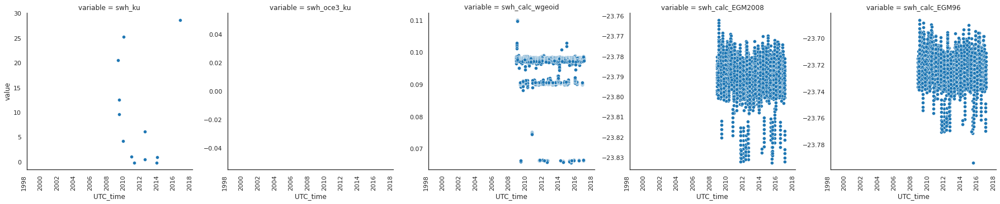

In [195]:
#%% #Plot PRI_ab test by season
sns.set_style('white')
sns.set_context('notebook')#, font_scale=1.5)
palette=sns.color_palette("light:#5A9", 13)

#to plot
df = pd.melt(final_df_geo_corrected[['lat','lon','time','topography','UTC_time','altimeter_sensor_name',
                                     'swh_ku', 'swh_oce3_ku',
                                     'swh_calc_wgeoid', 'swh_calc_EGM2008','swh_calc_EGM96']], 
             id_vars=['lat','lon','time','topography','altimeter_sensor_name','UTC_time'], value_vars=['swh_ku', 'swh_oce3_ku','swh_calc_wgeoid', 'swh_calc_EGM2008','swh_calc_EGM96'])
# df=final_df_geo_corrected.copy()
df['UTC_time']=df['UTC_time'].astype('datetime64[ns]')
df.reset_index(inplace=True)#, format='%Y-%m-%d %H:%M:%S')
# df['UTC_time']=df['UTC_time'].strptime('%Y-%m-%d %H:%M:%S')
# df=df[(df['year_month']!='2020-09')|(df['year_month']!='2020-08')]
# # df=df[(df['hour']<17)&(df['hour']>6)]

x_field='UTC_time'
y_field='value'
hue_field='altimeter_sensor_name'
facet_c='variable'
#kind_plot='box'

# kind_plot='line'
#x_axis_name='Hour'
#y_axis_name='PRI_ab'
#ylim=[0,1]
#df=df.loc[(df[y_field]<10) & (df[y_field]>=0)]


g_n=sns.relplot(data=df,x=x_field,y=y_field,facet_kws={'sharey': False, 'sharex': True},
                #hue=hue_field,
                #legend=True,# legend_out=True, fliersize=0, linewidth=0.8,
                palette=palette,#,#whis=whis,
                #kind=kind_plot)#, 
                #col_wrap=3,
                col=facet_c)#, #sharex=False, sharey=False, dodge=False)#, #col_order=facet_c_order,#col_wrap=4,
                 # order=hue_order,margin_titles=True
                 #row=facet_r,row_order=facet_r_order,
                #aspect=.9, dodge=False)#, height=height)
g_n.set_xticklabels(rotation=90, horizontalalignment='right')
plt.show()
del df

In [42]:
final_df_geo.columns
#final_df_geo['time'].head()
#final_df_geo['equator_time'].unique()
#Convert start date of altimeter to seg
# final_df_geo=add_UTC_column(final_df_geo, 'time','UTC_time')
# final_df_geo.head()

Index(['lat', 'lon', 'time', 'ice_range_ku', 'alt', 'topography',
       'range_ice3_ku', 'model_wet_tropo_corr',
       'model_wet_tropo_corr_direct_sol', 'model_dry_tropo_corr',
       'model_dry_tropo_corr_direct_sol', 'iono_corr_gim_ku',
       'sea_state_bias_ku', 'sea_state_bias_oce3_ku', 'solid_earth_tide',
       'pole_tide', 'geometry', 'mission_name', 'altimeter_sensor_name',
       'pass_number', 'equator_time', 'UTC_time', 'index_right', 'Hylak_id',
       'Lake_name', 'Country', 'Continent', 'Poly_src', 'Lake_type',
       'Grand_id', 'Lake_area', 'Shore_len', 'Shore_dev', 'Vol_total',
       'Vol_res', 'Vol_src', 'Depth_avg', 'Dis_avg', 'Res_time', 'Elevation',
       'Slope_100', 'Wshd_area', 'Pour_long', 'Pour_lat'],
      dtype='object')

In [11]:
final_df_geo['equator_time'].unique()

array(['2008-07-20 10:18:08.249000', '2008-10-17 16:04:54.433000',
       '2008-08-09 06:15:11.424000'], dtype=object)

In [12]:
final_df_geo.head()

,lat,lon,time,ice_range_ku,alt,topography,range_ice3_ku,model_wet_tropo_corr,model_wet_tropo_corr_direct_sol,model_dry_tropo_corr,model_dry_tropo_corr_direct_sol,iono_corr_gim_ku,sea_state_bias_ku,sea_state_bias_oce3_ku,geometry,mission_name,altimeter_sensor_name,pass_number,equator_time,UTC_time
0,-45.225478,284.391751,2.698633e+08,1.349602e+06,1.349612e+06,NaN,1.349602e+06,-0.0249,NaN,-2.3226,NaN,-0.0092,-0.0868,NaN,POINT (-75.60825 -45.22548),OSTM/Jason-2,Poseidon-3,215,2008-07-20 10:18:08.249000,2008-07-20 15:02:16.672625152
1,-45.223252,284.393753,2.698633e+08,1.349601e+06,1.349612e+06,NaN,1.349601e+06,-0.0249,NaN,-2.3226,NaN,-0.0092,-0.0870,NaN,POINT (-75.60625 -45.22325),OSTM/Jason-2,Poseidon-3,215,2008-07-20 10:18:08.249000,2008-07-20 15:02:16.723633152
2,-45.221026,284.395754,2.698633e+08,1.349600e+06,1.349611e+06,NaN,1.349600e+06,-0.0249,NaN,-2.3226,NaN,-0.0092,-0.0873,NaN,POINT (-75.60425 -45.22103),OSTM/Jason-2,Poseidon-3,215,2008-07-20 10:18:08.249000,2008-07-20 15:02:16.774640128
3,-45.218800,284.397756,2.698633e+08,1.349599e+06,1.349610e+06,NaN,1.349600e+06,-0.0249,NaN,-2.3226,NaN,-0.0092,-0.0875,NaN,POINT (-75.60224 -45.21880),OSTM/Jason-2,Poseidon-3,215,2008-07-20 10:18:08.249000,2008-07-20 15:02:16.825648128
4,-45.216573,284.399758,2.698633e+08,1.349599e+06,1.349609e+06,NaN,1.349599e+06,-0.0249,NaN,-2.3226,NaN,-0.0092,-0.0878,NaN,POINT (-75.60024 -45.21657),OSTM/Jason-2,Poseidon-3,215,2008-07-20 10:18:08.249000,2008-07-20 15:02:16.876656128


In [28]:
dfg=final_df_geo.loc[final_df_geo['equator_time']=='2008-07-20 10:18:08.249000'].copy()
dfg['UTC_time']=dfg['UTC_time'].dt.strftime('%Y-%m-%d %H:%M:%S')
final_df_geo['UTC_time']=final_df_geo['UTC_time'].dt.strftime('%Y-%m-%d %H:%M:%S')

dfg.shape
dfg.to_file(lake_path+'sample_orbit_215.shp')
#mask=dfg.within(df_lakes_in_orbit)
#df_track=dfg.loc[mask]
#df_track

/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
<ipython-input-28-2f72b08459a4>:6: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  dfg.to_file(lake_path+'sample_orbit_215.shp')


In [14]:
df_lakes_in_orbit.columns
dfg.head()

,lat,lon,time,ice_range_ku,alt,topography,range_ice3_ku,model_wet_tropo_corr,model_wet_tropo_corr_direct_sol,model_dry_tropo_corr,model_dry_tropo_corr_direct_sol,iono_corr_gim_ku,sea_state_bias_ku,sea_state_bias_oce3_ku,geometry,mission_name,altimeter_sensor_name,pass_number,equator_time,UTC_time
0,-45.225478,284.391751,2.698633e+08,1.349602e+06,1.349612e+06,NaN,1.349602e+06,-0.0249,NaN,-2.3226,NaN,-0.0092,-0.0868,NaN,POINT (-75.60825 -45.22548),OSTM/Jason-2,Poseidon-3,215,2008-07-20 10:18:08.249000,2008-07-20 15:02:16
1,-45.223252,284.393753,2.698633e+08,1.349601e+06,1.349612e+06,NaN,1.349601e+06,-0.0249,NaN,-2.3226,NaN,-0.0092,-0.0870,NaN,POINT (-75.60625 -45.22325),OSTM/Jason-2,Poseidon-3,215,2008-07-20 10:18:08.249000,2008-07-20 15:02:16
2,-45.221026,284.395754,2.698633e+08,1.349600e+06,1.349611e+06,NaN,1.349600e+06,-0.0249,NaN,-2.3226,NaN,-0.0092,-0.0873,NaN,POINT (-75.60425 -45.22103),OSTM/Jason-2,Poseidon-3,215,2008-07-20 10:18:08.249000,2008-07-20 15:02:16
3,-45.218800,284.397756,2.698633e+08,1.349599e+06,1.349610e+06,NaN,1.349600e+06,-0.0249,NaN,-2.3226,NaN,-0.0092,-0.0875,NaN,POINT (-75.60224 -45.21880),OSTM/Jason-2,Poseidon-3,215,2008-07-20 10:18:08.249000,2008-07-20 15:02:16
4,-45.216573,284.399758,2.698633e+08,1.349599e+06,1.349609e+06,NaN,1.349599e+06,-0.0249,NaN,-2.3226,NaN,-0.0092,-0.0878,NaN,POINT (-75.60024 -45.21657),OSTM/Jason-2,Poseidon-3,215,2008-07-20 10:18:08.249000,2008-07-20 15:02:16


In [29]:
dfg_in_lake=final_df_geo.sjoin(df_lakes_in_orbit, how='inner')
dfg_in_lake.columns

Index(['lat', 'lon', 'time', 'ice_range_ku', 'alt', 'topography',
       'range_ice3_ku', 'model_wet_tropo_corr',
       'model_wet_tropo_corr_direct_sol', 'model_dry_tropo_corr',
       'model_dry_tropo_corr_direct_sol', 'iono_corr_gim_ku',
       'sea_state_bias_ku', 'sea_state_bias_oce3_ku', 'geometry',
       'mission_name', 'altimeter_sensor_name', 'pass_number', 'equator_time',
       'UTC_time', 'index_right', 'Hylak_id', 'Lake_name', 'Country',
       'Continent', 'Poly_src', 'Lake_type', 'Grand_id', 'Lake_area',
       'Shore_len', 'Shore_dev', 'Vol_total', 'Vol_res', 'Vol_src',
       'Depth_avg', 'Dis_avg', 'Res_time', 'Elevation', 'Slope_100',
       'Wshd_area', 'Pour_long', 'Pour_lat'],
      dtype='object')

In [31]:

m=dfg['geometry'].explore(name='orbit')
#dfg['geometry'].explore(m=m, name='2008_0827')
dfg_in_lake.explore(name='segment',
                               m=m)

df_lakes_in_orbit.explore(column='Hylak_id',
                          m=m, #add to the map
                          tooltip='Hylak_id',
                          popup=True, # show all values in popup (on click)
                          tiles="CartoDB positron", # use "CartoDB positron" tiles
                          cmap="Set1", # use "Set1" matplotlib colormap
                          name='lakes'
                          )

folium.TileLayer('Stamen Toner', control=True).add_to(m)  # use folium to add alternative tiles
folium.LayerControl().add_to(m)  # use folium to add layer control
m


/home/angelica/.conda/envs/geo_env/lib/python3.9/site-packages/mapclassify/classifiers.py:891: RuntimeWarning: invalid value encountered in double_scalars
  gadf = 1 - self.adcm / adam


In [227]:
final_df_geo[final_df_geo.index.duplicated()]
final_df_geo.shape

(54575, 18)

In [124]:
#df_geo['geometry'].head()

#How to get the metadata on netCDF
meta_var=['mission_name', 'altimeter_sensor_name', 'pass_number','equator_time']
#nCDF_data.__dict__

nCDF_data['time'][:]

masked_array(data=[2.69621835e+08, 2.69621835e+08, 2.69621835e+08, ...,
                   2.69623095e+08, 2.69623095e+08, 2.69623095e+08],
             mask=False,
       fill_value=1e+20)

In [35]:
nCDir='/home/angelica/Dropbox/Research/LOCSS/data_products/compress/'

files = [f for f in os.listdir(nCDir) if os.path.isfile(os.path.join(nCDir, f))]

#for f in files:
#    print(f)
#    print(f[:-3])

nCDFs=dict()
for f in files:
    print(nCDir+f[:-3])
#    with gzip.open(nCDir+f, 'rb') as f_in:
#        with open((nCDir+f)[:-3], 'wb') as f_out:
#            shutil.copyfileobj(f_in, f_out)
    nCDF_data = nc.Dataset((nCDir+f))
    nCDFs[f]=nCDF_data
#    print(nCDir+f)
#    print(nCDF_data.dimensions['time'])
#1. Unzip
#2. Read
    
#nCDF_data = nc.Dataset("/home/angelica/Downloads/JA2_IPH_2PTP002_001_20080721_234556_20080722_001448.nc")
#print(nCDF_data.data_model) #Print the type of data model
#print('All metadata\n',nCDF_data)
#print('All metadata 2 with dictionary \n',nCDF_data.__dict__)

/home/angelica/Dropbox/Research/LOCSS/data_products/compress/JA2_IPH_2PTP003_143_20080806_105417_20080806_111518.nc
/home/angelica/Dropbox/Research/LOCSS/data_products/compress/JA2_IPH_2PTP002_143_20080727_125546_20080727_131646.nc
/home/angelica/Dropbox/Research/LOCSS/data_products/compress/JA2_IPH_2PTP001_143_20080717_145714_20080717_151815.nc


In [21]:

    
    
nCDF_data['swh_ku']
nCDF_data['swh_ku'][:]
nCDF_data['lat'][:]
nCDF_data['lon'][:]
nCDF_data['time'][:]
print(nCDF_data['swh_ku'].dimensions, nCDF_data['swh_ku'].shape)
print(nCDF_data['lat'].dimensions, nCDF_data['lat'].shape)
print(nCDF_data['lon'].dimensions, nCDF_data['lon'].shape)

var_get='swh_ku'
time_var='time'
lat='lat'
lon='lon'

#function
#Get lat and long
lats= nCDF_data[lat][:]
lons= nCDF_data[lon][:]
swhs= nCDF_data[var_get][:]
time= nCDF_data[time_var][:]
#print(len(lats))
#create list of pair coordinates
full_orbit=[]

for  i in range(0,len(lats)):
    full_orbit.append([lats[i],lons[i], time[i], swhs[i]])

df=pd.DataFrame(full_orbit, columns=[lat,lon,time_var,var_get])
df['geometry']=df.apply(lambda x: Point((float(x[lat]), float(x[lon]))), axis=1)
#Create the shape list dictionary

df_geo=gpd.GeoDataFrame(df,geometry='geometry')
print(df_geo.head())
df_geo.plot()

In [12]:
#access the dimmensions
for dim in nCDF_data.dimensions.values():
    print(dim)
    
print(nCDF_data.dimensions['time'])

<class 'netCDF4._netCDF4.Dimension'>: name = 'time', size = 25902
<class 'netCDF4._netCDF4.Dimension'>: name = 'time', size = 25902


In [62]:
#Access variables 
i=1
for var in nCDF_data.variables: #If I use only variables. I get the names  
    #print('\n***Variable Name: '+str(i)+'****:',var)
    #print('***Variable values: '+str(i)+'****\n',nCDF_data[var])
    i=i+1
    
nCDF_data

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF3_CLASSIC data model, file format NETCDF3):
    Conventions: CF-1.1
    title: IGDR - PISTACH high frequency Hydrological dataset
    institution: CNES/CLS
    source: radar altimeter
    history: 2009-04-15 19:51:50 : Creation
    contact: TBD
    references: TBD
    reference_document: OSTM/Jason-2 Products Handbook,CLS-DOS-NT-08.096 and PISTACH Jason-2 Product Handbook,  CLS-DOS-NT-XX.XXX
    mission_name: OSTM/Jason-2
    altimeter_sensor_name: Poseidon-3
    radiometer_sensor_name: AMR
    doris_sensor_name: DGXX
    cycle_number: 2
    absolute_rev_number: 228
    pass_number: 1
    absolute_pass_number: 255
    equator_time: 2008-07-21 23:46:43.540000
    equator_longitude: 99.93
    first_meas_time: 2008-07-21 23:45:56.163119
    last_meas_time: 2008-07-22 00:14:48.398675
    ellipsoid_axis: 6378136.3
    ellipsoid_flattening: 0.0033528131778969143
    dimensions(sizes): time(25902)
    variables(dimensions): float64 time(tim

('time',) (25902,)
('time',) (25902,)
('time',) (25902,)


/home/angelica/.conda/envs/geo_env/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


        lat        lon          time swh_ku               geometry
0 -2.323090  99.097720  2.699992e+08  2.604  POINT (-2.323 99.098)
1 -2.320589  99.098614  2.699992e+08  3.532  POINT (-2.321 99.099)
2 -2.318088  99.099507  2.699992e+08  2.141  POINT (-2.318 99.100)
3 -2.315587  99.100400  2.699992e+08  2.944  POINT (-2.316 99.100)
4 -2.313086  99.101294  2.699992e+08   2.99  POINT (-2.313 99.101)


<AxesSubplot:>

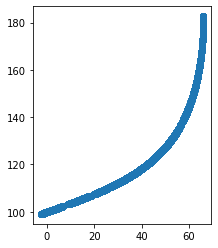

In [71]:
#function 


nCDF_data['swh_ku']
nCDF_data['swh_ku'][:]
nCDF_data['lat'][:]
nCDF_data['lon'][:]
nCDF_data['time'][:]
print(nCDF_data['swh_ku'].dimensions, nCDF_data['swh_ku'].shape)
print(nCDF_data['lat'].dimensions, nCDF_data['lat'].shape)
print(nCDF_data['lon'].dimensions, nCDF_data['lon'].shape)

var_get='swh_ku'
time_var='time'
lat='lat'
lon='lon'

#function
#Get lat and long
lats= nCDF_data[lat][:]
lons= nCDF_data[lon][:]
swhs= nCDF_data[var_get][:]
time= nCDF_data[time_var][:]
#print(len(lats))
#create list of pair coordinates
full_orbit=[]

for  i in range(0,len(lats)):
    full_orbit.append([lats[i],lons[i], time[i], swhs[i]])

df=pd.DataFrame(full_orbit, columns=[lat,lon,time_var,var_get])
df['geometry']=df.apply(lambda x: Point((float(x[lat]), float(x[lon]))), axis=1)
#Create the shape list dictionary

df_geo=gpd.GeoDataFrame(df,geometry='geometry')
print(df_geo.head())
df_geo.plot()
#df.to_file('MyGeometries.shp', driver='ESRI Shapefile')

In [57]:
data=[]
data.append([1,2, 'Lola'])
data.append([2,2, 'Pepe'])
data
df=pd.DataFrame(data, columns=['Nu1', 'Nu2', 'Nombre'])
df

,Nu1,Nu2,Nombre
0,1,2,Lola
1,2,2,Pepe
